In [ ]:
import pandas as pd

In [ ]:
drug_target_file_path ='/content/drive/MyDrive/Colab Notebooks/UPitt_AD/Drug_Target_map.csv'

#The file provided afterwards
drug_target_file_path_2 = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/ADP_SDOH_V02172024_Target_normal_scale_by0.666416963_median.csv'
#drugs we got
subset_paitent_drug_path = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/ADP_SDOH_psycho_normal_scale_by_0.589719314_median_mapped_enhanced.csv'
subset_paitent_drug_pd = pd.read_csv(subset_paitent_drug_path)

df_DEG = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/AD+P DEGs Original data.xlsx', engine = 'openpyxl')
df_protein_expression = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/PSD ADP Protein expression updated 240 10_25.csv')


path = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/idmapping_2024_02_12.xlsx'
drug_target_gene = pd.read_excel(path, engine = 'openpyxl')


/usr/local/lib/python3.10/dist-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


In [ ]:
#extract last column from the subset file
drugs = subset_paitent_drug_pd.iloc[:, -1]
# drugs


In [ ]:
drug_target_file_pd = pd.read_csv(drug_target_file_path)
# drug_target_file_pd

# Load the full database extracted CSV
full_db_path = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/full_database_extracted.csv'
full_db_df = pd.read_csv(full_db_path)

In [ ]:
#map drug ID to receptors
def map_drugID_to_receptor():
  pass

# Function to extract and map drug ID to receptors
def map_drug_to_receptor(df, column_name):
    # Dictionary to store the mappings
    drug_receptor_mapping = {}

    for entry in df[column_name]:
        # Split the entry by tab
        parts = entry.split('\t')

        # Check if the entry contains at least 3 parts (to ensure it has drug and receptor info)
        if len(parts) >= 3:
            # Extract the drug ID (before the first underscore)
            drug_id = parts[0].split('_')[0]

            # Extract the receptor information (last part of the entry)
            receptors = parts[-1]

            # Map the drug ID to the receptor information
            drug_receptor_mapping[drug_id] = receptors

    return drug_receptor_mapping

# Apply the function to the DataFrame
mapping = map_drug_to_receptor(subset_paitent_drug_pd, 'FeatureName')

# The resulting mapping
print(mapping)

{'AA1R': 'DB00193; DB00201; DB00277; DB00555; DB00640; DB00651; DB00806; DB00824; DB00996; DB01223; DB01303; DB01412; DB04932; DB04954; DB06471; DB09061; DB11757; DB12569; DB12670', 'CA2D1': 'DB00153; DB00228; DB00421; DB00622; DB00661; DB09235; DB11148; DB13746', 'CA2D2': 'DB00153; DB00228; DB00421; DB00622; DB00661; DB09235; DB11148; DB13746', 'KCNQ3': 'DB00228; DB01069; DB01110', 'KCNQ5': 'DB00228; DB01069; DB01110', 'A0A024R8I1': 'DB00063; DB00381; DB00996', 'CAC1B': 'DB00063; DB00381; DB00996', 'PGH1': 'DB00328', 'PGH2': 'DB00328', 'ADRB1': 'DB00182; DB00217; DB00264; DB00334; DB00540; DB00715; DB00726; DB00785; DB00867; DB01049; DB01118; DB01365; DB06726; DB11273; DB11278; DB13345', 'ADRB2': 'DB00182; DB00217; DB00264; DB00334; DB00540; DB00715; DB00726; DB00785; DB00867; DB01049; DB01118; DB01365; DB06726; DB11273; DB11278; DB13345', 'ADRB3': 'DB00182; DB00217; DB00264; DB00334; DB00540; DB00715; DB00726; DB00785; DB00867; DB01049; DB01118; DB01365; DB06726; DB11273; DB11278; DB

In [ ]:
#create a dataframe of the targets only
df_targets = pd.DataFrame({'Target': list(mapping.keys())})
df_targets

,Target
0,AA1R
1,CA2D1
2,CA2D2
3,KCNQ3
4,KCNQ5
...,...
980,FAK2
981,TAAR1
982,PUR1
983,PYRG1


In [ ]:
df = pd.DataFrame([(target, db_id) for target, ids in mapping.items() for db_id in ids.split('; ')],
                  columns=['Drug_Target', 'DrugBank_ID'])
df


,Drug_Target,DrugBank_ID
0,AA1R,DB00193
1,AA1R,DB00201
2,AA1R,DB00277
3,AA1R,DB00555
4,AA1R,DB00640
...,...,...
7185,PUR1,DB01033
7186,PUR1,DB01254
7187,PYRG1,DB00130
7188,GLNA,DB00130


In [ ]:
# Simplified extraction of drugs and their action types as inhibitors or activators
# Note: This assumes we have a way to match drugs from `full_database_extracted` to `ADP_SDOH`

# Extract drug names and their action where possible
drug_actions = {}
for index, row in full_db_df.iterrows():
    drug_name = row['Name']
    actions = row['Actions']
    # actions are stored in a list-like string representation
    if 'inhibitor' in actions:
        drug_actions[drug_name] = 'Inhibitor'
    elif 'activator' in actions or 'agonist' in actions:
        drug_actions[drug_name] = 'Activator'
    else:
        drug_actions[drug_name] = 'Unknown'

# Example output
list(drug_actions.items())[:5]  # Display the first 5 items for brevity

[('Lepirudin', 'Inhibitor'),
 ('Cetuximab', 'Activator'),
 ('Dornase alfa', 'Unknown'),
 ('Denileukin diftitox', 'Activator'),
 ('Etanercept', 'Unknown')]

In [ ]:
# Define the function to categorize drug action based on keywords in the 'Actions' column
def categorize_drug_action(actions_str):
    actions = eval(actions_str)  # Assuming the actions are stored in a string representation of a list
    if 'inhibitor' in actions:
        return 'Inhibitor'
    elif 'activator' in actions or 'agonist' in actions:
        return 'Activator'
    else:
        return 'Unknown'

# Apply the function to the 'Actions' column to categorize each drug
full_db_df['Action_Category'] = full_db_df['Actions'].apply(categorize_drug_action)

# Group by drug name and collect all unique action categories for each drug
grouped_actions = full_db_df.groupby('Name')['Action_Category'].apply(set).reset_index()

# Define a function to check if a drug has both 'Inhibitor' and 'Activator' actions
def has_dual_actions(action_set):
    return {'Inhibitor', 'Activator'}.issubset(action_set)

# Apply this function to filter drugs that meet the criteria
dual_action_drugs = grouped_actions[grouped_actions['Action_Category'].apply(has_dual_actions)]

# Extract names of drugs that are both inhibitors and activators
dual_action_drugs_list = dual_action_drugs['Name'].tolist()

# Print the list of drugs that are categorized as both inhibitors and activators
print(dual_action_drugs_list)

[]


In [ ]:
significant_targets = subset_paitent_drug_pd[subset_paitent_drug_pd['p_bonferroni_non_parameter'] < 0.05]['FeatureName'].unique()
significant_targets

array(['G47.33_Obstructive sleep apnea (adult) (pediatric)',
       '401.9_Unspecified essential hypertension',
       '311_Depressive disorder, not elsewhere classified',
       '599_Urinary tract infection, site not specified',
       '733_Osteoporosis, unspecified',
       'AA1R_HUMAN\tGABAPENTIN 800 MG TABLET\tDB00193; DB00201; DB00277; DB00555; DB00640; DB00651; DB00806; DB00824; DB00996; DB01223; DB01303; DB01412; DB04932; DB04954; DB06471; DB09061; DB11757; DB12569; DB12670',
       'CA2D1_HUMAN\tSPIRONOLACTONE 25 MG TABLET\tDB00153; DB00228; DB00421; DB00622; DB00661; DB09235; DB11148; DB13746',
       'CA2D2_HUMAN\tSPIRONOLACTONE 25 MG TABLET\tDB00153; DB00228; DB00421; DB00622; DB00661; DB09235; DB11148; DB13746',
       'A0A024R8I1_HUMAN\tGABAPENTIN 800 MG TABLET\tDB00063; DB00381; DB00996',
       'CAC1B_HUMAN\tSPIRONOLACTONE 25 MG TABLET\tDB00063; DB00381; DB00996',
       'PGH1_HUMAN\tOXYCODONE-ACETAMINOPHEN 5 MG-325 MG TABLET\tDB00328',
       'PGH2_HUMAN\tOXYCODONE-ACET

In [ ]:
#filtering drugs with a particular p value
def map_drug_to_receptor_with_p_value(df, feature_column_name, p_value_column_name):
    # Dictionary to store the mappings
    drug_receptor_mapping = {}

    # Filter dataframe based on p-value threshold
    filtered_df = df[df[p_value_column_name] < 0.05]

    for index, row in filtered_df.iterrows():
        entry = row[feature_column_name]
        p_value = row[p_value_column_name]

        # Split the entry by tab
        parts = entry.split('\t')

        # Check if the entry contains at least 3 parts (to ensure it has drug and receptor info)
        if len(parts) >= 3 and p_value < 0.05:
            # Extract the drug ID (assuming it's in one of the parts, adjust accordingly)
            drug_id = parts[1]  # Adjust based on the correct position of the drug ID in the entry

            # Extract the receptor information (assuming it's the last part of the entry)
            receptors = parts[-1]

            # Map the drug ID to the receptor information
            drug_receptor_mapping[drug_id] = receptors

    return drug_receptor_mapping

# Example usage (assuming 'subset_paitent_drug_pd' is your dataframe, 'FeatureName' is the column with drug and receptor info, and 'p_value' is the column with p-values)
mapping = map_drug_to_receptor_with_p_value(subset_paitent_drug_pd, 'FeatureName', 'p_bonferroni_non_parameter')

# The resulting mapping
print(mapping)


{'GABAPENTIN 800 MG TABLET': 'DB00063; DB00381; DB00996', 'SPIRONOLACTONE 25 MG TABLET': 'DB00421', 'OXYCODONE-ACETAMINOPHEN 5 MG-325 MG TABLET': 'DB00316; DB05036; DB09130', 'VENTOLIN HFA 90 MCG/ACTUATION AEROSOL INHALER': 'DB00182; DB00217; DB00264; DB00334; DB00540; DB00715; DB00726; DB00785; DB00867; DB01049; DB01118; DB01365; DB06726; DB11273; DB11278; DB13345', 'FELODIPINE ER 2.5 MG (PLENDIL) 24 HR TABLET': 'DB00477; DB00527; DB00622; DB00623; DB00753; DB00831; DB00836; DB00850; DB00925; DB01023; DB01065; DB01069; DB01100; DB01115; DB01244; DB01373; DB01429; DB02868; DB03900; DB03977; DB04209; DB04513; DB04825; DB04841; DB08039; DB08231; DB11093; DB11348; DB13800; DB14481', 'ESCITALOPRAM 5 MG TABLET': 'DB00182; DB00191; DB00245; DB00285; DB00408; DB00422; DB00454; DB00458; DB00476; DB00543; DB00579; DB00721; DB00726; DB00745; DB00830; DB00852; DB00865; DB00907; DB00937; DB00988; DB01104; DB01105; DB01114; DB01146; DB01149; DB01156; DB01161; DB01175; DB01238; DB01363; DB01442; DB0

In [ ]:
#Working function
# Function to extract and map drug ID to receptors, drug targets with P values <0.05
def map_drug_to_receptor(df, column_name,p_value_column_name):
    # Dictionary to store the mappings
    drug_receptor_mapping = {}

    # Filter dataframe based on p-value threshold
    filtered_df = df[df[p_value_column_name] < 0.05]

    for index, row in filtered_df.iterrows():
        entry = row[column_name]
        p_value = row[p_value_column_name]
        # Split the entry by tab
        parts = entry.split('\t')

        # Check if the entry contains at least 3 parts (to ensure it has drug and receptor info)
        if len(parts) >= 3:
            # Extract the drug ID (before the first underscore)
            drug_id = parts[0].split('_')[0]

            # Extract the receptor information (last part of the entry)
            receptors = parts[-1]

            # Map the drug ID to the receptor information
            drug_receptor_mapping[drug_id] = receptors

    return drug_receptor_mapping

# # Apply the function to the DataFrame
mapping = map_drug_to_receptor(subset_paitent_drug_pd, 'FeatureName', 'p_bonferroni_non_parameter')

# The resulting mapping
print(mapping)

{'AA1R': 'DB00193; DB00201; DB00277; DB00555; DB00640; DB00651; DB00806; DB00824; DB00996; DB01223; DB01303; DB01412; DB04932; DB04954; DB06471; DB09061; DB11757; DB12569; DB12670', 'CA2D1': 'DB00153; DB00228; DB00421; DB00622; DB00661; DB09235; DB11148; DB13746', 'CA2D2': 'DB00153; DB00228; DB00421; DB00622; DB00661; DB09235; DB11148; DB13746', 'A0A024R8I1': 'DB00063; DB00381; DB00996', 'CAC1B': 'DB00063; DB00381; DB00996', 'PGH1': 'DB00328', 'PGH2': 'DB00328', 'ADRB1': 'DB00182; DB00217; DB00264; DB00334; DB00540; DB00715; DB00726; DB00785; DB00867; DB01049; DB01118; DB01365; DB06726; DB11273; DB11278; DB13345', 'ADRB2': 'DB00182; DB00217; DB00264; DB00334; DB00540; DB00715; DB00726; DB00785; DB00867; DB01049; DB01118; DB01365; DB06726; DB11273; DB11278; DB13345', 'ADRB3': 'DB00182; DB00217; DB00264; DB00334; DB00540; DB00715; DB00726; DB00785; DB00867; DB01049; DB01118; DB01365; DB06726; DB11273; DB11278; DB13345', 'CALM': 'DB00477; DB00527; DB00622; DB00623; DB00753; DB00831; DB008

In [ ]:
len(mapping)

985

In [ ]:
import requests

# Example for a single target, extend this for multiple targets using a loop
# target = 'TP53'  # Example target protein
import networkx as nx
import matplotlib.pyplot as plt
import requests

# drug_targets_dict contains drug targets

drug_targets_dict = map_drug_to_receptor(subset_paitent_drug_pd, 'FeatureName', 'p_bonferroni_non_parameter')

# Initialize the PPI network graph
G = nx.Graph()

# Function to fetch PPI data and update the graph
def add_proteins_to_network(target, G):
    formulated_target = target if target.endswith('_HUMAN') else f"{target}_HUMAN"
    api_url = f"https://string-db.org/api/json/network?identifiers={formulated_target}&species=9606"
    response = requests.get(api_url)
    ppi_data = response.json()
    print (ppi_data)
    try:
        ppi_data = response.json()
        if 'Error' in ppi_data:  # Check if the response contains an error message
            print(f"Error retrieving data for {formulated_target}: {ppi_data['ErrorMessage']}")
            return
    except ValueError:  # Catches JSON decoding errors
        print(f"Failed to decode JSON response for {formulated_target}")
    for interaction in ppi_data:
        # Assuming the JSON structure has these fields
        protein1 = interaction['preferredName_A']
        protein2 = interaction['preferredName_B']

        # Add nodes and an edge between them for each interaction
        G.add_node(protein1)
        G.add_node(protein2)
        G.add_edge(protein1, protein2)

# Iterate over all drug targets and add their interactions to the graph
for target in drug_targets_dict.keys():
    add_proteins_to_network(target, G)



[{'stringId_A': '9606.ENSP00000241356', 'stringId_B': '9606.ENSP00000367872', 'preferredName_A': 'ADORA3', 'preferredName_B': 'GNB1', 'ncbiTaxonId': '9606', 'score': 0.412, 'nscore': 0, 'fscore': 0, 'pscore': 0, 'ascore': 0, 'escore': 0.129, 'dscore': 0, 'tscore': 0.353}, {'stringId_A': '9606.ENSP00000241356', 'stringId_B': '9606.ENSP00000498610', 'preferredName_A': 'ADORA3', 'preferredName_B': 'SLC29A1', 'ncbiTaxonId': '9606', 'score': 0.49, 'nscore': 0, 'fscore': 0, 'pscore': 0, 'ascore': 0.062, 'escore': 0.045, 'dscore': 0, 'tscore': 0.477}, {'stringId_A': '9606.ENSP00000241356', 'stringId_B': '9606.ENSP00000361965', 'preferredName_A': 'ADORA3', 'preferredName_B': 'ADA', 'ncbiTaxonId': '9606', 'score': 0.649, 'nscore': 0, 'fscore': 0, 'pscore': 0, 'ascore': 0, 'escore': 0, 'dscore': 0, 'tscore': 0.649}, {'stringId_A': '9606.ENSP00000241356', 'stringId_B': '9606.ENSP00000356205', 'preferredName_A': 'ADORA3', 'preferredName_B': 'ADORA1', 'ncbiTaxonId': '9606', 'score': 0.907, 'nscore'

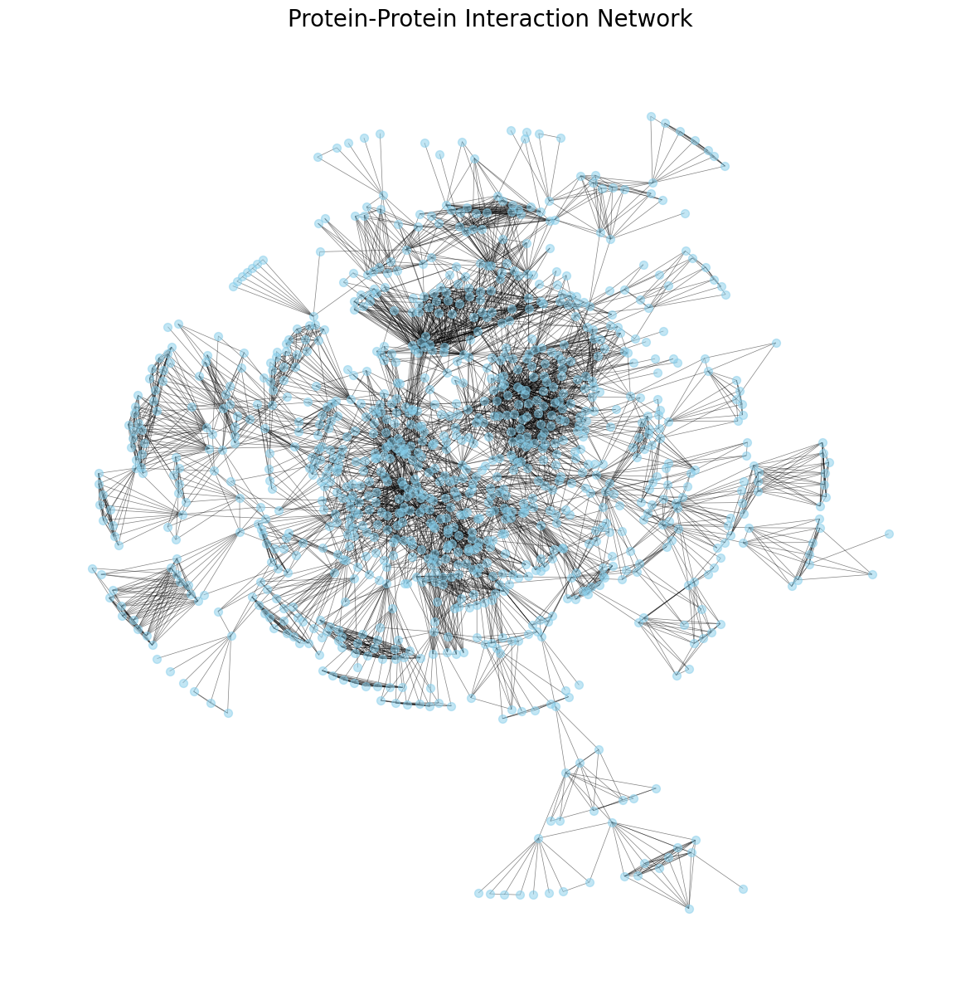

In [ ]:
# Use a layout that can spread nodes more, like the Kamada-Kawai layout for large graphs
pos = nx.kamada_kawai_layout(G)

# Drawing the PPI network with no labels for clarity
plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(G, pos, node_size=50, node_color='skyblue', alpha=0.5)
nx.draw_networkx_edges(G, pos, width=0.5, alpha=0.5)

# Omit labels to reduce clutter
# nx.draw_networkx_labels(G, pos, font_size=5) # Uncomment this line if you really need the labels

plt.title('Protein-Protein Interaction Network', size=20)
plt.axis('off')  # Turn off the axis for better presentation
plt.show()


In [ ]:
import requests

# Example for a single target, extend this for multiple targets using a loop
import networkx as nx
import matplotlib.pyplot as plt
import requests

# drug_targets_dict contains drug targets

drug_targets_dict = map_drug_to_receptor(subset_paitent_drug_pd, 'FeatureName', 'FDR_Q_non_parameter')

# Initialize the PPI network graph
N = nx.Graph()

# Function to fetch PPI data and update the graph
def add_proteins_to_network(target, N):
    formulated_target = target if target.endswith('_HUMAN') else f"{target}_HUMAN"
    api_url = f"https://string-db.org/api/json/network?identifiers={formulated_target}&species=9606"
    response = requests.get(api_url)
    ppi_data = response.json()
    print (ppi_data)
    try:
        ppi_data = response.json()
        if 'Error' in ppi_data:  # Check if the response contains an error message
            print(f"Error retrieving data for {formulated_target}: {ppi_data['ErrorMessage']}")
            return
    except ValueError:  # Catches JSON decoding errors
        print(f"Failed to decode JSON response for {formulated_target}")
    for interaction in ppi_data:
        # Assuming the JSON structure has these fields
        protein1 = interaction['preferredName_A']
        protein2 = interaction['preferredName_B']

        # Add nodes and an edge between them for each interaction
        N.add_node(protein1)
        N.add_node(protein2)
        N.add_edge(protein1, protein2)

# Iterate over all drug targets and add their interactions to the graph
for target in drug_targets_dict.keys():
    add_proteins_to_network(target, N)



[{'stringId_A': '9606.ENSP00000241356', 'stringId_B': '9606.ENSP00000367872', 'preferredName_A': 'ADORA3', 'preferredName_B': 'GNB1', 'ncbiTaxonId': '9606', 'score': 0.412, 'nscore': 0, 'fscore': 0, 'pscore': 0, 'ascore': 0, 'escore': 0.129, 'dscore': 0, 'tscore': 0.353}, {'stringId_A': '9606.ENSP00000241356', 'stringId_B': '9606.ENSP00000498610', 'preferredName_A': 'ADORA3', 'preferredName_B': 'SLC29A1', 'ncbiTaxonId': '9606', 'score': 0.49, 'nscore': 0, 'fscore': 0, 'pscore': 0, 'ascore': 0.062, 'escore': 0.045, 'dscore': 0, 'tscore': 0.477}, {'stringId_A': '9606.ENSP00000241356', 'stringId_B': '9606.ENSP00000361965', 'preferredName_A': 'ADORA3', 'preferredName_B': 'ADA', 'ncbiTaxonId': '9606', 'score': 0.649, 'nscore': 0, 'fscore': 0, 'pscore': 0, 'ascore': 0, 'escore': 0, 'dscore': 0, 'tscore': 0.649}, {'stringId_A': '9606.ENSP00000241356', 'stringId_B': '9606.ENSP00000356205', 'preferredName_A': 'ADORA3', 'preferredName_B': 'ADORA1', 'ncbiTaxonId': '9606', 'score': 0.907, 'nscore'

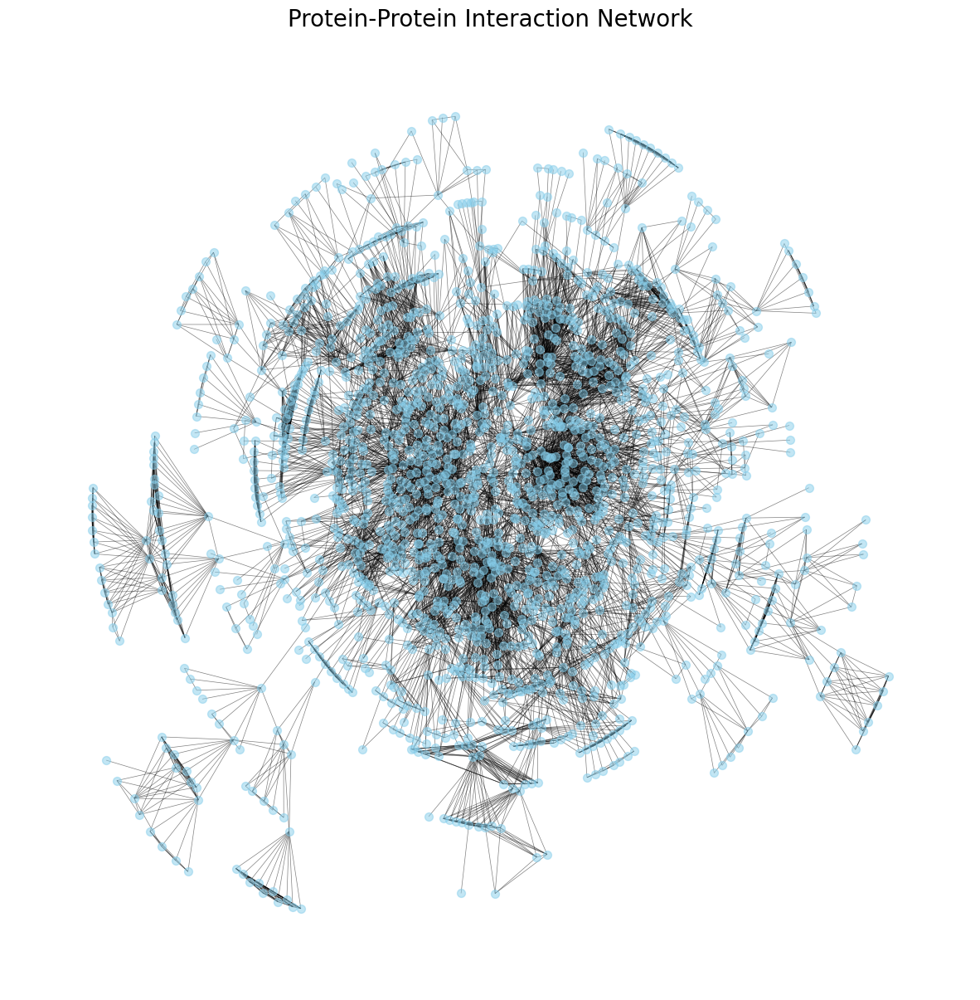

In [ ]:
# Use a layout that can spread nodes more, like the Kamada-Kawai layout for large graphs
pos = nx.kamada_kawai_layout(N)

# Drawing the PPI network with no labels for clarity
plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(N, pos, node_size=50, node_color='skyblue', alpha=0.5)
nx.draw_networkx_edges(N, pos, width=0.5, alpha=0.5)

# Omit labels to reduce clutter
# nx.draw_networkx_labels(G, pos, font_size=5) # Uncomment this line if you really need the labels

plt.title('Protein-Protein Interaction Network', size=20)
plt.axis('off')  # Turn off the axis for better presentation
plt.show()

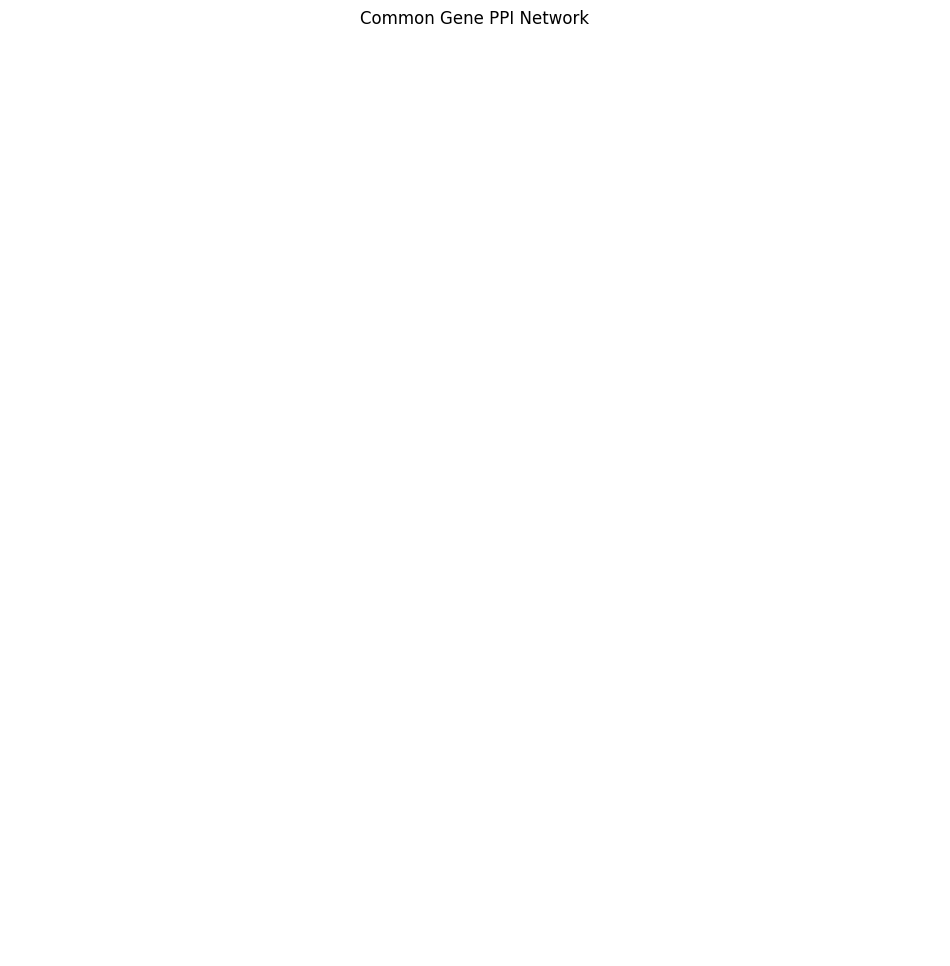

In [ ]:

#No common genes
import pandas as pd
import requests
import networkx as nx
import matplotlib.pyplot as plt

# Load CSV files
df_DEG = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/AD+P DEGs Original data.xlsx')
df_protein_expression = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/PSD ADP Protein expression updated 240 10_25.csv')

# Extract 'Gene' columns and find common genes
common_genes = set(df_DEG['Gene']) & set(df_protein_expression['protein']) #no common genes were found

# Initialize the PPI network graph
P = nx.Graph()

# Function to fetch PPI data and update the graph for each common gene
def add_genes_to_network(genes, P):
    for gene in genes:
        api_url = f"https://string-db.org/api/json/network?identifiers={gene}&species=9606"
        response = requests.get(api_url)
        if response.status_code == 200:
            ppi_data = response.json()
            for interaction in ppi_data:
                protein1 = interaction.get('preferredName_A')
                protein2 = interaction.get('preferredName_B')
                if protein1 and protein2:
                    P.add_node(protein1)
                    P.add_node(protein2)
                    P.add_edge(protein1, protein2)

# Add interactions of common genes to the network graph
add_genes_to_network(common_genes, P)

# Drawing the PPI network with a layout to spread out the nodes
pos = nx.spring_layout(P, k=0.1, iterations=50)  # Adjust as needed
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(P, pos, node_size=50, node_color='lightblue', alpha=0.7)
nx.draw_networkx_edges(P, pos, edge_color='grey', alpha=0.7)
plt.title('Common Gene PPI Network')
plt.axis('off')
plt.show()


In [ ]:
#common genes (between DEG and drug targets)

df_DEG = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/AD+P DEGs Original data.xlsx')
# Extract 'Gene' columns and find common genes
common_genes_2 = set(df_DEG['Gene']) & set(df_targets['Target'])
common_genes_2

{'ABCC8',
 'ADCY1',
 'C1R',
 'CALB2',
 'CALM3',
 'CAPS2',
 'CIB2',
 'EBP',
 'FGFR2',
 'HDAC3',
 'HRH3',
 'KCNB1',
 'KCNC1',
 'KCNC3',
 'KCNJ3',
 'KCNJ6',
 'KCNS1',
 'L1CAM',
 'LIAS',
 'P2RY2',
 'PDE7A',
 'PDE8A',
 'PDPK1',
 'PPARG',
 'PZP',
 'RCAN1',
 'S100B',
 'SCN2B',
 'SCN3A',
 'SV2A',
 'TRPM4'}

In [ ]:
df_DEG['Gene']
subset_paitent_drug_pd['FeatureName']

0       715.9_Osteoarthrosis, unspecified whether gene...
1       G47.33_Obstructive sleep apnea (adult) (pediat...
2       724.02_Spinal stenosis, lumbar region, without...
3                401.9_Unspecified essential hypertension
4                                  380.4_Impacted cerumen
                              ...                        
2174                                      PRE ALBUMIN_nan
2175                              BLOOD UREA NITROGEN_nan
2176         756.7_Anomaly of abdominal wall, unspecified
2177                                 EPITHELIAL CELLS_nan
2178               315.9_Unspecified delay in development
Name: FeatureName, Length: 2179, dtype: object

In [ ]:
import requests
import networkx as nx
import matplotlib.pyplot as plt

def fetch_ppi_data(identifiers):
    G = nx.Graph()
    for identifier in identifiers:
        api_url = f"https://string-db.org/api/json/network?identifiers={identifier}&species=9606"
        response = requests.get(api_url)
        if response.status_code == 200:
            ppi_data = response.json()
            for interaction in ppi_data:
                G.add_edge(interaction['preferredName_A'], interaction['preferredName_B'])
    return G


#'Gene' and 'Protein' columns contain the respective gene and protein names.
# Extract the 'Gene' and 'Protein' columns into separate lists
list_of_genes = df_DEG['Gene'].dropna().unique().tolist()
list_of_proteins = df_protein_expression['protein'].dropna().unique().tolist()

# Output the lists
print("List of Genes:", list_of_genes)
print("List of Proteins:", list_of_proteins)

# Create PPI networks
G_genes = fetch_ppi_data(list_of_genes)
G_proteins = fetch_ppi_data(list_of_proteins)



List of Genes: ['PPP1R14A', 'LINC00173', 'ARHGEF25', 'PLLP', 'CCDC58', 'ASCL1', 'ESRG', 'LINC01537', 'BEND3', 'ZNF133', 'TAF15', 'NOM1', 'LOH12CR2', 'NIPAL3', 'PHLPP1', 'EPSTI1', 'TRERF1', 'TACO1', 'HAT1', 'SSPN', 'MTCL1', 'LOC100132781', 'ADAM10', 'MASTL', 'TNFRSF11A', 'CAMKV', 'LINC01551', 'NPIPB11', 'GPX7', 'CNTN5', 'CHST5', 'PARP4', 'ALG5', 'SSTR1', 'DNASE2', 'C12orf42', 'SYT10', 'ZNF581', 'SHE', 'ZNF486', 'CAMK2A', 'ZIC4', 'GUSBP2', 'VAMP3', 'DYNLT1', 'GRM1', 'CEACAM19', 'FIRRE', 'SIRT3', 'CXorf36', 'SHC3', 'ZNF667', 'TMEM74B', 'HPS5', 'TOR3A', 'THAP1', 'C19orf60', 'MYT1L-AS1', 'RENBP', 'AGPAT4-IT1', 'GPR160', 'GOLGA6L9', 'PHF7', 'EFCAB14', 'GRM6', 'PPL', 'UBOX5-AS1', 'LHFPL3-AS2', 'BTBD9', 'KLK6', 'RNF212', 'LACC1', 'HPCAL4', 'CABP4', 'STAG3L4', 'CHRNB2', 'INSL6', 'TMEM132D', 'STRIP1', 'LDOC1', 'SCD', 'FRMD4B', 'IDS', 'FXYD6', 'DPYSL3', 'CKAP4', 'RASGEF1A', 'SEC22B', 'RAB15', 'GULP1', 'DTWD2', 'RNF112', 'CLIC4', 'COL5A2', 'PNLDC1', 'TTLL9', 'CIB2', 'RNF20', 'TTC7B', 'DDX52', 'DDX

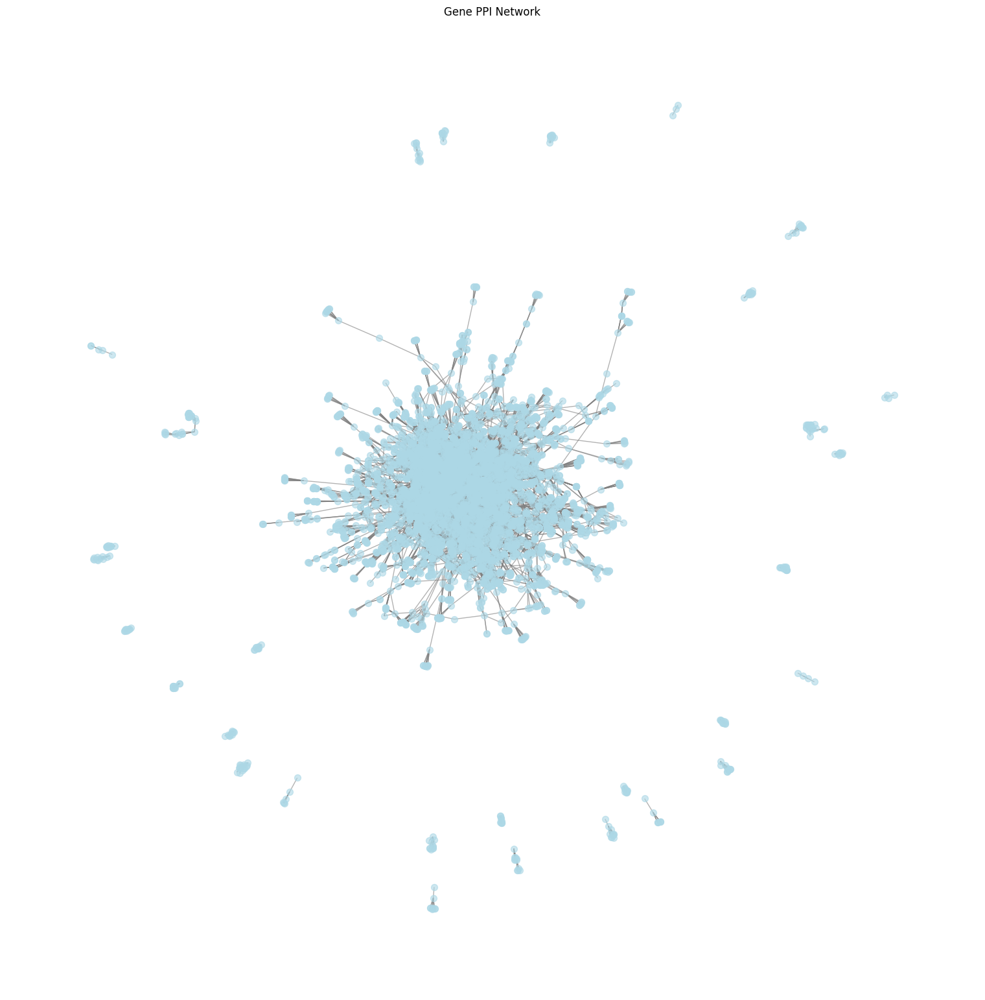

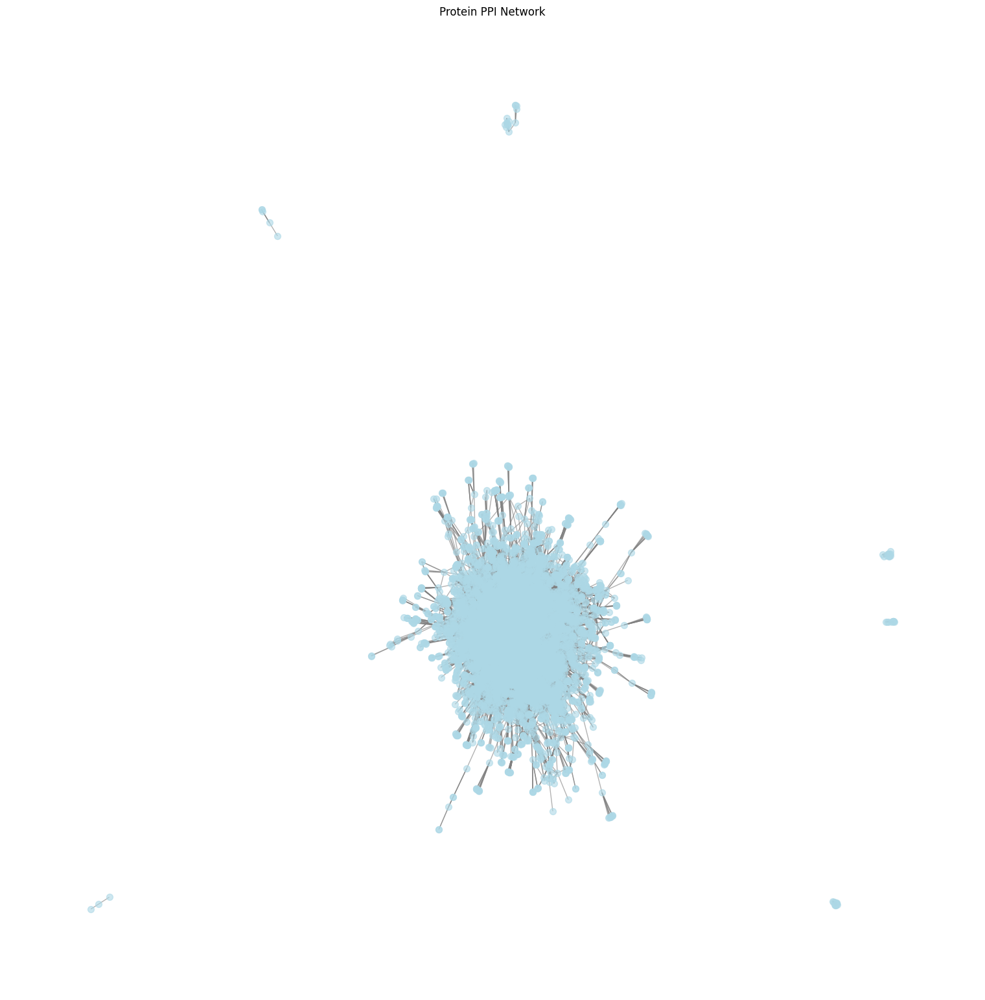

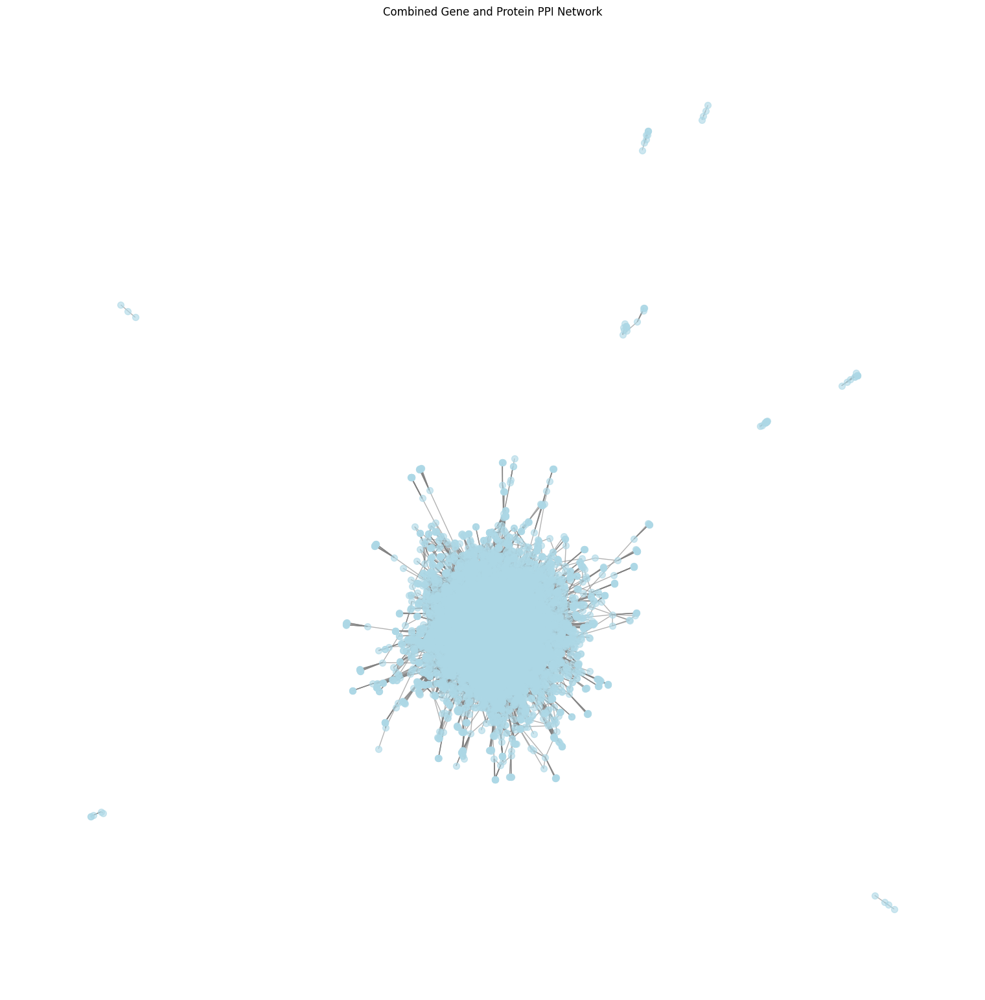

In [ ]:


# # Create PPI networks for genes and proteins
# G_genes = create_ppi_network(genes_list)
# G_proteins = create_ppi_network(proteins_list)

# Function to visualize a PPI network
def visualize_ppi_network(G, title):
    # Use the spring layout algorithm to position nodes
    pos = nx.spring_layout(G)
    plt.figure(figsize=(15, 15))
    nx.draw(G, pos, with_labels=False, node_color='lightblue', edge_color='grey', alpha=0.6, node_size=50, font_size=8)
    plt.title(title)
    plt.axis('off')
    plt.show()


# Visualize the separate PPI networks
visualize_ppi_network(G_genes, 'Gene PPI Network')
visualize_ppi_network(G_proteins, 'Protein PPI Network')

# Combine the gene and protein networks
G_combined = nx.compose(G_genes, G_proteins)

# Visualize the combined PPI network
visualize_ppi_network(G_combined, 'Combined Gene and Protein PPI Network')


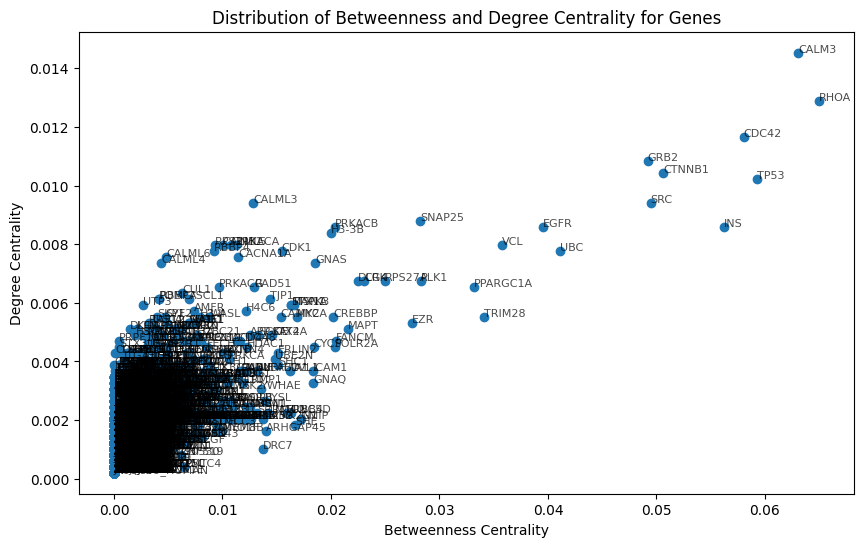

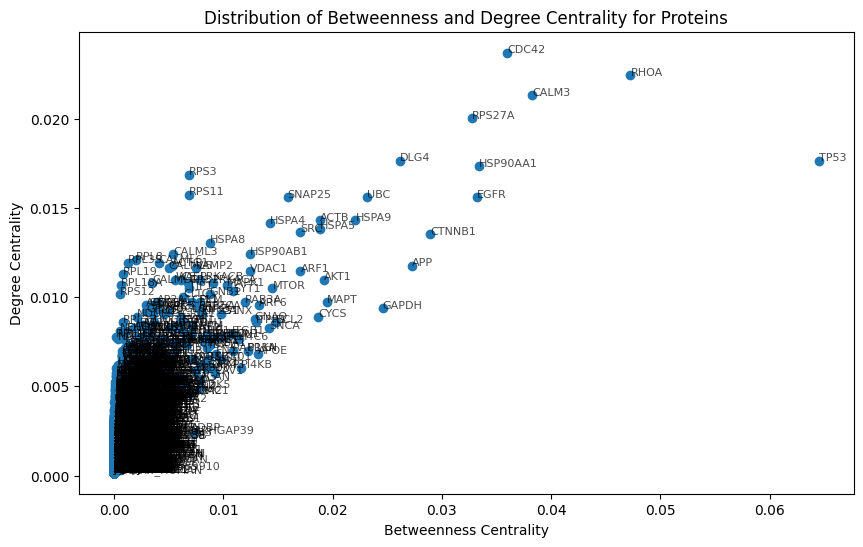

In [ ]:
#Trying a different visualization

import networkx as nx
import matplotlib.pyplot as plt

# # Assuming create_ppi_network is a function that generates a PPI network with centrality measures


# # Function to visualize the distribution of centrality measures
# def visualize_centrality_distribution(G, title):
#     degree_centrality = nx.degree_centrality(G)
#     betweenness_centrality = nx.betweenness_centrality(G)

#     # Extract the centrality values and corresponding labels
#     degrees = [degree_centrality[node]*len(G.nodes()) for node in G.nodes()]  # Multiply by len(G.nodes()) for actual degree
#     betweenness = list(betweenness_centrality.values())
#     labels = list(G.nodes())

#     # Create a scatter plot
#     plt.figure(figsize=(10, 6))
#     plt.scatter(betweenness, degrees)

#     # Annotate points with labels
#     for i, label in enumerate(labels):
#         plt.annotate(label, (betweenness[i], degrees[i]), fontsize=8, alpha=0.7)

#     # Set the title and labels
#     plt.title(title)
#     plt.xlabel('Betweenness Centrality')
#     plt.ylabel('Degree Centrality (normalized)')

#     # Show the plot
#     plt.show()






import networkx as nx
import matplotlib.pyplot as plt
import requests

def fetch_ppi_data(identifiers):
    G = nx.Graph()
    for identifier in identifiers:
        api_url = f"https://string-db.org/api/json/network?identifiers={identifier}&species=9606"
        response = requests.get(api_url)
        if response.status_code == 200:
            ppi_data = response.json()
            for interaction in ppi_data:
                G.add_edge(interaction['preferredName_A'], interaction['preferredName_B'])
    return G

def visualize_centrality_distribution(G, title):
    degree_centrality = nx.degree_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G)

    degrees = [degree_centrality[node] for node in G.nodes()]
    betweenness = [betweenness_centrality[node] for node in G.nodes()]
    labels = list(G.nodes())

    plt.figure(figsize=(10, 6))
    plt.scatter(betweenness, degrees)

    for i, label in enumerate(labels):
        plt.annotate(label, (betweenness[i], degrees[i]), fontsize=8, alpha=0.7)

    plt.title(title)
    plt.xlabel('Betweenness Centrality')
    plt.ylabel('Degree Centrality')
    plt.show()


# Create PPI networks
G_genes = fetch_ppi_data(list_of_genes)
G_proteins = fetch_ppi_data(list_of_proteins)
# Combine the gene and protein networks
G_combined = nx.compose(G_genes, G_proteins)


# Visualize the distribution for each network
visualize_centrality_distribution(G_genes, 'Distribution of Betweenness and Degree Centrality for Genes')
visualize_centrality_distribution(G_proteins, 'Distribution of Betweenness and Degree Centrality for Proteins')



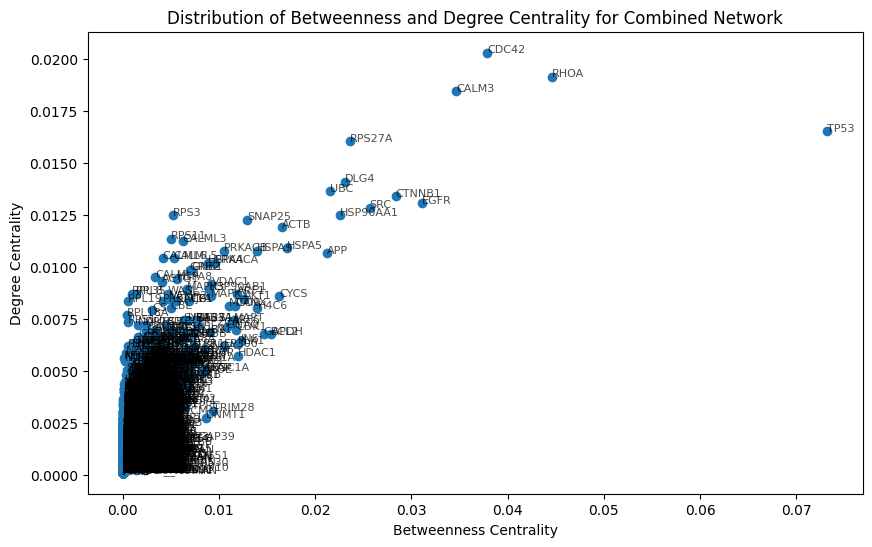

In [ ]:
visualize_centrality_distribution(G_combined, 'Distribution of Betweenness and Degree Centrality for Combined Network')

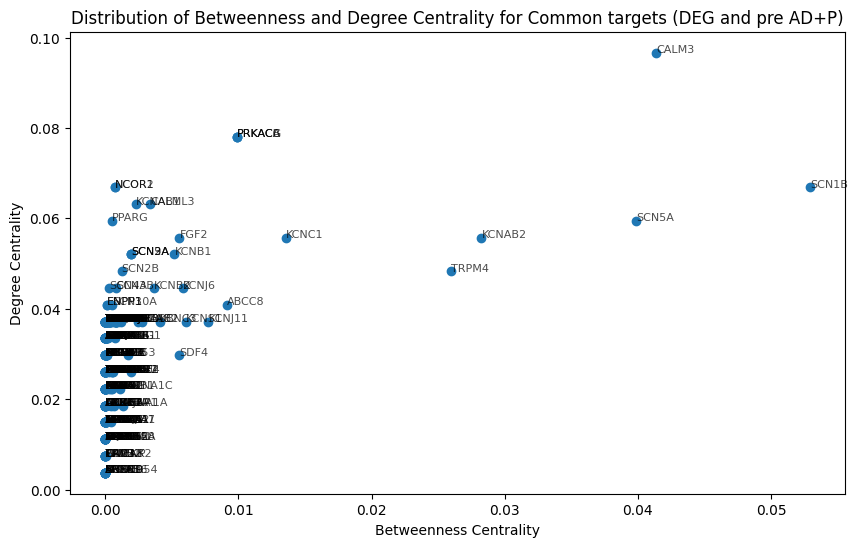

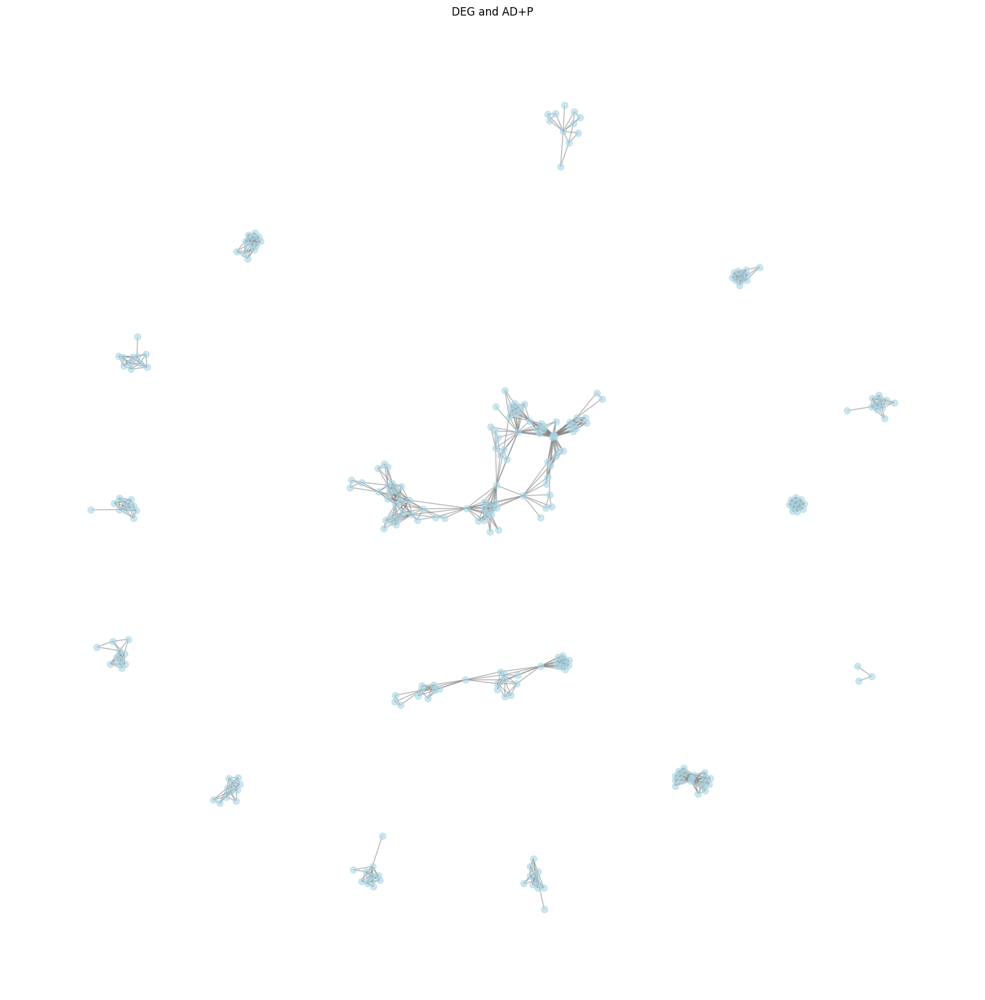

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import requests

def fetch_ppi_data(identifiers):
    G = nx.Graph()
    for identifier in identifiers:
        api_url = f"https://string-db.org/api/json/network?identifiers={identifier}&species=9606"
        response = requests.get(api_url)
        if response.status_code == 200:
            ppi_data = response.json()
            for interaction in ppi_data:
                G.add_edge(interaction['preferredName_A'], interaction['preferredName_B'])
    return G

def visualize_centrality_distribution(G, title):
    degree_centrality = nx.degree_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G)

    degrees = [degree_centrality[node] for node in G.nodes()]
    betweenness = [betweenness_centrality[node] for node in G.nodes()]
    labels = list(G.nodes())

    plt.figure(figsize=(10, 6))
    plt.scatter(betweenness, degrees)

    for i, label in enumerate(labels):
        plt.annotate(label, (betweenness[i], degrees[i]), fontsize=8, alpha=0.7)

    plt.title(title)
    plt.xlabel('Betweenness Centrality')
    plt.ylabel('Degree Centrality')
    plt.show()

# Function to visualize a PPI network
def visualize_ppi_network(G, title):
    # Use the spring layout algorithm to position nodes
    pos = nx.spring_layout(G)
    plt.figure(figsize=(15, 15))
    nx.draw(G, pos, with_labels=False, node_color='lightblue', edge_color='grey', alpha=0.6, node_size=50, font_size=8)
    plt.title(title)
    plt.axis('off')
    plt.show()

#targets common with DEG and pre AD+P
G_targets = fetch_ppi_data(common_genes_2)
visualize_centrality_distribution(G_targets, 'Distribution of Betweenness and Degree Centrality for Common targets (DEG and pre AD+P)')
visualize_ppi_network(G_targets, 'DEG and AD+P')

In [ ]:
len(common_genes_2)

31

In [ ]:
len(df_DEG['Gene'])

727

In [ ]:
len(df_targets['Target'])

985

In [ ]:
print(len(list_of_proteins))
# print(list_of_proteins)
df_proteins_1 = df_protein_expression['protein']
filtered_df = df_protein_expression[df_protein_expression['P.Value'] < 0.05]['protein']

df_protein_genes = df_protein_expression[df_protein_expression['P.Value'] < 0.05]['external_gene_name']

print(df_protein_genes)
print(len(df_protein_genes))
# print(filtered_df)
# print(df_proteins_1)
#convert list into a dataframe
df_proteins = pd.DataFrame(list_of_proteins, columns=['protein'])

# print(df_proteins)
#df_proteins_1 is the same as df_proteins

#common between protein expression and drug target
common_genes_3 = set(df_proteins['protein']) & set(df_targets['Target'])

common_genes_4 = set(df_protein_genes) & set(df_targets['Target'])
# print(common_genes_3)
len(common_genes_4)

1613
0       AHNAK2
1         PSAP
2        SYNPO
3       CLASP1
4      TBC1D17
        ...   
235     LRSAM1
236      HIP1R
237      FARP1
238    GRIPAP1
239     TOMM20
Name: external_gene_name, Length: 240, dtype: object
240


5

In [ ]:
# df_DEG = pd.read_excel(/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/AD+P DEGs Original data.xlsx')
df_protein_expression = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/PSD ADP Protein expression updated 240 10_25.csv')
df_protein_genes = df_protein_expression[df_protein_expression['P.Value'] < 0.05]['external_gene_name']
# print(type(df_protein_genes))
# print(drug_target_gene)
common_genes_5 = set(df_protein_genes) & set(drug_target_gene['Gene Names'])

In [ ]:
# df_targets['Target']
print(len(common_genes_5))
print(len(df_protein_genes)) #Set1
print(len(drug_target_gene['Gene Names'])) #set2

2
240
201


In [ ]:
common_genes_5

{'PRKAG1', nan}

In [ ]:
import requests

def map_protein_to_gene(protein_ids):
    url = "https://rest.uniprot.org/idmapping/run"
    headers = {"Content-Type": "application/json"}
    data = {
        "ids": protein_ids,
        "from": "UniProtKB_AC-ID",
        "to": "GENENAME"
    }
    response = requests.post(url, json=data, headers=headers)
    if response.status_code == 200:
        job_id = response.json()['jobId']
        results_url = f"https://rest.uniprot.org/idmapping/results/{job_id}"
        results = requests.get(results_url)
        if results.status_code == 200:
            return results.json()  # This will contain the mapping
        else:
            print("Error retrieving results")
    else:
        print("Error submitting job")
    return None

# protein_ids = filtered_df.tolist()
# gene_mapping = map_protein_to_gene(protein_ids)

if gene_mapping:
    print(gene_mapping)
else:
    print("No mapping found")


NameError: name 'gene_mapping' is not defined

In [ ]:
import requests
import networkx as nx
import matplotlib.pyplot as plt

import requests
import time

#code block to convert drug target data to gene

import requests
import time

# def map_protein_to_gene_2(targets):

#     # Define the request URL and headers
#     url = "https://rest.uniprot.org/idmapping/run"
#     headers = {"Content-Type": "application/json"}

#     # Define the request payload with correct 'from' and 'to' parameters
#     data = {
#         "ids": targets,  # Splitting the string to make a list
#         "from": "UniProtKB_AC-ID",
#         "to": "UniProtKB"
#     }

#     # Send the request
#     response = requests.post(url, json=data, headers=headers)

#     # Check for successful request submission
#     if response.status_code == 200:
#         job_id = response.json()['jobId']

#         # Check job status
#         status_url = f"https://rest.uniprot.org/idmapping/status/{job_id}"
#         while True:
#             status_response = requests.get(status_url)
#             if status_response.status_code == 200:
#                 status = status_response.json()['status']
#                 if status == 'FINISHED':
#                     # Fetch and return results when the job is finished
#                     results_url = f"https://rest.uniprot.org/idmapping/results/{job_id}?format=list&fields=from,to"
#                     results_response = requests.get(results_url)
#                     if results_response.status_code == 200:
#                         return results_response.text
#                     else:
#                         print("Error retrieving results")
#                         return None
#                 elif status == 'ERROR':
#                     print("Error processing job")
#                     return None
#             else:
#                 print("Error checking job status")
#                 return None
#             time.sleep(60)  # Wait before checking again
#     else:
#         # Print error if job submission fails
#         print(f"Error submitting job: {response.text}")
#         return None


target_list = []
for target in drug_targets_dict.keys():
    target_list.append(target if target.endswith('_HUMAN') else f"{target}_HUMAN")

# print("Target List:", target_list)

import requests

def fetch_gene_names_from_uniprot(target_list):
    url = "https://rest.uniprot.org/idmapping/run"
    headers = {"Content-Type": "application/json"}
    data = {
        "ids": target_list,
        "from": "UniProtKB_AC-ID",
        "to": "UniProtKB"
    }

    # Post the request to the UniProt API
    response = requests.post(url, json=data, headers=headers)

    if response.status_code == 200:
        job_id = response.json()['jobId']

        # Poll for job status until it's finished
        status_url = f"https://rest.uniprot.org/idmapping/status/{job_id}"
        while True:
            status_response = requests.get(status_url)
            if status_response.status_code == 200:
                status = status_response.json()['status']
                if status == 'FINISHED':
                    # Fetch the mapping results
                    results_url = f"https://rest.uniprot.org/idmapping/results/{job_id}?format=tsv&fields=from,to"
                    results_response = requests.get(results_url)
                    if results_response.status_code == 200:
                        # Parse TSV content to list
                        lines = results_response.text.strip().split('\n')
                        # Extract gene names (skipping the header line)
                        gene_names = [line.split('\t')[1] for line in lines[1:]]
                        return gene_names
            elif status_response.status_code == 400 and status_response.json().get('status') == 'RUNNING':
                time.sleep(50000)  # Adjusted sleep time to 5 seconds instead of 5000
            else:
                # If there's an error, print the status code and response text
                print(f"Error retrieving results: {status_response.status_code}")
                print(status_response.text)
                return None
    else:
        # Print error if job submission fails
        print(f"Error submitting job: {response.status_code}")
        print(response.text)
        return None

gene_names =[]
for target in target_list:
  gene_names.append(fetch_gene_names_from_uniprot(target))

if gene_names:
    print(gene_names)
else:
    print("No gene names found")



Error submitting job: 400
{"url":"http://rest.uniprot.org/idmapping/run","messages":["'to' is a required parameter","The parameter 'to' has an invalid value '{0}'.","'ids' is a required parameter","'from' is a required parameter","The parameter 'from' has an invalid value '{0}'.","The combination of 'from={0}' and 'to={1}' parameters is invalid"]}
Error submitting job: 400
{"url":"http://rest.uniprot.org/idmapping/run","messages":["'from' is a required parameter","The parameter 'from' has an invalid value '{0}'.","'to' is a required parameter","The parameter 'to' has an invalid value '{0}'.","'ids' is a required parameter","The combination of 'from={0}' and 'to={1}' parameters is invalid"]}
Error submitting job: 400
{"url":"http://rest.uniprot.org/idmapping/run","messages":["The parameter 'to' has an invalid value '{0}'.","'to' is a required parameter","'ids' is a required parameter","'from' is a required parameter","The parameter 'from' has an invalid value '{0}'.","The combination of

In [ ]:

df_protein_genes = df_protein_expression['external_gene_name']
df_protein_genes

0        AHNAK2
1          PSAP
2         SYNPO
3        CLASP1
4       TBC1D17
         ...   
1608        NaN
1609       PHB2
1610      CHMP3
1611       ARF5
1612    HSP90B1
Name: external_gene_name, Length: 1613, dtype: object

In [ ]:
# import requests

# def submit_uniprot_job(uniprot_ac_ids):
#     url = "https://rest.uniprot.org/idmapping/run"
#     headers = {"Content-Type": "application/json"}
#     data = {
#         "ids": uniprot_ac_ids,
#         "from": "ACC+ID",
#         "to": "GENENAME"
#     }

#     # Send the request
#     response = requests.post(url, json=data, headers=headers)

#     # Check for successful request submission
#     if response.status_code == 200:
#         job_id = response.json()['jobId']
#         return job_id
#     else:
#         # Print error if job submission fails
#         print(f"Error submitting job: {response.status_code}")
#         print(response.text)
#         return None


# def map_uniprotkb_ac_to_id_chunked(uniprot_ac_ids, chunk_size=25):
#     chunks = [uniprot_ac_ids[i:i + chunk_size] for i in range(0, len(uniprot_ac_ids), chunk_size)]
#     gene_name_results = []

#     for chunk in chunks:
#         job_id = submit_uniprot_job(chunk)
#         if job_id:
#             if check_job_status(job_id):
#                 gene_names = fetch_job_results(job_id)
#                 if gene_names:
#                     gene_name_results.extend(gene_names)
#                 else:
#                     print(f"No gene names found for chunk starting with {chunk[0]}")
#             else:
#                 print(f"Failed to retrieve gene names for chunk starting with {chunk[0]}")
#         else:
#             print(f"Job submission failed for chunk starting with {chunk[0]}")

#     return gene_name_results


# all_gene_names = map_uniprotkb_ac_to_id_chunked(target_list, chunk_size=25)


# import requests
# import time

# def submit_uniprot_job(uniprot_ac_ids):
#     url = "https://rest.uniprot.org/idmapping/run"
#     headers = {"Content-Type": "application/x-www-form-urlencoded"}
#     # Prepare data as a dictionary for form-encoded submission
#     data = {
#         "from": "UniProtKB_AC-ID",
#         "to": "GENENAME",  # Assuming the goal is to map to gene names
#         "ids": ",".join(uniprot_ac_ids)  # Join IDs into a comma-separated string
#     }
#     response = requests.post(url, data=data, headers=headers)
#     if response.status_code == 200:
#         job_id = response.json()['jobId']
#         return job_id
#     else:
#         print(f"Error submitting job: {response.status_code} - {response.text}")
#         return None
# def check_job_status(job_id):
#     status_url = f"https://rest.uniprot.org/idmapping/status/{job_id}"
#     while True:
#         response = requests.get(status_url)
#         if response.status_code == 200:
#             response_json = response.json()
#             if 'status' in response_json:
#                 if response_json['status'] == 'FINISHED':
#                     return True
#                 elif response_json['status'] == 'ERROR':
#                     print("There was an error processing the job.")
#                     return False
#             else:
#                 print("Unexpected response structure:", response_json)
#                 return False
#         time.sleep(30)  # Wait for 30 seconds before checking the status again

# def fetch_job_results(job_id):
#     results_url = f"https://rest.uniprot.org/idmapping/results/{job_id}?format=tsv&fields=from,to"
#     response = requests.get(results_url)
#     if response.status_code == 200:
#         lines = response.text.strip().split('\n')
#         gene_names = [line.split('\t')[1] for line in lines[1:]]
#         return gene_names
#     else:
#         print(f"Error retrieving results: {response.status_code}")
#         print(response.text)
#         return None

# def map_uniprotkb_ac_to_id(uniprot_ac_ids):
#     job_id = submit_uniprot_job(uniprot_ac_ids)
#     if job_id and check_job_status(job_id):
#         return fetch_job_results(job_id)
#     else:
#         return None


# if gene_names:
#     print(gene_names)
# else:
#     print("No gene names found")


In [ ]:
import requests
import time

def submit_uniprot_job(uniprot_ac_ids):
    """Submit a job to the UniProt ID mapping service."""
    url = "https://rest.uniprot.org/idmapping/run"
    data = {
        "from": "UniProtKB_AC-ID",
        "to": "GENENAME",
        "ids": ",".join(uniprot_ac_ids)
    }
    response = requests.post(url, data=data)
    if response.status_code == 200:
        return response.json()['jobId']
    else:
        print(f"Error submitting job: {response.status_code} - {response.text}")
        return None

def check_job_status(job_id):
    """Poll the status of the job until it's finished."""
    status_url = f"https://rest.uniprot.org/idmapping/status/{job_id}"
    while True:
        response = requests.get(status_url)
        if response.status_code == 200:
            if response.json().get('status') == 'FINISHED':
                return True
            elif response.json().get('status') == 'ERROR':
                print("There was an error processing the job.")
                return False
        else:
            print(f"Error checking job status: {response.status_code} - {response.text}")
            return False
        time.sleep(300)

def fetch_job_results(job_id):
    """Fetch the results of a finished job."""
    results_url = f"https://rest.uniprot.org/idmapping/results/{job_id}?format=tsv&fields=from,to"
    response = requests.get(results_url)
    if response.status_code == 200:
        lines = response.text.strip().split('\n')
        # The first line is the header; skip it and extract gene names
        return [line.split('\t')[1] for line in lines[1:]]
    else:
        print(f"Error retrieving results: {response.status_code} - {response.text}")
        return []

def process_targets_in_batches(target_list, batch_size=25):
    """Process the target list in batches, submitting jobs and fetching gene names."""
    all_gene_names = []
    for i in range(0, len(target_list), batch_size):
        batch = target_list[i:i+batch_size]
        job_id = submit_uniprot_job(batch)
        if job_id and check_job_status(job_id):
            gene_names = fetch_job_results(job_id)
            all_gene_names.extend(gene_names)
    return all_gene_names


all_gene_names = process_targets_in_batches(target_list, batch_size=25)

print("All Gene Names:", all_gene_names)


Error submitting job: 400 - {"url":"http://rest.uniprot.org/idmapping/run","messages":["The parameter 'to' has an invalid value 'GENENAME'.","The combination of 'from=UniProtKB_AC-ID' and 'to=GENENAME' parameters is invalid"]}
Error submitting job: 400 - {"url":"http://rest.uniprot.org/idmapping/run","messages":["The parameter 'to' has an invalid value 'GENENAME'.","The combination of 'from=UniProtKB_AC-ID' and 'to=GENENAME' parameters is invalid"]}
Error submitting job: 400 - {"url":"http://rest.uniprot.org/idmapping/run","messages":["The parameter 'to' has an invalid value 'GENENAME'.","The combination of 'from=UniProtKB_AC-ID' and 'to=GENENAME' parameters is invalid"]}
Error submitting job: 400 - {"url":"http://rest.uniprot.org/idmapping/run","messages":["The parameter 'to' has an invalid value 'GENENAME'.","The combination of 'from=UniProtKB_AC-ID' and 'to=GENENAME' parameters is invalid"]}
Error submitting job: 400 - {"url":"http://rest.uniprot.org/idmapping/run","messages":["The 

In [ ]:
import requests
import time

import requests

def get_uniprot_entries(accessions):
    """Fetch UniProtKB entries for the provided accession numbers."""
    url = "https://rest.uniprot.org/uniprotkb/accessions"
    params = {'accessions': ','.join(accessions)}
    response = requests.get(url, params=params)

    if response.status_code == 200:
        return response.json()
    else:
        print(f"Error fetching entries: {response.status_code} - {response.text}")
        return []

def extract_gene_names_from_entries(entries):
    """Extract gene names from UniProtKB entry data."""
    gene_names = []
    for entry in entries:
        if 'genes' in entry:
            for gene in entry['genes']:
                if 'geneName' in gene and 'value' in gene['geneName']:
                    gene_names.append(gene['geneName']['value'])
    return gene_names

def fetch_gene_names_in_batches(accession_list, batch_size=25):
    """Fetch gene names for a list of UniProtKB accession numbers in batches."""
    all_gene_names = []

    # Process the list in batches
    for i in range(0, len(accession_list), batch_size):
        batch = accession_list[i:i + batch_size]
        entries = get_uniprot_entries(batch)
        gene_names = extract_gene_names_from_entries(entries)
        all_gene_names.extend(gene_names)

    return all_gene_names


gene_names = fetch_gene_names_in_batches(target_list, batch_size=25)

print("Gene names:", gene_names)

Error fetching entries: 400 - {"url":"http://rest.uniprot.org/uniprotkb/accessions","messages":["Accession 'KCNQ5_HUMAN' has invalid format. It should be a valid UniProtKB accession.","Accession 'AA1R_HUMAN' has invalid format. It should be a valid UniProtKB accession.","Accession 'CA2D1_HUMAN' has invalid format. It should be a valid UniProtKB accession.","Accession 'PERE_HUMAN' has invalid format. It should be a valid UniProtKB accession.","Accession 'CAC1I_HUMAN' has invalid format. It should be a valid UniProtKB accession.","Accession 'CA2D2_HUMAN' has invalid format. It should be a valid UniProtKB accession.","Accession 'CAC1B_HUMAN' has invalid format. It should be a valid UniProtKB accession.","Accession 'ADA1A_HUMAN' has invalid format. It should be a valid UniProtKB accession.","Accession 'ADRB2_HUMAN' has invalid format. It should be a valid UniProtKB accession.","Accession 'CALM_HUMAN' has invalid format. It should be a valid UniProtKB accession.","Accession 'ADRB1_HUMAN' ha

In [ ]:
import requests

def fetch_gene_names_from_entry_names(entry_names):
    """Fetch gene names for a list of UniProtKB entry names."""
    # Define the API endpoint for fetching entry information.
    This URL will need to be updated with the correct endpoint.
    url = "https://rest.uniprot.org/uniprotkb/entries"

    # Prepare the list of entry names as a comma-separated string.
    entries_str = ','.join(entry_names)

    # Make the GET request to the UniProt API.
    response = requests.get(url, params={"query": entries_str})

    if response.status_code == 200:
        # Parse the JSON response to extract gene names.
        # The exact keys used here will depend on the response format.
        entries = response.json()
        gene_names = [entry['gene']['name'] for entry in entries if 'gene' in entry]
        return gene_names
    else:
        print(f"Error fetching gene names: {response.status_code} - {response.text}")
        return []


gene_names = fetch_gene_names_from_entry_names(target_list)

print("Gene names:", gene_names)

SyntaxError: invalid syntax (<ipython-input-41-c0d37b569296>, line 6)

With drugs replaced by drug targets

In [ ]:
import pandas as pd
import pandas as pd

new_target_path = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/ADP_SDOH_V02172024_Target_normal_scale_by0.666416963_median.csv'
data = pd.read_csv(new_target_path)

# Filter features based on both p_bonferroni_non_parameter and FDR_Q_non_parameter values less than 0.05
selected_features = data[(data['p_bonferroni_non_parameter'] < 0.05) | (data['FDR_Q_non_parameter'] < 0.05)]
#copy the filtered DataFrame to ensure it's safe to modify without affecting the original
selected_features_copy = selected_features.copy()
print(selected_features_copy)
# Add a new column 'RC_category' to categorize features based on their RC value

selected_features_copy['RC_category'] = ['Increases' if rc > 1 else 'Decreases' for rc in selected_features_copy['RC']]


          feature         RC  CI95up  CI95down    E1    E0    p_Wilcoxon  \
0               1   1.134818       0         0  1063   787  1.561858e-03   
1               2   1.502820       0         0   749   457  3.946164e-11   
2               3   1.237538       0         0   472   347  2.773820e-04   
3               4   1.264855       0         0  2292  1906  5.703953e-16   
5               6   1.227563       0         0  1556  1159  3.484006e-11   
...           ...        ...     ...       ...   ...   ...           ...   
1905         1373  12.806170       0         0     6    11  6.464124e-04   
1910  CLCN2_HUMAN   2.120122       0         0    17     4  6.683375e-04   
1929         1394   4.082908       0         0    20     7  4.146256e-03   
1968         1496   8.425707       0         0     5     6  4.329004e-03   
2087         1675   0.158962       0         0    17     3  1.754386e-03   

          con1      con0  FDR_Q_non_parameter  p_bonferroni_non_parameter  
0     0.022

In [ ]:
print(selected_features_copy)
csv_file_path = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/selected_features.csv'
selected_features_copy.to_csv(csv_file_path, index=False)

          feature         RC  CI95up  CI95down    E1    E0    p_Wilcoxon  \
0               1   1.134818       0         0  1063   787  1.561858e-03   
1               2   1.502820       0         0   749   457  3.946164e-11   
2               3   1.237538       0         0   472   347  2.773820e-04   
3               4   1.264855       0         0  2292  1906  5.703953e-16   
5               6   1.227563       0         0  1556  1159  3.484006e-11   
...           ...        ...     ...       ...   ...   ...           ...   
1905         1373  12.806170       0         0     6    11  6.464124e-04   
1910  CLCN2_HUMAN   2.120122       0         0    17     4  6.683375e-04   
1929         1394   4.082908       0         0    20     7  4.146256e-03   
1968         1496   8.425707       0         0     5     6  4.329004e-03   
2087         1675   0.158962       0         0    17     3  1.754386e-03   

          con1      con0  FDR_Q_non_parameter  p_bonferroni_non_parameter  \
0     0.02

#Readme on PPI interaction (what I did)
Based on the filtering criteria (with p_bonferroni_non_parameter and FDR_Q_non_parameter less than 0.05), we have identified 212 protein targets in the pre-AD+P dataset (but 94 are non numeric). Additionally, from the AD+P dataset, we have extracted 727 unique protein targets.

Detailed instruction on what was done.

Read Input Data: Use pandas to read in a CSV file containing pre-AD+P targets and an Excel file containing AD+P differentially expressed genes (DEGs). These files are located on a Google Drive and are read into DataFrames named pre_adp_data and adp_data, respectively.

Data Copy: Create deep copies of the initial DataFrames to prevent any modification of the original data during processing.

Filtering Pre-AD+P Data: Filter the pre-AD+P DataFrame to include only those features that are non-numeric and have a p_bonferroni_non_parameter or FDR_Q_non_parameter value less than 0.05, indicating statistical significance.

Extract Protein Targets: From the filtered pre-AD+P data, extract a list of unique protein targets (target_list). From the AD+P data, extract a list of unique protein expressions (protein_exp_list).

Fetch PPI Interactions: Define a function fetch_string_interactions to query the STRING database API for interactions between the proteins in the provided lists. The function takes a list of protein identifiers and a species taxonomy identifier as inputs and returns a list of tuples representing the interactions.

Create Interactions Lists: Invoke the fetch_string_interactions function with the pre-AD+P and AD+P protein lists to fetch the corresponding PPI data.

Data Conversion to Table: Convert the interactions into pandas DataFrames (df_pre_adp_interactions and df_adp_interactions) for better organization and to facilitate saving the data.

Save Interaction Data: Save the pre-AD+P and AD+P interactions as separate Excel files on Google Drive for further analysis or record-keeping.

Construct PPI Networks: Use the NetworkX library to create graph objects (G_pre_adp and G_adp) from the interaction lists. Add the interactions as edges to the respective graphs.

Understand Networks: Determine common interactions between the two graphs as well as unique interactions for each condition.

Visualize Networks: Visualize both PPI networks using Matplotlib to create a side-by-side comparison, with different color schemes for each condition. This visualization is set up to display without labels for clarity.

Display Analysis Results:Print the number of common interactions and the number of unique interactions for each condition to the console for a quick summary.


In [ ]:
import pandas as pd
import copy
#Drug Targets from the new file provided from Professor
new_target_path = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/ADP_SDOH_V02172024_Target_normal_scale_by0.666416963_median.csv'
data = pd.read_csv(new_target_path)
pre_adp_data = copy.deepcopy(data)

#Data from the AD+P DEG Expression
df_DEG = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/AD+P DEGs Original data.xlsx')
adp_data = copy.deepcopy(df_DEG)
#print(adp_data)


# Filtering pre-AD+P data based on statistical significance
filtered_pre_adp_data = pre_adp_data[
    (~pre_adp_data['feature'].str.isnumeric()) &
    ((pre_adp_data['p_bonferroni_non_parameter'] < 0.05) | (pre_adp_data['FDR_Q_non_parameter'] < 0.05))
]

# print('filtered_pre_adp_feature_col', filtered_pre_adp_data['feature'])

# Extracting unique protein targets from the AD+P dataset
adp_protein_targets = adp_data['Gene'].unique()
# print('adp_protein_targets', adp_protein_targets)

# Summary of selections
filtered_pre_adp_count = len(filtered_pre_adp_data)
adp_protein_targets_count = len(adp_protein_targets)

#print(filtered_pre_adp_count, adp_protein_targets_count)

#create the corresponding target list and protein expression list
target_list = filtered_pre_adp_data['feature'].tolist()
protein_exp_list = adp_protein_targets.tolist()
print(target_list)
print(protein_exp_list)

# Remove '_HUMAN' from each element
target_list_clean = [protein.replace('_HUMAN', '') for protein in target_list]
print(target_list_clean)
# Convert lists to sets and find intersection
intersection = list(set(target_list_clean) & set(protein_exp_list))
print("Intersection:", intersection)

# Convert lists to sets and find intersection
intersection = list(set(target_list) & set(protein_exp_list))
print("Intersection:", intersection)

['PGH1_HUMAN', 'ADRB1_HUMAN', 'ADRB2_HUMAN', 'ADRB3_HUMAN', 'ADA2A_HUMAN', '5HT1A_HUMAN', 'HRH1_HUMAN', '5HT2A_HUMAN', 'ADA1A_HUMAN', '5HT2C_HUMAN', 'SC6A4_HUMAN', 'SC6A2_HUMAN', 'DRD3_HUMAN', 'ADA1B_HUMAN', 'GBRA1_HUMAN', 'GBRA2_HUMAN', 'GBRA3_HUMAN', 'GBRA4_HUMAN', 'GBRA5_HUMAN', 'GBRA6_HUMAN', 'GBRB1_HUMAN', 'GBRB2_HUMAN', 'GBRB3_HUMAN', 'GBRD_HUMAN', 'GBRE_HUMAN', 'GBRG1_HUMAN', 'GBRG2_HUMAN', 'GBRG3_HUMAN', 'GBRP_HUMAN', 'GBRT_HUMAN', 'VKOR1_HUMAN', 'NR1I2_HUMAN', 'OPRD_HUMAN', 'OPRK_HUMAN', 'OPRM_HUMAN', 'TRPV1_HUMAN', 'ADA2B_HUMAN', 'ADA2C_HUMAN', 'ATP4A_HUMAN', 'TEBP_HUMAN', 'SGMR1_HUMAN', 'INSR_HUMAN', 'IGF1R_HUMAN', 'AK1C1_HUMAN', 'CASP1_HUMAN', 'EDNRA_HUMAN', 'NEUR1_HUMAN', 'CCND1_HUMAN', 'GRP78_HUMAN', 'IKKB_HUMAN', 'CASP3_HUMAN', 'P53_HUMAN', 'IKBA_HUMAN', 'MYC_HUMAN', 'KS6A3_HUMAN', 'AAPK1_HUMAN', 'AAPK2_HUMAN', 'AAKB2_HUMAN', 'AAKG1_HUMAN', 'AAKG2_HUMAN', 'AAKG3_HUMAN', 'PCNA_HUMAN', 'MK01_HUMAN', 'MK15_HUMAN', 'MK03_HUMAN', 'MK04_HUMAN', 'MK06_HUMAN', 'MK07_HUMAN', 'SC6

Common interactions: 0
Unique to pre-AD+P: 481
Unique to AD+P: 1072


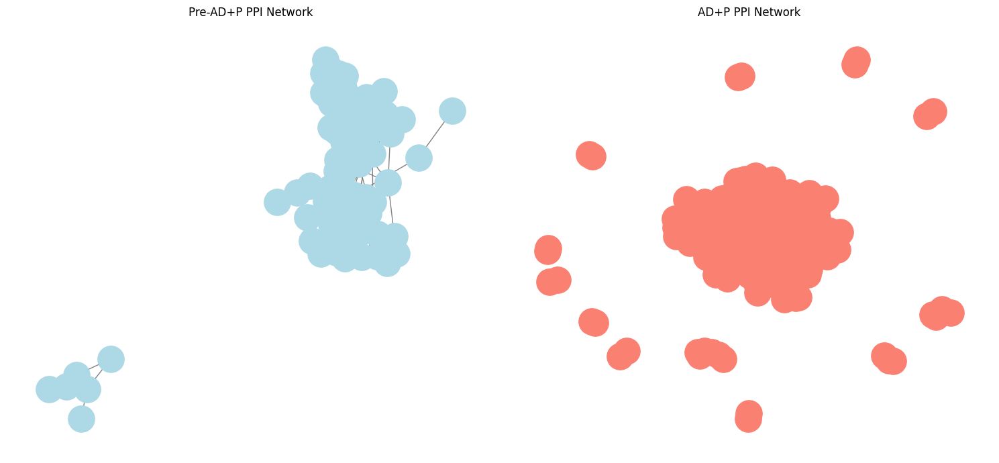

In [ ]:
import networkx as nx  # Import NetworkX for network analysis
import requests
import matplotlib.pyplot as plt
import pandas as pd
import copy

def fetch_string_interactions(protein_list, species=9606):
    """
    Fetch protein-protein interactions from the STRING database for a given list of proteins.

    Parameters:
    - protein_list: List of STRING protein identifiers (e.g., human gene symbols).
    - species: NCBI Taxonomy identifier for the species (default is 9606 for Homo sapiens).

    Returns:
    - interactions: List of tuples, where each tuple represents an interaction (protein1, protein2).
    """
    string_api_url = "https://string-db.org/api"
    output_format = "json"
    method = "network"

    # Construct the request URL
    request_url = f"{string_api_url}/{output_format}/{method}"

    # Parameters
    params = {
        "identifiers": "%0d".join(protein_list),  # Join the list into a string separated by %0d (carriage return)
        "species": species,
        "required_score": 400,  # Score threshold; can be adjusted based on desired confidence
        "add_nodes": 0,  # Do not add more nodes to reach the requested number of nodes
    }

    response = requests.post(request_url, data=params)

    if response.status_code == 200:
        data = response.json()
        interactions = [(interaction["preferredName_A"], interaction["preferredName_B"]) for interaction in data]
        return interactions
    else:
        print("Failed to fetch data from STRING API")
        return []

# Lists of proteins from pre-AD+P and AD+P datasets (replace with your actual data)
pre_adp_proteins = copy.deepcopy(target_list)  # Convert numpy array to list
adp_proteins = copy.deepcopy(protein_exp_list)  # Example subset for demonstration

# Fetch interactions for each list
pre_adp_interactions = fetch_string_interactions(pre_adp_proteins)
adp_interactions = fetch_string_interactions(adp_proteins)

#converting the interactions into a table/dataframe
df_pre_adp_interactions = pd.DataFrame(pre_adp_interactions, columns=['Protein 1', 'Protein 2'])
df_adp_interactions = pd.DataFrame(adp_interactions, columns=['Protein 1', 'Protein 2'])

# Save the DataFrame to an Excel file

df_pre_adp_interactions.to_excel('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/pre_adp_interactions.xlsx', index=False)
df_adp_interactions.to_excel('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/adp_interactions.xlsx', index=False)

# Print the interactions
# print('now printing pre_adp_interactions')
# for interaction in pre_adp_interactions:
    # print(interaction)

# print('moving to adp_interactions')
# for interaction in adp_interactions:
    # print(interaction)


# Create NetworkX graphs from the interactions
G_pre_adp = nx.Graph()
G_pre_adp.add_edges_from(pre_adp_interactions)

G_adp = nx.Graph()
G_adp.add_edges_from(adp_interactions)

# Identify common and unique interactions
## Fix the code to merge
common_edges = set(G_pre_adp.edges()).intersection(set(G_adp.edges()))
unique_pre_adp_edges = set(G_pre_adp.edges()) - set(G_adp.edges())
unique_adp_edges = set(G_adp.edges()) - set(G_pre_adp.edges())

# Analyze and visualize the networks (this is a simplified example)
print(f"Common interactions: {len(common_edges)}")
print(f"Unique to pre-AD+P: {len(unique_pre_adp_edges)}")
print(f"Unique to AD+P: {len(unique_adp_edges)}")


#Visualize the network
plt.figure(figsize=(15, 7))

# Plot pre-AD+P network
plt.subplot(1, 2, 1)  # 1 row, 2 columns, subplot 1
nx.draw(G_pre_adp, with_labels=False, node_color='lightblue', node_size=800, edge_color='gray', linewidths=1, font_size=12,
        pos=nx.spring_layout(G_pre_adp, seed=17))
plt.title('Pre-AD+P PPI Network')

# Plot AD+P network
plt.subplot(1, 2, 2)  # 1 row, 2 columns, subplot 2
nx.draw(G_adp, with_labels=False, node_color='salmon', node_size=800, edge_color='gray', linewidths=1, font_size=12,
        pos=nx.spring_layout(G_adp, seed=17))
plt.title('AD+P PPI Network')

plt.tight_layout()
plt.show()


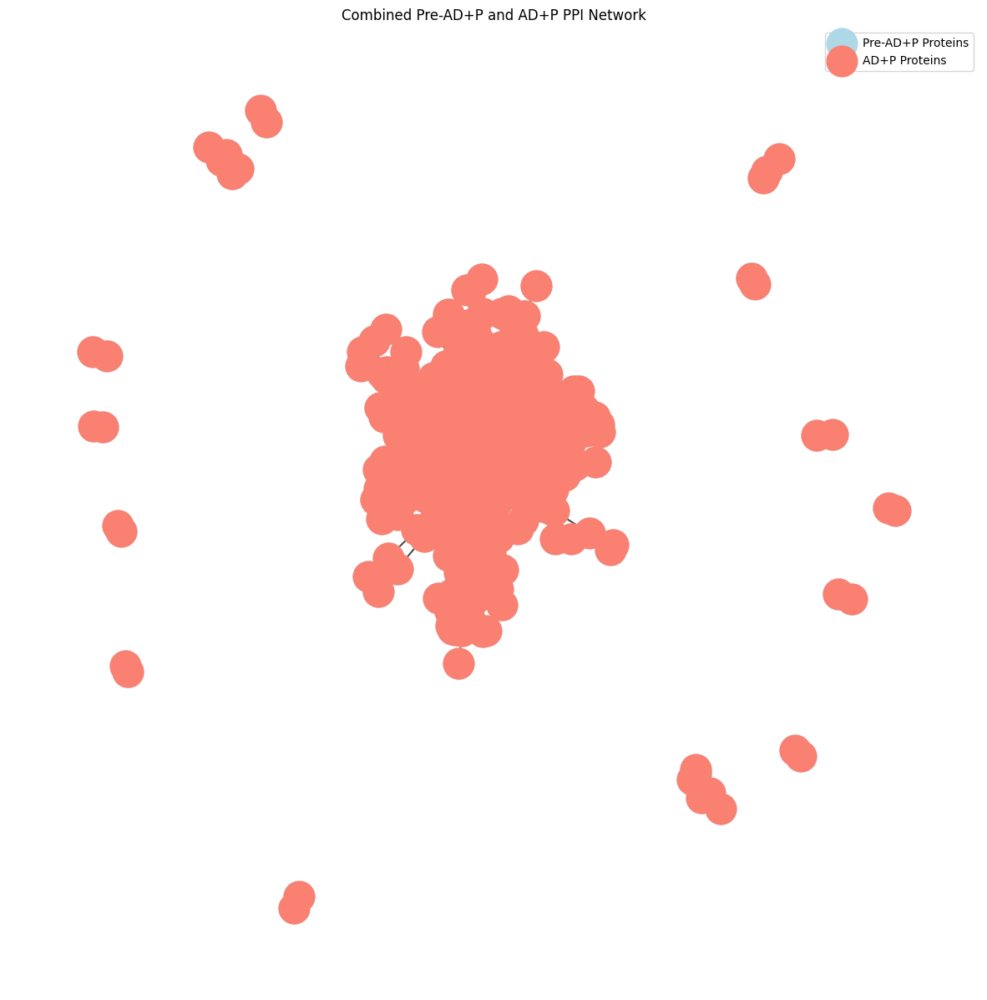

In [ ]:

# Create a new graph that will contain both pre-AD+P and AD+P networks
G_combined = nx.Graph()

# Add all edges from both graphs to the combined graph
G_combined.add_edges_from(G_pre_adp.edges(data=True))
G_combined.add_edges_from(G_adp.edges(data=True))

# Generate positions for the nodes in the graph
pos = nx.spring_layout(G_combined, seed=42)

# Draw the combined network
plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(G_combined, pos, node_size=700, node_color='lightblue', label='Pre-AD+P Proteins')
nx.draw_networkx_nodes(G_combined, pos, node_size=700, node_color='salmon', label='AD+P Proteins')
nx.draw_networkx_edges(G_combined, pos, width=1.5, alpha=0.7)
# Removed the line that caused the error

# Display the legend
plt.legend(scatterpoints=1)
plt.title('Combined Pre-AD+P and AD+P PPI Network')
plt.axis('off')  # Turn off the axis
plt.show()


In [ ]:
df_adp_interactions

,Protein 1,Protein 2
0,WDR54,OSCP1
1,SYPL1,VAMP3
2,VAMP3,CIT
3,VAMP3,ITGB1
4,VAMP3,ARHGEF25
...,...,...
1067,MUC1,IFIH1
1068,MUC1,TCF7L2
1069,TCF7L2,CAMK2A
1070,TCF7L2,ABCC8


In [ ]:
df_pre_adp_interactions

,Protein 1,Protein 2
0,CA12,CA7
1,CA12,CA14
2,CA12,CA4
3,MAPK1,EDNRA
4,MAPK1,PTGES3
...,...,...
476,ABCB1,IGF1R
477,ABCB1,MYC
478,MYC,FGF1
479,MYC,IGF1R


In [ ]:
# Function to create a dictionary of the top proteins and their interaction counts
def get_top_proteins_dict(df, top_n=10):
    # Count occurrences of each protein in both 'Protein 1' and 'Protein 2' columns
    protein_counts = df['Protein 1'].append(df['Protein 2']).value_counts().head(top_n)
    # Convert to dictionary
    top_proteins_dict = protein_counts.to_dict()
    return top_proteins_dict

# Get the top 10 proteins dictionaries for pre-AD+P and AD+P interactions
top_pre_adp_proteins_dict = get_top_proteins_dict(df_pre_adp_interactions)
top_adp_proteins_dict = get_top_proteins_dict(df_adp_interactions)

top_pre_adp_proteins_dict, top_adp_proteins_dict

<ipython-input-71-c8a6d6c33d62>:4: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  protein_counts = df['Protein 1'].append(df['Protein 2']).value_counts().head(top_n)
<ipython-input-71-c8a6d6c33d62>:4: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  protein_counts = df['Protein 1'].append(df['Protein 2']).value_counts().head(top_n)


({'TP53': 30,
  'SLC6A4': 24,
  'CASP3': 23,
  'NR3C1': 22,
  'MAPK3': 22,
  'GABRB2': 22,
  'GABRA1': 22,
  'DRD1': 21,
  'JUN': 21,
  'GABRA6': 21},
 {'CALM3': 45,
  'H3-3B': 33,
  'CAMK2A': 28,
  'PPARG': 27,
  'BRCA1': 25,
  'GRIN2B': 25,
  'CACNA1B': 21,
  'KCNC1': 21,
  'SYN1': 21,
  'RPL23A': 19})

In [ ]:
# Convert interaction pairs to sets of tuples for both pre-AD+P and AD+P
pre_adp_interaction_pairs = set(tuple(x) for x in df_pre_adp_interactions.values)
adp_interaction_pairs = set(tuple(x) for x in df_adp_interactions.values)

# Identify common interactions between the two sets
common_interactions = pre_adp_interaction_pairs.intersection(adp_interaction_pairs)

# Convert common interactions back to a DataFrame for easier analysis and visualization
common_interactions_df = pd.DataFrame(list(common_interactions), columns=['Protein 1', 'Protein 2'])

# Count how many common interactions there are
common_interactions_count = len(common_interactions_df)

# Display the number of common interactions
print(f"Number of common interactions: {common_interactions_count}")

# Optionally, display the common interactions
print(common_interactions_df)

Number of common interactions: 0
Empty DataFrame
Columns: [Protein 1, Protein 2]
Index: []


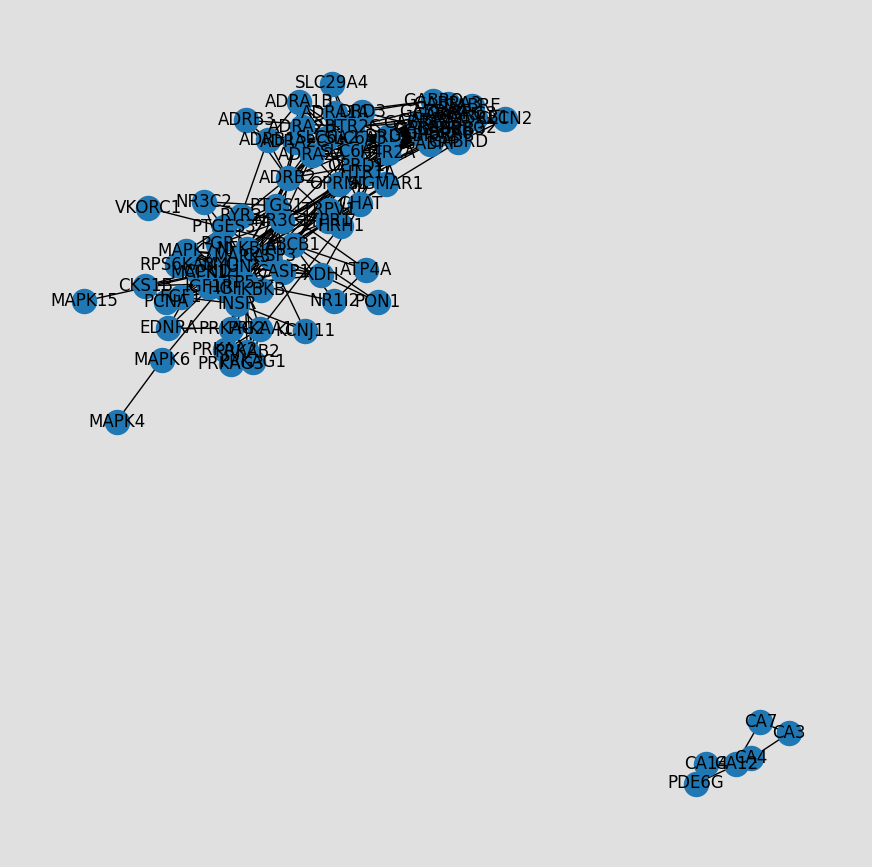

<ipython-input-5-767ea67dab46>:73: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  graph_colormap = cm.get_cmap('plasma', 12)


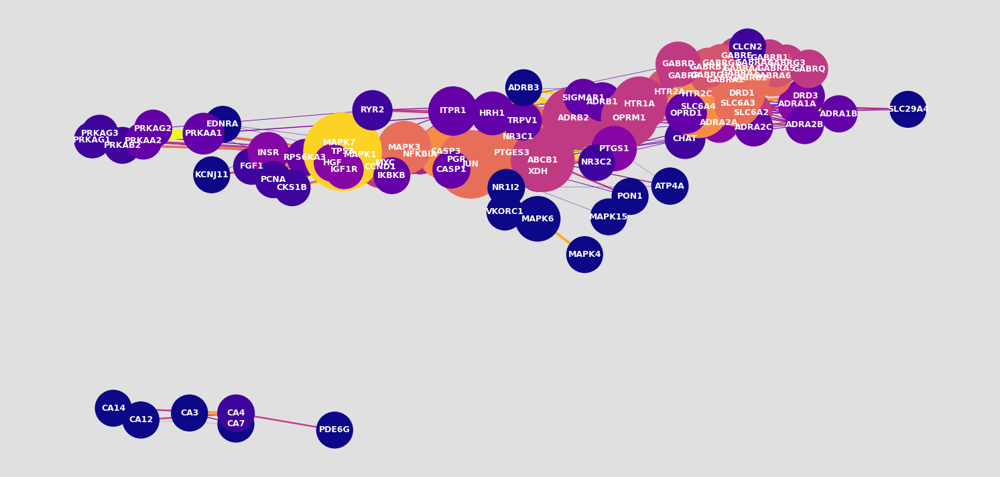

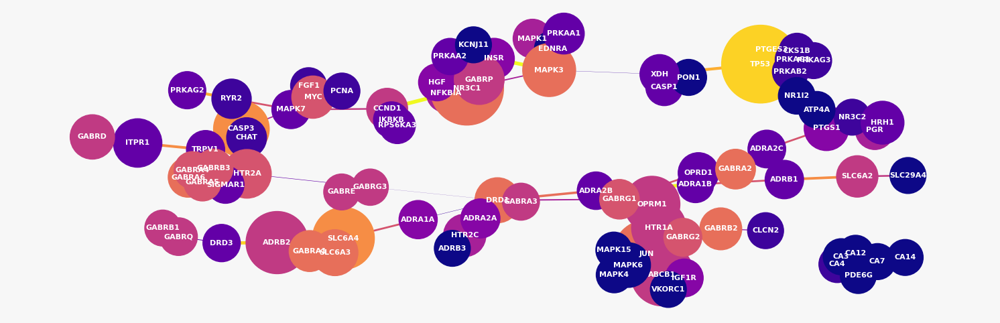

In [ ]:
import networkx as nx
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import copy

#Drug Targets from the new file provided from Professor
new_target_path = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/ADP_SDOH_V02172024_Target_normal_scale_by0.666416963_median.csv'
data = pd.read_csv(new_target_path)
pre_adp_data = copy.deepcopy(data)

#Data from the AD+P DEG Expression
df_DEG = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/AD+P DEGs Original data.xlsx')
adp_data = copy.deepcopy(df_DEG)
#print(adp_data)


# Filtering pre-AD+P data based on statistical significance
filtered_pre_adp_data = pre_adp_data[
    (~pre_adp_data['feature'].str.isnumeric()) &
    ((pre_adp_data['p_bonferroni_non_parameter'] < 0.05) | (pre_adp_data['FDR_Q_non_parameter'] < 0.05))
]

# print('filtered_pre_adp_feature_col', filtered_pre_adp_data['feature'])

# Extracting unique protein targets from the AD+P dataset
adp_protein_targets = adp_data['Gene'].unique()
# print('adp_protein_targets', adp_protein_targets)

# Summary of selections
filtered_pre_adp_count = len(filtered_pre_adp_data)
adp_protein_targets_count = len(adp_protein_targets)

#print(filtered_pre_adp_count, adp_protein_targets_count)

#create the corresponding target list and protein expression list
target_list = filtered_pre_adp_data['feature'].tolist()
protein_exp_list = adp_protein_targets.tolist()

proteins = '%0d'.join(target_list)
url = 'https://string-db.org/api/tsv/network?identifiers=' + proteins + '&species=9606'
r = requests.get(url)

lines = r.text.split('\n') # pull the text from the response object and split based on new lines
data = [l.split('\t') for l in lines] # split each line into its components based on tabs
# convert to dataframe using the first row as the column names; drop empty, final row
df = pd.DataFrame(data[1:-1], columns = data[0])
# dataframe with the preferred names of the two proteins and the score of the interaction
interactions = df[['preferredName_A', 'preferredName_B', 'score']]

G_1=nx.Graph(name='Protein Interaction Graph')
interactions = np.array(interactions)
for i in range(len(interactions)):
    interaction = interactions[i]
    a = interaction[0] # protein a node
    b = interaction[1] # protein b node
    w = float(interaction[2]) # score as weighted edge where high scores = low weight
    G_1.add_weighted_edges_from([(a,b,w)]) # add weighted edge to graph

pos = nx.spring_layout(G_1) # position the nodes using the spring layout
plt.figure(figsize=(11,11),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G_1)
plt.axis('off')
plt.show()

# function to rescale list of values to range [newmin,newmax]
def rescale(l,newmin,newmax):
    arr = list(l)
    return [(x-min(arr))/(max(arr)-min(arr))*(newmax-newmin)+newmin for x in arr]
# use the matplotlib plasma colormap
graph_colormap = cm.get_cmap('plasma', 12)
# node color varies with Degree
c = rescale([G_1.degree(v) for v in G_1],0.0,0.9)
c = [graph_colormap(i) for i in c]
# node size varies with betweeness centrality - map to range [10,100]
bc = nx.betweenness_centrality(G_1) # betweeness centrality
s =  rescale([v for v in bc.values()],1500,7000)
# edge width shows 1-weight to convert cost back to strength of interaction
ew = rescale([float(G_1[u][v]['weight']) for u,v in G_1.edges],0.1,4)
# edge color also shows weight
ec = rescale([float(G_1[u][v]['weight']) for u,v in G_1.edges],0.1,1)
ec = [graph_colormap(i) for i in ec]


pos = nx.spring_layout(G_1)
plt.figure(figsize=(19,9),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G_1, pos=pos, with_labels=True, node_color=c, node_size=s,edge_color= ec,width=ew,
                 font_color='white',font_weight='bold',font_size='9')
plt.axis('off')
plt.show()


T = nx.minimum_spanning_tree(G_1)
pos = nx.spring_layout(T)
plt.figure(figsize=(19,6),facecolor=[0.7,0.7,0.7,0.1])
nx.draw_networkx(T, pos=pos, with_labels=True,node_color=c,node_size=s,edge_color= ec,width=ew,
                font_color='white',font_weight='bold',font_size='8')
plt.axis('off')
plt.show()

#The color range goes from dark purple to bright yellow.
#The yellower the node, the higher the degree. The larger the node, the greater the betweenness centrality.
#The yellower and wider the edge, the greater the interaction score.

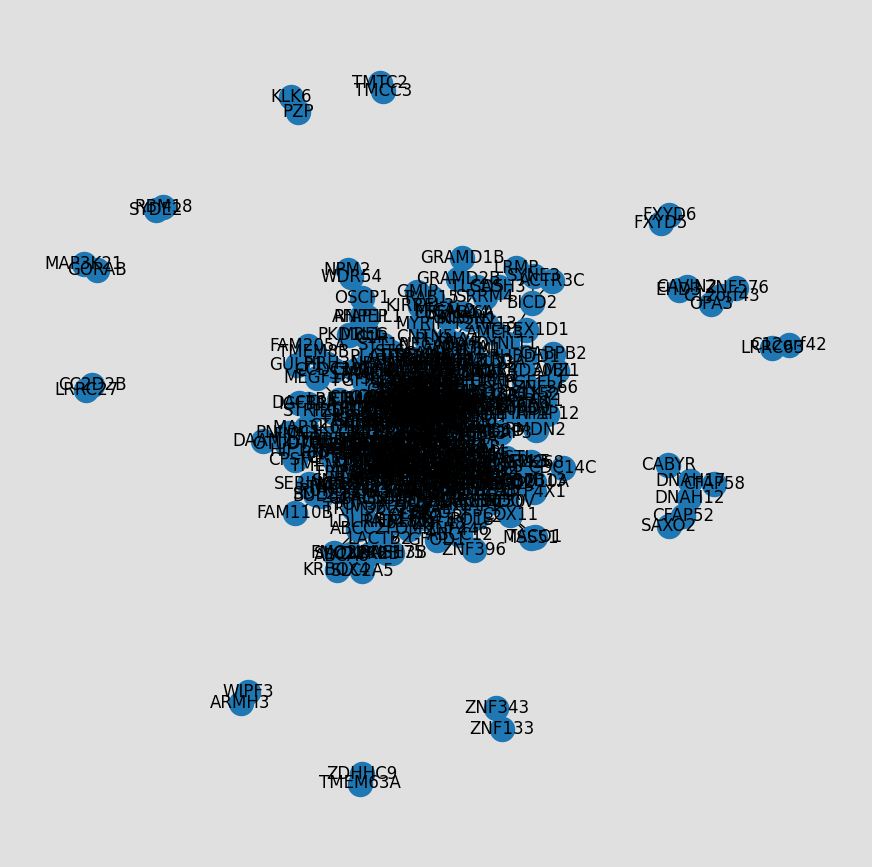

<ipython-input-4-03dabf26b21e>:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  graph_colormap = cm.get_cmap('plasma', 12)


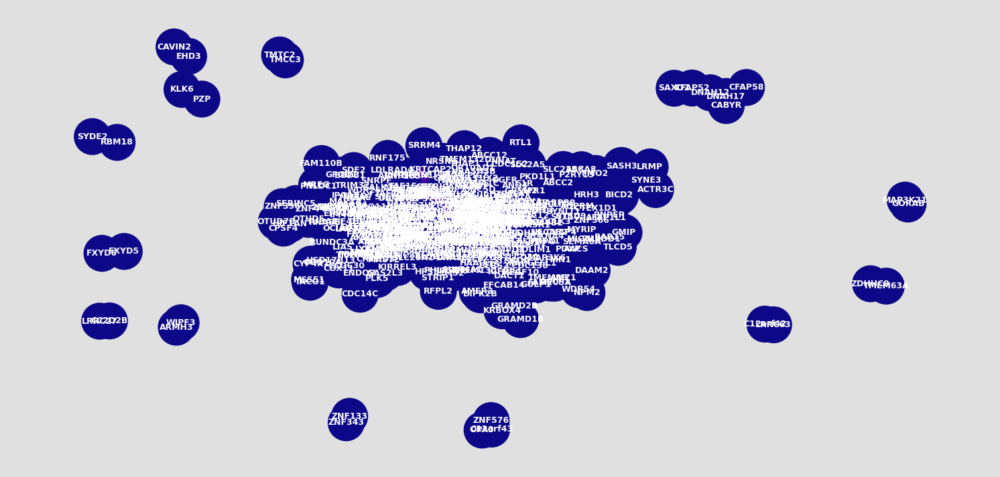

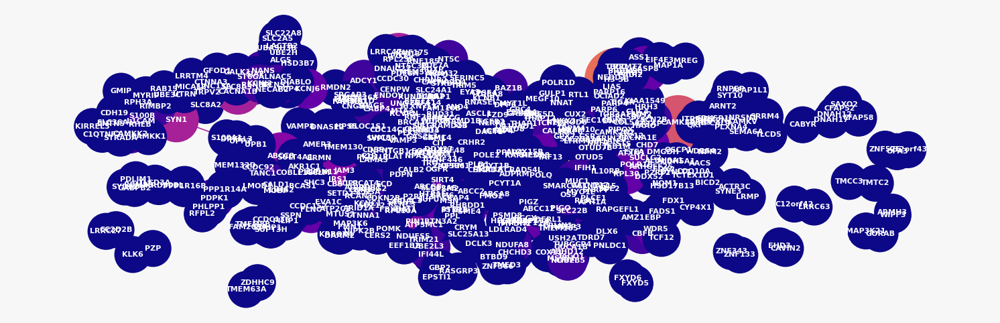

In [ ]:
proteins_exp = '%0d'.join(protein_exp_list)
url = 'https://string-db.org/api/tsv/network?identifiers=' + proteins_exp + '&species=9606'
r = requests.get(url)

lines_1 = r.text.split('\n') # pull the text from the response object and split based on new lines
data_1 = [l.split('\t') for l in lines_1] # split each line into its components based on tabs
# convert to dataframe using the first row as the column names; drop empty, final row
df = pd.DataFrame(data_1[1:-1], columns = data_1[0])
# dataframe with the preferred names of the two proteins and the score of the interaction
interactions = df[['preferredName_A', 'preferredName_B', 'score']]

G_2=nx.Graph(name='Protein Interaction Graph')
interactions = np.array(interactions)
for i in range(len(interactions)):
    interaction = interactions[i]
    a = interaction[0] # protein a node
    b = interaction[1] # protein b node
    w = float(interaction[2]) # score as weighted edge where high scores = low weight
    G_2.add_weighted_edges_from([(a,b,w)]) # add weighted edge to graph

pos = nx.spring_layout(G_2) # position the nodes using the spring layout
plt.figure(figsize=(11,11),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G_2)
plt.axis('off')
plt.show()

# function to rescale list of values to range [newmin,newmax]
def rescale(l,newmin,newmax):
    arr = list(l)
    return [(x-min(arr))/(max(arr)-min(arr))*(newmax-newmin)+newmin for x in arr]
# use the matplotlib plasma colormap
graph_colormap = cm.get_cmap('plasma', 12)
# node color varies with Degree
c = rescale([G_2.degree(v) for v in G_2],0.0,0.9)
c = [graph_colormap(i) for i in c]
# node size varies with betweeness centrality - map to range [10,100]
bc = nx.betweenness_centrality(G_2) # betweeness centrality
s =  rescale([v for v in bc.values()],1500,7000)
# edge width shows 1-weight to convert cost back to strength of interaction
ew = rescale([float(G_2[u][v]['weight']) for u,v in G_2.edges],0.1,4)
# edge color also shows weight
ec = rescale([float(G_2[u][v]['weight']) for u,v in G_2.edges],0.1,1)
ec = [graph_colormap(i) for i in ec]


pos = nx.spring_layout(G_2)
plt.figure(figsize=(19,9),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G_2, pos=pos, with_labels=True, node_color=c, node_size=s,edge_color= ec,width=ew,
                 font_color='white',font_weight='bold',font_size='9')
plt.axis('off')
plt.show()


T1 = nx.minimum_spanning_tree(G_2)
pos = nx.spring_layout(T1)
plt.figure(figsize=(19,6),facecolor=[0.7,0.7,0.7,0.1])
nx.draw_networkx(T1, pos=pos, with_labels=True,node_color=c,node_size=s,edge_color= ec,width=ew,
                font_color='white',font_weight='bold',font_size='8')
plt.axis('off')
plt.show()

In [ ]:
# G_combined_1 = nx.Graph()

# # Add all edges from both graphs to the combined graph
# G_combined_1.add_edges_from(G_1.edges(data=True))
# G_combined_1.add_edges_from(G_2.edges(data=True))

# # Generate positions for the nodes in the graph
# pos = nx.spring_layout(G_combined_1, seed=42)

# # Draw the combined network
# plt.figure(figsize=(15, 15))
# nx.draw_networkx_nodes(G_combined_1, pos, node_size=700, node_color='lightblue', label='Pre-AD+P Proteins')
# nx.draw_networkx_nodes(G_combined_1, pos, node_size=700, node_color='salmon', label='AD+P Proteins')
# nx.draw_networkx_edges(G_combined_1, pos, width=1.5, alpha=0.7)
# # Removed the line that caused the error

# Find common interactions
common_edges = (G_1.edges()) & (G_2.edges())
print("common edges", common_edges)
# Draw common interactions with a different color
# nx.draw_networkx_edges(G_1, pos, edgelist=common_edges, edge_color='green', label='Common Interactions')


# # Display the legend
# plt.legend(scatterpoints=1)
# plt.title('Combined Pre-AD+P and AD+P PPI Network')
# plt.axis('off')  # Turn off the axis
# plt.show()

common edges set()


In [ ]:
import pandas as pd
import copy
#Drug Targets from the new file provided from Professor
new_target_path = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/ADP_SDOH_V02172024_Target_normal_scale_by0.666416963_median.csv'
data = pd.read_csv(new_target_path)
pre_adp_data = copy.deepcopy(data)

#Data from the AD+P DEG Expression
df_DEG = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/AD+P DEGs Original data.xlsx')
adp_data = copy.deepcopy(df_DEG)
#print(adp_data)


# Filtering pre-AD+P data based on statistical significance
filtered_pre_adp_data = pre_adp_data[
    (~pre_adp_data['feature'].str.isnumeric()) &
    ((pre_adp_data['p_bonferroni_non_parameter'] < 0.05) | (pre_adp_data['FDR_Q_non_parameter'] < 0.05))
]

# print('filtered_pre_adp_feature_col', filtered_pre_adp_data['feature'])

# Extracting unique protein targets from the AD+P dataset
adp_protein_targets = adp_data['Gene'].unique()
# print('adp_protein_targets', adp_protein_targets)

# Summary of selections
filtered_pre_adp_count = len(filtered_pre_adp_data)
adp_protein_targets_count = len(adp_protein_targets)

#print(filtered_pre_adp_count, adp_protein_targets_count)

#create the corresponding target list and protein expression list
target_list = filtered_pre_adp_data['feature'].tolist()
protein_exp_list = adp_protein_targets.tolist()
print(target_list)
print(protein_exp_list)

# Remove '_HUMAN' from each element
# target_list_clean = [protein.replace('_HUMAN', '') for protein in target_list]
# print(target_list_clean)
# # Convert lists to sets and find intersection
# intersection = list(set(target_list_clean) & set(protein_exp_list))
# print("Intersection:", intersection)

import requests
# The base URL for the UniProt API
base_url = 'https://rest.uniprot.org'

# Function to convert gene names to UniProt protein names
def convert_gene_to_protein(gene_names):
    protein_names = {}
    for gene_name in gene_names:
        # Construct the search query URL
        params = {
            'query': f'gene:{gene_name} AND organism:"Homo sapiens (Human) [9606]"',
            'fields': 'accession,gene_primary',
            'format': 'tab',
        }
        response = requests.get('https://rest.uniprot.org/uniprotkb/stream', params=params)

        # Check if the response is successful
        if response.ok:
            lines = response.text.strip().split('\n')
            if len(lines) > 1:  # The first line is the header
                for line in lines[1:]:  # Ignore the header line
                    parts = line.split('\t')
                    if len(parts) > 1 and parts[1] == gene_name:
                        protein_names[gene_name] = parts[0]
                        break
            if gene_name not in protein_names:
                protein_names[gene_name] = "Not found"
        else:
            protein_names[gene_name] = "Failed to retrieve data"

    return protein_names

# Convert and print the protein names
protein_names = convert_gene_to_protein(protein_exp_list)
for gene, protein in protein_names.items():
    print(f'{gene}: {protein}')


['PGH1_HUMAN', 'ADRB1_HUMAN', 'ADRB2_HUMAN', 'ADRB3_HUMAN', 'ADA2A_HUMAN', '5HT1A_HUMAN', 'HRH1_HUMAN', '5HT2A_HUMAN', 'ADA1A_HUMAN', '5HT2C_HUMAN', 'SC6A4_HUMAN', 'SC6A2_HUMAN', 'DRD3_HUMAN', 'ADA1B_HUMAN', 'GBRA1_HUMAN', 'GBRA2_HUMAN', 'GBRA3_HUMAN', 'GBRA4_HUMAN', 'GBRA5_HUMAN', 'GBRA6_HUMAN', 'GBRB1_HUMAN', 'GBRB2_HUMAN', 'GBRB3_HUMAN', 'GBRD_HUMAN', 'GBRE_HUMAN', 'GBRG1_HUMAN', 'GBRG2_HUMAN', 'GBRG3_HUMAN', 'GBRP_HUMAN', 'GBRT_HUMAN', 'VKOR1_HUMAN', 'NR1I2_HUMAN', 'OPRD_HUMAN', 'OPRK_HUMAN', 'OPRM_HUMAN', 'TRPV1_HUMAN', 'ADA2B_HUMAN', 'ADA2C_HUMAN', 'ATP4A_HUMAN', 'TEBP_HUMAN', 'SGMR1_HUMAN', 'INSR_HUMAN', 'IGF1R_HUMAN', 'AK1C1_HUMAN', 'CASP1_HUMAN', 'EDNRA_HUMAN', 'NEUR1_HUMAN', 'CCND1_HUMAN', 'GRP78_HUMAN', 'IKKB_HUMAN', 'CASP3_HUMAN', 'P53_HUMAN', 'IKBA_HUMAN', 'MYC_HUMAN', 'KS6A3_HUMAN', 'AAPK1_HUMAN', 'AAPK2_HUMAN', 'AAKB2_HUMAN', 'AAKG1_HUMAN', 'AAKG2_HUMAN', 'AAKG3_HUMAN', 'PCNA_HUMAN', 'MK01_HUMAN', 'MK15_HUMAN', 'MK03_HUMAN', 'MK04_HUMAN', 'MK06_HUMAN', 'MK07_HUMAN', 'SC6

KeyboardInterrupt: 

Common nodes: {'OPRM1', 'GABRB3'}
Common edges: set()


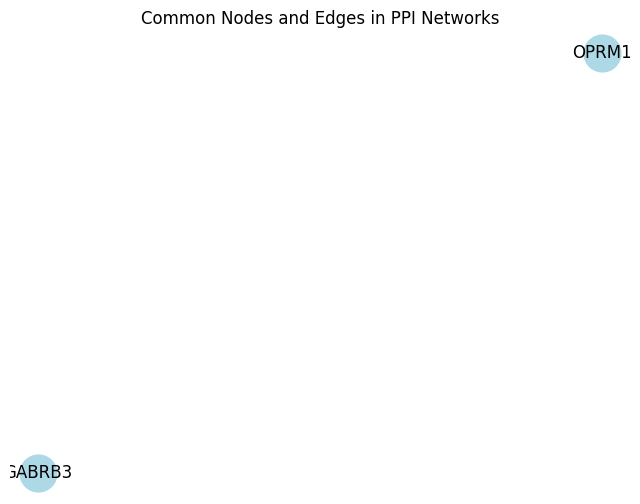

In [ ]:
# Find common nodes
common_nodes = set(G_1.nodes()).intersection(set(G_2.nodes()))

# Find common edges
common_edges = set(G_1.edges()).intersection(set(G_2.edges()))

print("Common nodes:", common_nodes)
print("Common edges:", common_edges)

G_common = nx.Graph()

# Add the common nodes and edges to the new graph
G_common.add_nodes_from(common_nodes)
G_common.add_edges_from(common_edges)

# Now let's visualize the common graph
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G_common)  # positions for all nodes

# nodes
nx.draw_networkx_nodes(G_common, pos, node_size=700, node_color='lightblue')

# edges
nx.draw_networkx_edges(G_common, pos, edgelist=G_common.edges(), width=2)

# labels
nx.draw_networkx_labels(G_common, pos, font_size=12, font_family='sans-serif')

plt.axis('off')  # Turn off the axis
plt.title('Common Nodes and Edges in PPI Networks')
plt.show()

Graph with 2 nodes and 0 edges


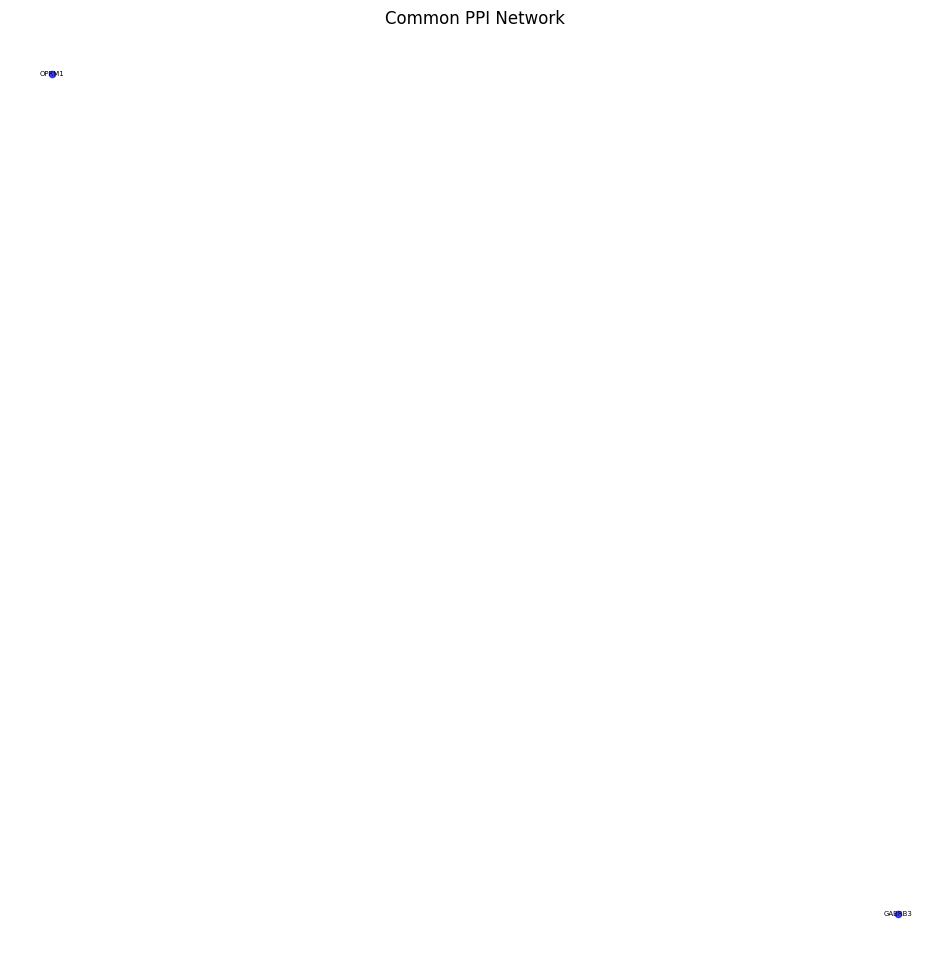

{'OPRM1': {}, 'GABRB3': {}}


In [ ]:
# Find common nodes
common_nodes = set(G_1.nodes()).intersection(set(G_2.nodes()))

# Find common edges
# For edges, we need to make sure that we account for the fact that (A, B) is the same as (B, A) in an undirected graph
G_1_edges = set(frozenset(e) for e in G_1.edges())
G_2_edges = set(frozenset(e) for e in G_2.edges())
common_edges = G_1_edges.intersection(G_2_edges)

# Create a new graph that contains only the common nodes and edges
common_graph = nx.Graph()
common_graph.add_nodes_from(common_nodes)
common_graph.add_edges_from([tuple(e) for e in common_edges])

pos = nx.spring_layout(common_graph)

print(common_graph)
# Now, we'll draw the network
plt.figure(figsize=(12, 12))  # Set the size of the figure
nx.draw_networkx_nodes(common_graph, pos, node_size=20, node_color='blue', alpha=0.7)
nx.draw_networkx_edges(common_graph, pos, alpha=0.5)
nx.draw_networkx_labels(common_graph, pos, font_size=5, font_color='black')

plt.title('Common PPI Network')
plt.axis('off')  # Turn off the axis
plt.show()  # Display the graph

graph_as_dict = nx.to_dict_of_dicts(common_graph)
print(graph_as_dict)



<ipython-input-16-622d72332c4d>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)  # Color map for different communities


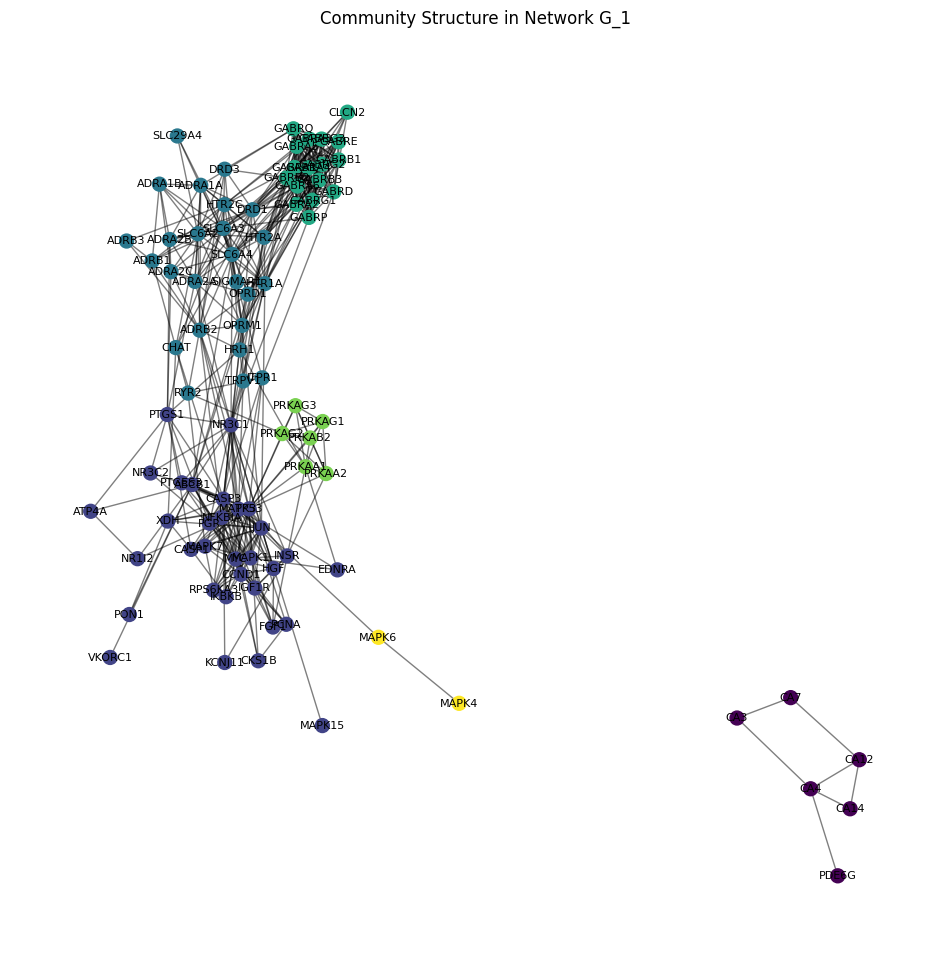

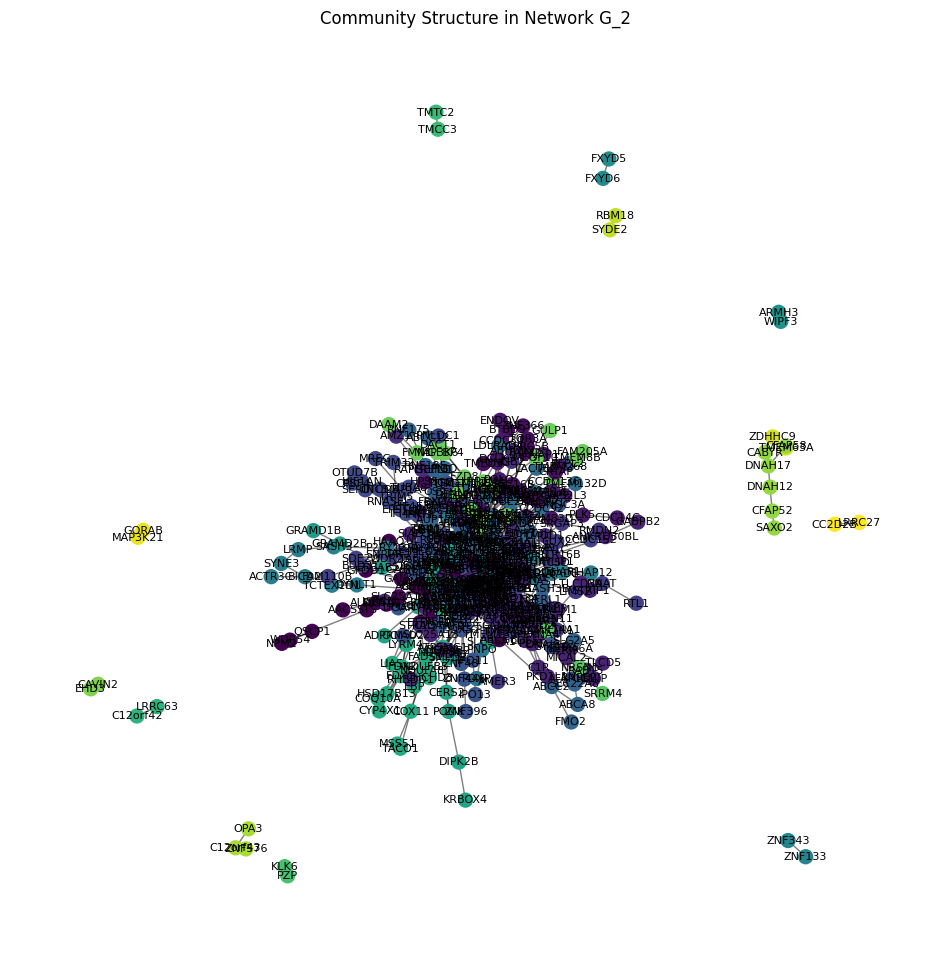

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from community import community_louvain

# Apply the Louvain community detection algorithm to each network independently
partition_1 = community_louvain.best_partition(G_1)
partition_2 = community_louvain.best_partition(G_2)

# Function to visualize the community structure
def plot_communities(G, partition, title):
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(G)  # Position nodes in a layout
    cmap = cm.get_cmap('viridis', max(partition.values()) + 1)  # Color map for different communities
    # Draw nodes with colors according to their partition (community)
    nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=100,
                           cmap=cmap, node_color=list(partition.values()))
    # Draw edges
    nx.draw_networkx_edges(G, pos, alpha=0.5)
    # Draw node labels (optional, might be messy for large networks)
    nx.draw_networkx_labels(G, pos, font_size=8, font_color='k')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Visualize the communities for G_1
plot_communities(G_1, partition_1, 'Community Structure in Network G_1')

# Visualize the communities for G_2
plot_communities(G_2, partition_2, 'Community Structure in Network G_2')


In [ ]:
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score

# Convert partition dictionaries to lists of labels
labels_true_1 = [partition_1[node] for node in G_1.nodes()]
labels_pred_1 = [partition_2[node] if node in partition_2 else -1 for node in G_1.nodes()]

labels_true_2 = [partition_2[node] for node in G_2.nodes()]
labels_pred_2 = [partition_1[node] if node in partition_1 else -1 for node in G_2.nodes()]

# Calculate NMI and ARI for comparisons
nmi_1 = normalized_mutual_info_score(labels_true_1, labels_pred_1)
ari_1 = adjusted_rand_score(labels_true_1, labels_pred_1)

nmi_2 = normalized_mutual_info_score(labels_true_2, labels_pred_2)
ari_2 = adjusted_rand_score(labels_true_2, labels_pred_2)

print(f"NMI for G_1 compared to G_2: {nmi_1}")
print(f"ARI for G_1 compared to G_2: {ari_1}")

print(f"NMI for G_2 compared to G_1: {nmi_2}")
print(f"ARI for G_2 compared to G_1: {ari_2}")


NMI for G_1 compared to G_2: 0.04111939649444076
ARI for G_1 compared to G_2: 0.0025340815068450656
NMI for G_2 compared to G_1: 0.00716900340142819
ARI for G_2 compared to G_1: -0.0005118177467498396


In [ ]:
# Calculate centrality measures within each community for both networks
def get_central_nodes_in_communities(G, partition):
    central_nodes = {}
    # Group nodes by community
    communities = {}
    for node, community in partition.items():
        communities.setdefault(community, []).append(node)
    # Calculate centrality within each community
    for community, members in communities.items():
        subgraph = G.subgraph(members)
        centrality = nx.degree_centrality(subgraph)
        # Filter nodes by centrality threshold, e.g., top 10%
        threshold = sorted(centrality.values(), reverse=True)[int(0.1*len(centrality))]
        central_nodes[community] = [node for node, cent_value in centrality.items() if cent_value >= threshold]
    return central_nodes

central_nodes_1 = get_central_nodes_in_communities(G_1, partition_1)
central_nodes_2 = get_central_nodes_in_communities(G_2, partition_2)

# Now, central_nodes_1 and central_nodes_2 are dictionaries mapping each community
# to the list of significant nodes within that community based on degree centrality

# Intersect the sets of significant nodes from both networks
significant_common_nodes = set()
for community in central_nodes_1:
    if community in central_nodes_2:
        significant_common_nodes |= set(central_nodes_1[community]).intersection(central_nodes_2[community])

# Now, significant_common_nodes contains nodes that are significant in both networks
print("Significant common proteins:", significant_common_nodes)


Significant common proteins: set()


In [ ]:
# from Bio import Entrez

# Entrez.email = "mrozbu@andrew.cmu.edu"  # Replace with your actual email address

# gene_name = "PPP1R14A"  # Use a single, known gene name for testing

# # Search for the gene ID
# handle = Entrez.esearch(db="gene", term=f"{gene_name}[Gene Name] AND Homo sapiens[Organism]")
# record = Entrez.read(handle)
# handle.close()

# print("Search record:", record)  # Inspect the search record

# if record["IdList"]:
#     gene_id = record["IdList"][0]
#     print(f"Gene ID for {gene_name}:", gene_id)

#     # Fetch details for the gene ID
#     handle = Entrez.efetch(db="gene", id=gene_id, retmode="xml")
#     data = handle.read()
#     handle.close()

#     print(f"Fetch data for Gene ID {gene_id}:", data)  # Inspect the fetched data
# else:
#     print(f"No Gene ID found for {gene_name}")


Search record: {'Count': '2', 'RetMax': '2', 'RetStart': '0', 'IdList': ['94274', '83646'], 'TranslationSet': [{'From': 'Homo sapiens[Organism]', 'To': '"Homo sapiens"[Organism]'}], 'TranslationStack': [{'Term': 'PPP1R14A[Gene Name]', 'Field': 'Gene Name', 'Count': '299', 'Explode': 'N'}, {'Term': '"Homo sapiens"[Organism]', 'Field': 'Organism', 'Count': '359883', 'Explode': 'Y'}, 'AND'], 'QueryTranslation': 'PPP1R14A[Gene Name] AND "Homo sapiens"[Organism]'}
Gene ID for PPP1R14A: 94274


HTTPError: HTTP Error 400: Bad Request

In [ ]:
# from Bio import Entrez

# Entrez.email = "mrozbu@andrew.cmu.edu"  # Replace with your actual email address

# def gene_to_protein(gene_names):
#     protein_accessions = {}

#     for gene_name in gene_names:
#         # Search for the gene ID
#         handle = Entrez.esearch(db="gene", term=f"{gene_name}[Gene Name] AND Homo sapiens[Organism]")
#         record = Entrez.read(handle)
#         handle.close()

#         # If gene IDs are found, proceed to fetch the gene record for each ID
#         if record["IdList"]:
#             protein_accessions[gene_name] = []
#             for gene_id in record["IdList"]:
#                 try:
#                     handle = Entrez.efetch(db="gene", id=gene_id, retmode="xml")
#                     data = handle.read()
#                     handle.close()

#                     # Parse the XML to find protein accession numbers
#                     # This part might need adjustment depending on the structure of the returned XML
#                     protein_accessions[gene_name].append(data)  # Store the raw XML data for now

#                 except HTTPError as he:
#                     print(f"Failed to retrieve data for gene ID: {gene_id}, with error: {he}")
#         else:
#             protein_accessions[gene_name] = "Not found"

#     return protein_accessions

# # List of gene names
# gene_names = ['PPP1R14A']  # Test with a single gene name for demonstration

# # Fetch and print protein accessions
# protein_accessions = gene_to_protein(gene_names)
# for gene, data_list in protein_accessions.items():
#     for data in data_list:
#         print(f"Data for {gene}: {data[:200]}...")  # Print the beginning of the XML data for inspection


Data for PPP1R14A: b'<?xml version="1.0" ?>\n<!DOCTYPE Entrezgene-Set PUBLIC "-//NLM//DTD NCBI-Entrezgene, 21st January 2005//EN" "https://www.ncbi.nlm.nih.gov/data_specs/dtd/NCBI_Entrezgene.dtd">\n<Entrezgene-Set>\n<Entrezg'...
Data for PPP1R14A: b'<?xml version="1.0" ?>\n<!DOCTYPE Entrezgene-Set PUBLIC "-//NLM//DTD NCBI-Entrezgene, 21st January 2005//EN" "https://www.ncbi.nlm.nih.gov/data_specs/dtd/NCBI_Entrezgene.dtd">\n<Entrezgene-Set>\n<Entrezg'...


In [ ]:
# import xml.etree.ElementTree as ET

# def extract_protein_accessions(xml_data):
#     # Parse the XML data
#     root = ET.fromstring(xml_data)

#     protein_accessions = []

#     # Iterate through XML tree to find RefSeq protein accessions
#     for refseq in root.iter('Gene-commentary'):
#         # Check if this is a protein reference
#         if refseq.find('Gene-commentary_type'):
#             type_value = refseq.find('Gene-commentary_type').get('value')
#             if type_value == 'peptide':
#                 # Check for the accession number
#                 if refseq.find('Gene-commentary_accession'):
#                     accession = refseq.find('Gene-commentary_accession').text
#                     protein_accessions.append(accession)

#     return protein_accessions
# # If `data` is a bytes object from your Entrez fetch call,
# # decode it to a string before passing to the function
# decoded_data = data.decode('utf-8')
# protein_accessions_for_gene = extract_protein_accessions(decoded_data)
# # Example usage with the fetched data for a gene

# # for gene, data_list in protein_accessions_for_gene.items():
# #     for data in data_list:
# #         print(f"Protein Accessions for {gene}: {extract_protein_accessions(data)}")
# protein_accessions_for_gene

[]

In [ ]:
# import xml.etree.ElementTree as ET

# def extract_protein_accessions(xml_data):
#     root = ET.fromstring(xml_data)
#     protein_accessions = []

#     # Broadly search for accession numbers
#     for accession in root.iter('Gene-commentary_accession'):
#         protein_accessions.append(accession.text)

#     return protein_accessions

# # Assuming `data_list` is a list of XML data strings for different genes
# for gene_data in data_list:  # Replace `data_list` with your list of XML data strings
#     decoded_data = gene_data.decode('utf-8')  # Decode if necessary
#     protein_accessions = extract_protein_accessions(decoded_data)
#     print(protein_accessions)


['NC_000019', 'NM_001243947', 'NP_001230876', 'NM_033256', 'NP_150281', 'NC_060943', 'NM_001243947', 'NP_001230876', 'NM_033256', 'NP_150281', 'NM_001243947', 'NP_001230876', 'NM_033256', 'NP_150281', 'NC_000019', 'NC_060943', 'AC011479', 'AY050668', 'AAL24445', 'CH471126', 'EAW56764', 'EAW56765', 'CP068259', 'AB056508', 'BAB62502', 'AB056509', 'BAB62503', 'AF123763', 'AAP97242', 'AY050670', 'AAL25828', 'BC021089', 'AAH21089', 'ES314242', 'Q96A00', 'GCF_000001405', 'GCF_000001305', 'NC_000019', 'GCF_009914755', 'GCF_009914825', 'NC_060943', 'GCF_000001405', 'GCF_000001305', 'NC_000019', 'GCF_009914755', 'GCF_009914825', 'NC_060943', 'GCF_000001405', 'GCF_000001305', 'NC_000019', 'GCF_009914755', 'GCF_009914825', 'NC_060943', 'GCF_000001405', 'GCF_000001305', 'NC_000019', 'GCF_000001405', 'GCF_000001305', 'NC_000019', 'GCF_000001405', 'GCF_000001305', 'NC_000019', 'GCF_000001405', 'GCF_000001305', 'NC_000019', 'GCF_000001405', 'GCF_000001305', 'NC_000019', 'GCF_000001405', 'GCF_00000130

In [ ]:
# import xml.etree.ElementTree as ET

# def extract_protein_accessions(xml_data):
#     root = ET.fromstring(xml_data)
#     protein_accessions = set()

#     # Search specifically for NP_ accession numbers indicating proteins
#     for accession in root.iter('Gene-commentary_accession'):
#         accession_text = accession.text
#         if accession_text.startswith("NP_"):
#             protein_accessions.add(accession_text)

#     return protein_accessions

# # Assuming `data_list` is a list of XML data strings for different genes
# # Here's how you can use the function:
# for gene_data in data_list:  # Replace `data_list` with your list of XML data strings
#     decoded_data = gene_data.decode('utf-8')  # Decode if necessary
#     protein_accessions = extract_protein_accessions(decoded_data)
#     print(protein_accessions)


{'NP_150281', 'NP_001230876'}
set()


In [ ]:
# from Bio import Entrez
# import xml.etree.ElementTree as ET

# Entrez.email = "mrozbu@andrew.cmu.edu"  # Provide your email here

# def fetch_protein_accessions_for_gene_list(gene_names):
#     protein_accessions_by_gene = {}

#     for gene_name in gene_names:
#         handle = Entrez.esearch(db="gene", term=f"{gene_name}[Gene Name] AND Homo sapiens[Organism]")
#         record = Entrez.read(handle)
#         handle.close()

#         gene_ids = record["IdList"]

#         # Initialize an empty set for the current gene to store unique protein accession numbers
#         protein_accessions_by_gene[gene_name] = set()

#         for gene_id in gene_ids:
#             try:
#                 handle = Entrez.efetch(db="gene", id=gene_id, retmode="text", rettype="gb")
#                 xml_data = handle.read()
#                 handle.close()

#                 # Parse the XML to extract protein accession numbers
#                 root = ET.fromstring(xml_data)
#                 for accession in root.iter('Gene-commentary_accession'):
#                     accession_text = accession.text
#                     if accession_text.startswith("NP_"):  # Filter for RefSeq protein accession numbers
#                         protein_accessions_by_gene[gene_name].add(accession_text)

#             except Exception as e:
#                 print(f"Error processing gene ID {gene_id} for gene {gene_name}: {str(e)}")

#     return protein_accessions_by_gene



# # Fetch and print protein accessions for the gene list
# protein_accessions = fetch_protein_accessions_for_gene_list(protein_exp_list)
# for gene, accessions in protein_accessions.items():
#     if accessions:
#         print(f"{gene}: {', '.join(accessions)}")
#     else:
#         print(f"{gene}: No protein accessions found")


Error processing gene ID 94274 for gene PPP1R14A: HTTP Error 400: Bad Request
Error processing gene ID 83646 for gene PPP1R14A: syntax error: line 2, column 0
Error processing gene ID 100287569 for gene LINC00173: IncompleteRead(255 bytes read)
Error processing gene ID 115557 for gene ARHGEF25: syntax error: line 2, column 0
Error processing gene ID 51090 for gene PLLP: syntax error: line 2, column 0
Error processing gene ID 131076 for gene CCDC58: syntax error: line 2, column 0
Error processing gene ID 429 for gene ASCL1: IncompleteRead(455 bytes read)
Error processing gene ID 790952 for gene ESRG: syntax error: line 2, column 0
Error processing gene ID 101928555 for gene LINC01537: syntax error: line 2, column 0
Error processing gene ID 57673 for gene BEND3: syntax error: line 2, column 0
Error processing gene ID 7692 for gene ZNF133: syntax error: line 2, column 0
Error processing gene ID 8148 for gene TAF15: syntax error: line 2, column 0
Error processing gene ID 64434 for gene NOM

KeyboardInterrupt: 

In [ ]:
# import requests

# def uniprot_ids_to_gene_names(uniprot_ids):
#     gene_names = {}
#     url = "https://rest.uniprot.org/idmapping/run"
#     headers = {"Content-Type": "application/json"}
#     data = {"from": "UniProtKB_AC-ID", "to": "Gene_Name", "ids": uniprot_ids}
#     response = requests.post(url, json=data, headers=headers)
#     if response.status_code == 200:
#         job_id = response.json()["jobId"]
#         results_url = f"https://rest.uniprot.org/idmapping/results/{job_id}/stream?format=tsv&fields=from,to"
#         results_response = requests.get(results_url)
#         if results_response.status_code == 200:
#             lines = results_response.text.strip().split("\n")
#             for line in lines[1:]:  # Skip header
#                 uniprot_id, gene_name = line.split("\t")
#                 gene_names[uniprot_id] = gene_name
#     else:
#         print(f"Failed to submit job: {response.text}")
#     return gene_names


# # Fetch and print gene names
# gene_names = uniprot_ids_to_gene_names(target_list)
# for uniprot_id, gene_name in gene_names.items():
#     print(f"{uniprot_id}: {gene_name}")


Failed to submit job: {"url":"http://rest.uniprot.org/idmapping/run","messages":["'to' is a required parameter","The parameter 'to' has an invalid value '{0}'.","The parameter 'from' has an invalid value '{0}'.","'ids' is a required parameter","'from' is a required parameter","The combination of 'from={0}' and 'to={1}' parameters is invalid"]}


Conversion of Protein to gene

In [ ]:
import requests

def fetch_gene_name_from_uniprot(uniprot_ids):
    gene_names = {}
    base_url = "https://rest.uniprot.org/uniprotkb"

    for uniprot_id in uniprot_ids:
        url = f"{base_url}/{uniprot_id}.json"
        response = requests.get(url)
        if response.status_code == 200:
            data = response.json()
            # Extract gene name, considering primary gene name first
            gene_info = data.get("genes", [{}])[0]
            gene_name = gene_info.get("geneName", {}).get("value", "Not found")
            gene_names[uniprot_id] = gene_name
        else:
            print(f"Failed to fetch data for {uniprot_id}")
            gene_names[uniprot_id] = "Failed to fetch"

    return gene_names


# Fetch and print gene names for given UniProt IDs
gene_names = fetch_gene_name_from_uniprot(target_list)
for uniprot_id, gene_name in gene_names.items():
    print(f"{uniprot_id}: {gene_name}")


PGH1_HUMAN: PTGS1
ADRB1_HUMAN: ADRB1
ADRB2_HUMAN: ADRB2
ADRB3_HUMAN: ADRB3
ADA2A_HUMAN: ADRA2A
5HT1A_HUMAN: HTR1A
HRH1_HUMAN: HRH1
5HT2A_HUMAN: HTR2A
ADA1A_HUMAN: ADRA1A
5HT2C_HUMAN: HTR2C
SC6A4_HUMAN: SLC6A4
SC6A2_HUMAN: SLC6A2
DRD3_HUMAN: DRD3
ADA1B_HUMAN: ADRA1B
GBRA1_HUMAN: GABRA1
GBRA2_HUMAN: GABRA2
GBRA3_HUMAN: GABRA3
GBRA4_HUMAN: GABRA4
GBRA5_HUMAN: GABRA5
GBRA6_HUMAN: GABRA6
GBRB1_HUMAN: GABRB1
GBRB2_HUMAN: GABRB2
GBRB3_HUMAN: GABRB3
GBRD_HUMAN: GABRD
GBRE_HUMAN: GABRE
GBRG1_HUMAN: GABRG1
GBRG2_HUMAN: GABRG2
GBRG3_HUMAN: GABRG3
GBRP_HUMAN: GABRP
GBRT_HUMAN: GABRQ
VKOR1_HUMAN: VKORC1
NR1I2_HUMAN: NR1I2
OPRD_HUMAN: OPRD1
OPRK_HUMAN: OPRK1
OPRM_HUMAN: OPRM1
TRPV1_HUMAN: TRPV1
ADA2B_HUMAN: ADRA2B
ADA2C_HUMAN: ADRA2C
ATP4A_HUMAN: ATP4A
TEBP_HUMAN: PTGES3
SGMR1_HUMAN: SIGMAR1
INSR_HUMAN: INSR
IGF1R_HUMAN: IGF1R
AK1C1_HUMAN: AKR1C1
CASP1_HUMAN: CASP1
EDNRA_HUMAN: EDNRA
NEUR1_HUMAN: NEU1
CCND1_HUMAN: CCND1
GRP78_HUMAN: HSPA5
IKKB_HUMAN: IKBKB
CASP3_HUMAN: CASP3
P53_HUMAN: TP53
IKBA_HUM

In [ ]:
# from Bio import Entrez
# import xml.etree.ElementTree as ET

# # Always provide your email to NCBI when using Entrez
# Entrez.email = "mrozbu@andrew.cmu.edu"

# def fetch_protein_names(gene_names):
#     protein_names = {}

#     for gene_name in gene_names:
#         # Step 1: Search for the gene's NCBI ID
#         search_handle = Entrez.esearch(db="gene", term=f"{gene_name}[Gene Name] AND Homo sapiens[Organism]")
#         search_results = Entrez.read(search_handle)
#         search_handle.close()

#         gene_ids = search_results.get("IdList")
#         if not gene_ids:
#             print(f"No Gene ID found for {gene_name}")
#             protein_names[gene_name] = "No Gene ID found"
#             continue

#         # Step 2: Fetch details for the gene ID to find associated proteins
#         for gene_id in gene_ids:
#             fetch_handle = Entrez.efetch(db="gene", id=gene_id, retmode="xml")
#             fetch_results = fetch_handle.read()
#             fetch_handle.close()

#             # Parse the XML to find the protein name
#             try:
#                 root = ET.fromstring(fetch_results)
#                 for prot_ref in root.iter('Prot-ref'):
#                     protein_name = prot_ref.find('Prot-ref_name').find('Prot-ref_name_E').text
#                     # Assuming the first protein name is what we are interested in
#                     protein_names[gene_name] = protein_name
#                     break  # Break after finding the first protein name
#                 else:
#                     # No protein reference found
#                     print(f"No protein name found for {gene_name}")
#                     protein_names[gene_name] = "No protein name found"

#             except ET.ParseError as e:
#                 print(f"Error parsing XML for {gene_name}: {e}")
#                 protein_names[gene_name] = "XML parsing error"

#     return protein_names

# protein_names = fetch_protein_names(protein_exp_list)

# for gene_name, protein_name in protein_names.items():
#     print(f"{gene_name}: {protein_name}")


Conversion of Gene to Proteins

In [ ]:
import requests
import time

def map_genes_to_uniprot_proteins(gene_list):
    # genes_str = ",".join(gene_list)

    submit_url = 'https://rest.uniprot.org/idmapping/run'
    payload = {
        'from': 'Gene_Name',
        'to': 'UniProtKB-Swiss-Prot',
        'ids': gene_list,
        'taxId': '9606'
    }

    submit_response = requests.post(submit_url, data=payload)
    if submit_response.status_code != 200:
        print("Failed to submit job for gene", gene_list)
        return 'None'

    job_id = submit_response.json().get("jobId")
    if not job_id:
        print("Job ID not found in submission response for gene", gene_list)
        return 'None'

    # Check the status of the job
    status_url = f'https://rest.uniprot.org/idmapping/status/{job_id}'
    while True:
        status_response = requests.get(status_url)
        if status_response.status_code != 200:
            print("Failed to get job status for gene:", gene_list)
            return 'None'

        response_json = status_response.json()
        # print("response_json:", response_json)
        if "jobStatus" not in response_json:
            # print("Unexpected response structure:", response_json)
            return response_json

        status = response_json["jobStatus"]
        if status == "FINISHED":
            break
        elif status == "FAILURE":
            print("Job failed for gene", gene_list)
            return 'None'
        else:
            # print("Waiting for job to complete...")
            time.sleep(5)

    # Retrieve the results
    results_url = f'https://rest.uniprot.org/idmapping/results/{job_id}/stream?format=tsv&fields=from,to'
    results_response = requests.get(results_url)
    if results_response.status_code != 200:
        print("Failed to retrieve results for gene:", gene_list)
        return 'None'

    protein_mapping = {}
    lines = results_response.text.strip().split("\n")
    for line in lines[1:]:
        gene_name, uniprot_id = line.split("\t")
        protein_mapping[gene_name] = uniprot_id

    return protein_mapping

def extract_uniprotkb_ids(response_json):
    uniprotkb_ids = []
    # Iterate through each entry in the 'results' array
    if response_json == 'None': return []
    for result in response_json['results']:
        # Extract the 'uniProtkbId' from the 'to' key
        uniProtkbId = result['to'].get('uniProtkbId')
        if uniProtkbId:
            uniprotkb_ids.append(uniProtkbId)
    return uniprotkb_ids

def flatten_list(nested_list):
    flat_list = []
    for item in nested_list:
        if isinstance(item, list):
          if item == []: continue
          else:flat_list.extend(flatten_list(item))
        else:
            flat_list.append(item)
    return flat_list




In [ ]:
# uniprotkb_ids =[]
# for g in protein_exp_list:
#   protein_mapping = map_genes_to_uniprot_proteins(g)
#   # print("gene:", g, "protein_mapping:", protein_mapping)
#   proteins = extract_uniprotkb_ids(protein_mapping)
#   # Filter for IDs that end with '_HUMAN'
#   # human_ids = [id for id in proteins if id.endswith('_HUMAN')]
#   uniprotkb_ids.append(proteins)
#   print(f'gene:{g} to protein: {proteins}')
# print(uniprotkb_ids)

# protein_list = flatten_list(uniprotkb_ids)
# print("protein_list:", protein_list)

gene:PPP1R14A to protein: ['PP14A_HUMAN']
gene:LINC00173 to protein: ['YL023_HUMAN']
gene:ARHGEF25 to protein: ['ARHGP_HUMAN']
gene:PLLP to protein: ['PLLP_HUMAN']
gene:CCDC58 to protein: ['MIX23_HUMAN']
gene:ASCL1 to protein: ['ASCL1_HUMAN']
gene:ESRG to protein: ['ESRG_HUMAN']
gene:LINC01537 to protein: []
gene:BEND3 to protein: ['BEND3_HUMAN']
gene:ZNF133 to protein: ['ZN133_HUMAN']
gene:TAF15 to protein: ['TAF12_HUMAN', 'RBP56_HUMAN']
gene:NOM1 to protein: ['NOM1_HUMAN']
gene:LOH12CR2 to protein: []
gene:NIPAL3 to protein: ['NPAL3_HUMAN']
gene:PHLPP1 to protein: ['PHLP1_HUMAN']
gene:EPSTI1 to protein: ['ESIP1_HUMAN']
gene:TRERF1 to protein: ['TREF1_HUMAN']
gene:TACO1 to protein: ['TACO1_HUMAN']
gene:HAT1 to protein: ['HAT1_HUMAN']
gene:SSPN to protein: ['SSPN_HUMAN']
gene:MTCL1 to protein: ['MTCL1_HUMAN']
gene:LOC100132781 to protein: []
gene:ADAM10 to protein: ['ADA10_HUMAN']
gene:MASTL to protein: ['GWL_HUMAN']
gene:TNFRSF11A to protein: ['TNR11_HUMAN']
gene:CAMKV to protein: ['C

In [ ]:
import pandas as pd
import copy
#Drug Targets from the new file provided from Professor
new_target_path = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/ADP_SDOH_V02172024_Target_normal_scale_by0.666416963_median.csv'
data = pd.read_csv(new_target_path)
pre_adp_data = copy.deepcopy(data)

#Data from the AD+P DEG Expression
df_DEG = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/AD+P DEGs Original data.xlsx', sheet_name = 'Sheet1')
adp_data = copy.deepcopy(df_DEG)
#print(adp_data)


# Filtering pre-AD+P data based on statistical significance
filtered_pre_adp_data = pre_adp_data[
    (~pre_adp_data['feature'].str.isnumeric()) &
    ((pre_adp_data['p_bonferroni_non_parameter'] < 0.05) | (pre_adp_data['FDR_Q_non_parameter'] < 0.05))
]

# print('filtered_pre_adp_feature_col', filtered_pre_adp_data['feature'])

# Extracting unique genes from the AD+P dataset
adp_protein_targets = adp_data['Gene'].unique()
print('adp_protein_targets', len(adp_protein_targets))

# Summary of selections
filtered_pre_adp_count = len(filtered_pre_adp_data)
adp_protein_targets_count = len(adp_protein_targets)

#print(filtered_pre_adp_count, adp_protein_targets_count)

#create the corresponding target list and protein expression list
target_list = filtered_pre_adp_data['feature'].tolist()
protein_exp_list = adp_protein_targets.tolist()
protein_exp_list = protein_exp_list[:145]
print(len(target_list), target_list)
print(len(protein_exp_list),protein_exp_list)

adp_protein_targets 727
94 ['PGH1_HUMAN', 'ADRB1_HUMAN', 'ADRB2_HUMAN', 'ADRB3_HUMAN', 'ADA2A_HUMAN', '5HT1A_HUMAN', 'HRH1_HUMAN', '5HT2A_HUMAN', 'ADA1A_HUMAN', '5HT2C_HUMAN', 'SC6A4_HUMAN', 'SC6A2_HUMAN', 'DRD3_HUMAN', 'ADA1B_HUMAN', 'GBRA1_HUMAN', 'GBRA2_HUMAN', 'GBRA3_HUMAN', 'GBRA4_HUMAN', 'GBRA5_HUMAN', 'GBRA6_HUMAN', 'GBRB1_HUMAN', 'GBRB2_HUMAN', 'GBRB3_HUMAN', 'GBRD_HUMAN', 'GBRE_HUMAN', 'GBRG1_HUMAN', 'GBRG2_HUMAN', 'GBRG3_HUMAN', 'GBRP_HUMAN', 'GBRT_HUMAN', 'VKOR1_HUMAN', 'NR1I2_HUMAN', 'OPRD_HUMAN', 'OPRK_HUMAN', 'OPRM_HUMAN', 'TRPV1_HUMAN', 'ADA2B_HUMAN', 'ADA2C_HUMAN', 'ATP4A_HUMAN', 'TEBP_HUMAN', 'SGMR1_HUMAN', 'INSR_HUMAN', 'IGF1R_HUMAN', 'AK1C1_HUMAN', 'CASP1_HUMAN', 'EDNRA_HUMAN', 'NEUR1_HUMAN', 'CCND1_HUMAN', 'GRP78_HUMAN', 'IKKB_HUMAN', 'CASP3_HUMAN', 'P53_HUMAN', 'IKBA_HUMAN', 'MYC_HUMAN', 'KS6A3_HUMAN', 'AAPK1_HUMAN', 'AAPK2_HUMAN', 'AAKB2_HUMAN', 'AAKG1_HUMAN', 'AAKG2_HUMAN', 'AAKG3_HUMAN', 'PCNA_HUMAN', 'MK01_HUMAN', 'MK15_HUMAN', 'MK03_HUMAN', 'MK04_HUMAN', 'MK06

In [ ]:



#Test
# ge = ['PPP1R14A','LINC00173','ARHGEF25','PLLP','CCDC58','ASCL1','ESRG','LINC01537','BEND3','ZNF133','TAF15','NOM1']

# uniprotkb_ids =[]
# for g in ge:
#   protein_mapping = map_genes_to_uniprot_proteins(g)
#   print("gene:", g, "protein_mapping:", protein_mapping)
#   proteins = extract_uniprotkb_ids(protein_mapping)
#   # Filter for IDs that end with '_HUMAN'
#   # human_ids = [id for id in proteins if id.endswith('_HUMAN')]
#   uniprotkb_ids.append(proteins)
#   print(f'gene:{g} to protein: {proteins}')
# print(uniprotkb_ids)

# protein_list = flatten_list(uniprotkb_ids)
# print("protein_list:", protein_list)

[['stringId_A', 'stringId_B', 'preferredName_A', 'preferredName_B', 'ncbiTaxonId', 'score', 'nscore', 'fscore', 'pscore', 'ascore', 'escore', 'dscore', 'tscore'], ['9606.ENSP00000178638', '9606.ENSP00000345659', 'CA12', 'CA7', '9606', '0.405', '0', '0', '0.116', '0', '0', '0', '0.355'], ['9606.ENSP00000178638', '9606.ENSP00000358107', 'CA12', 'CA14', '9606', '0.569', '0', '0', '0.089', '0', '0', '0.5', '0.13'], ['9606.ENSP00000178638', '9606.ENSP00000300900', 'CA12', 'CA4', '9606', '0.64', '0', '0', '0.156', '0', '0', '0.5', '0.215'], ['9606.ENSP00000215832', '9606.ENSP00000315011', 'MAPK1', 'EDNRA', '9606', '0.434', '0', '0', '0', '0.055', '0', '0', '0.426'], ['9606.ENSP00000215832', '9606.ENSP00000482075', 'MAPK1', 'PTGES3', '9606', '0.464', '0', '0', '0', '0.055', '0.067', '0.4', '0.108'], ['9606.ENSP00000215832', '9606.ENSP00000216797', 'MAPK1', 'NFKBIA', '9606', '0.496', '0', '0', '0', '0.047', '0.072', '0', '0.476'], ['9606.ENSP00000215832', '9606.ENSP00000480791', 'MAPK1', 'FGF1

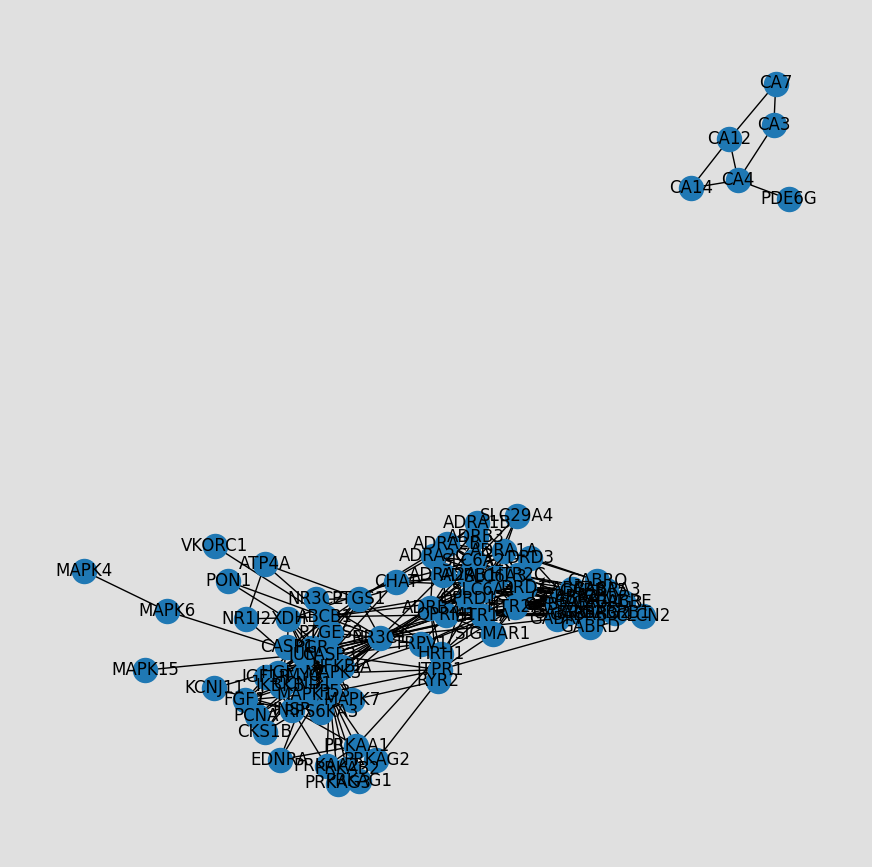

<ipython-input-11-41b085388d7c>:75: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  graph_colormap = cm.get_cmap('plasma', 12)


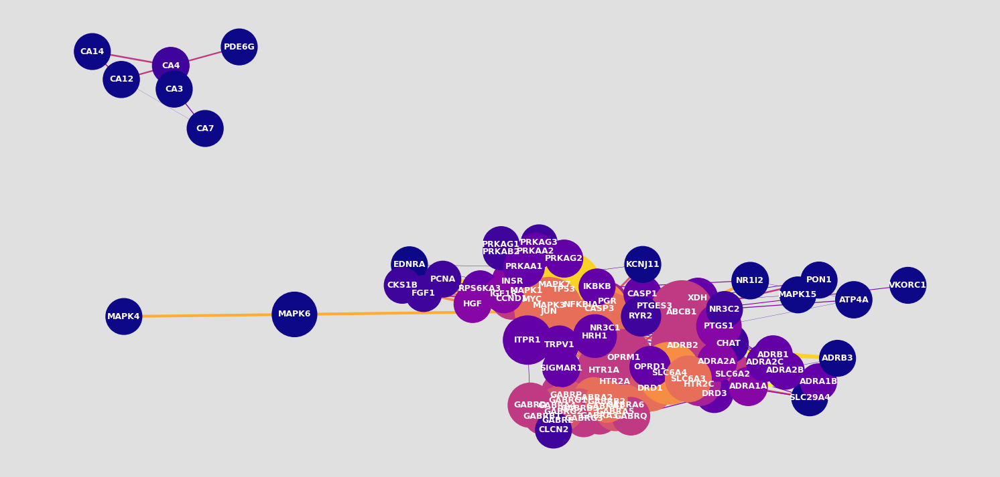

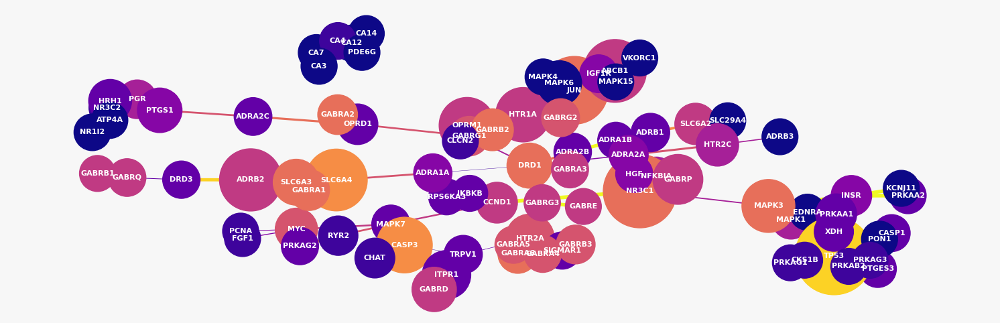

In [ ]:
import networkx as nx
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import copy

# #Drug Targets from the new file provided from Professor
# new_target_path = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/ADP_SDOH_V02172024_Target_normal_scale_by0.666416963_median.csv'
# data = pd.read_csv(new_target_path)
# pre_adp_data = copy.deepcopy(data)

# #Data from the AD+P DEG Expression
# df_DEG = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/AD+P DEGs Original data.xlsx', sheet_name= 'Sheet1')
# adp_data = copy.deepcopy(df_DEG)
# print(adp_data)


# # Filtering pre-AD+P data based on statistical significance
# filtered_pre_adp_data = pre_adp_data[
#     (~pre_adp_data['feature'].str.isnumeric()) &
#     ((pre_adp_data['p_bonferroni_non_parameter'] < 0.05) | (pre_adp_data['FDR_Q_non_parameter'] < 0.05))
# ]

# # print('filtered_pre_adp_feature_col', filtered_pre_adp_data['feature'])

# # Extracting unique protein targets from the AD+P dataset
# adp_protein_targets = adp_data['Gene'].unique()
# # print('adp_protein_targets', adp_protein_targets)

# # Summary of selections
# filtered_pre_adp_count = len(filtered_pre_adp_data)
# adp_protein_targets_count = len(adp_protein_targets)

# #print(filtered_pre_adp_count, adp_protein_targets_count)

# #create the corresponding target list
# target_list = filtered_pre_adp_data['feature'].tolist()
# protein_exp_list = adp_protein_targets.tolist()


proteins = '%0d'.join(target_list)
url = 'https://string-db.org/api/tsv/network?identifiers=' + proteins + '&species=9606'
r = requests.get(url)

lines = r.text.split('\n') # pull the text from the response object and split based on new lines
data = [l.split('\t') for l in lines] # split each line into its components based on tabs
print(data)
# convert to dataframe using the first row as the column names; drop empty, final row
df = pd.DataFrame(data[1:-1], columns = data[0])
# dataframe with the preferred names of the two proteins and the score of the interaction
interactions = df[['preferredName_A', 'preferredName_B', 'score']]

G_1=nx.Graph(name='Protein Interaction Graph')
interactions = np.array(interactions)
for i in range(len(interactions)):
    interaction = interactions[i]
    a = interaction[0] # protein a node
    b = interaction[1] # protein b node
    w = float(interaction[2]) # score as weighted edge where high scores = low weight
    G_1.add_weighted_edges_from([(a,b,w)]) # add weighted edge to graph

pos = nx.spring_layout(G_1) # position the nodes using the spring layout
plt.figure(figsize=(11,11),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G_1)
plt.axis('off')
plt.show()

# function to rescale list of values to range [newmin,newmax]
def rescale(l,newmin,newmax):
    arr = list(l)
    return [(x-min(arr))/(max(arr)-min(arr))*(newmax-newmin)+newmin for x in arr]
# use the matplotlib plasma colormap
graph_colormap = cm.get_cmap('plasma', 12)
# node color varies with Degree
c = rescale([G_1.degree(v) for v in G_1],0.0,0.9)
c = [graph_colormap(i) for i in c]
# node size varies with betweeness centrality - map to range [10,100]
bc = nx.betweenness_centrality(G_1) # betweeness centrality
s =  rescale([v for v in bc.values()],1500,7000)
# edge width shows 1-weight to convert cost back to strength of interaction
ew = rescale([float(G_1[u][v]['weight']) for u,v in G_1.edges],0.1,4)
# edge color also shows weight
ec = rescale([float(G_1[u][v]['weight']) for u,v in G_1.edges],0.1,1)
ec = [graph_colormap(i) for i in ec]


pos = nx.spring_layout(G_1)
plt.figure(figsize=(19,9),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G_1, pos=pos, with_labels=True, node_color=c, node_size=s,edge_color= ec,width=ew,
                 font_color='white',font_weight='bold',font_size='9')
plt.axis('off')
plt.show()


T = nx.minimum_spanning_tree(G_1)
pos = nx.spring_layout(T)
plt.figure(figsize=(19,6),facecolor=[0.7,0.7,0.7,0.1])
nx.draw_networkx(T, pos=pos, with_labels=True,node_color=c,node_size=s,edge_color= ec,width=ew,
                font_color='white',font_weight='bold',font_size='8')
plt.axis('off')
plt.show()

#The color range goes from dark purple to bright yellow.
#The yellower the node, the higher the degree. The larger the node, the greater the betweenness centrality.
#The yellower and wider the edge, the greater the interaction score.

protein_list: ['PP14A_HUMAN', 'YL023_HUMAN', 'ARHGP_HUMAN', 'PLLP_HUMAN', 'MIX23_HUMAN', 'ASCL1_HUMAN', 'ESRG_HUMAN', 'BEND3_HUMAN', 'ZN133_HUMAN', 'TAF12_HUMAN', 'RBP56_HUMAN', 'NOM1_HUMAN', 'NPAL3_HUMAN', 'PHLP1_HUMAN', 'ESIP1_HUMAN', 'TREF1_HUMAN', 'TACO1_HUMAN', 'HAT1_HUMAN', 'SSPN_HUMAN', 'MTCL1_HUMAN', 'ADA10_HUMAN', 'GWL_HUMAN', 'TNR11_HUMAN', 'CAMKV_HUMAN', 'CN023_HUMAN', 'NPB11_HUMAN', 'GPX7_HUMAN', 'CNTN5_HUMAN', 'CHST5_HUMAN', 'PARP4_HUMAN', 'ALG5_HUMAN', 'SSR1_HUMAN', 'DNS2A_HUMAN', 'CL042_HUMAN', 'SYT10_HUMAN', 'ZN581_HUMAN', 'SHE_HUMAN', 'ZN486_HUMAN', 'KCC2A_HUMAN', 'ZIC4_HUMAN', 'VAMP3_HUMAN', 'DYLT1_HUMAN', 'GRM1_HUMAN', 'CEA19_HUMAN', 'SIR3_HUMAN', 'DIK2B_HUMAN', 'SHC3_HUMAN', 'ZN667_HUMAN', 'TM74B_HUMAN', 'HPS5_HUMAN', 'TOR3A_HUMAN', 'THAP1_HUMAN', 'REX1B_HUMAN', 'RENBP_HUMAN', 'AGIT1_HUMAN', 'GP160_HUMAN', 'GG6L9_HUMAN', 'PHF7_HUMAN', 'EFC14_HUMAN', 'GRM6_HUMAN', 'PEPL_HUMAN', 'BTBD9_HUMAN', 'KLK6_HUMAN', 'RN212_HUMAN', 'LACC1_HUMAN', 'HPCL4_HUMAN', 'CABP4_HUMAN', '

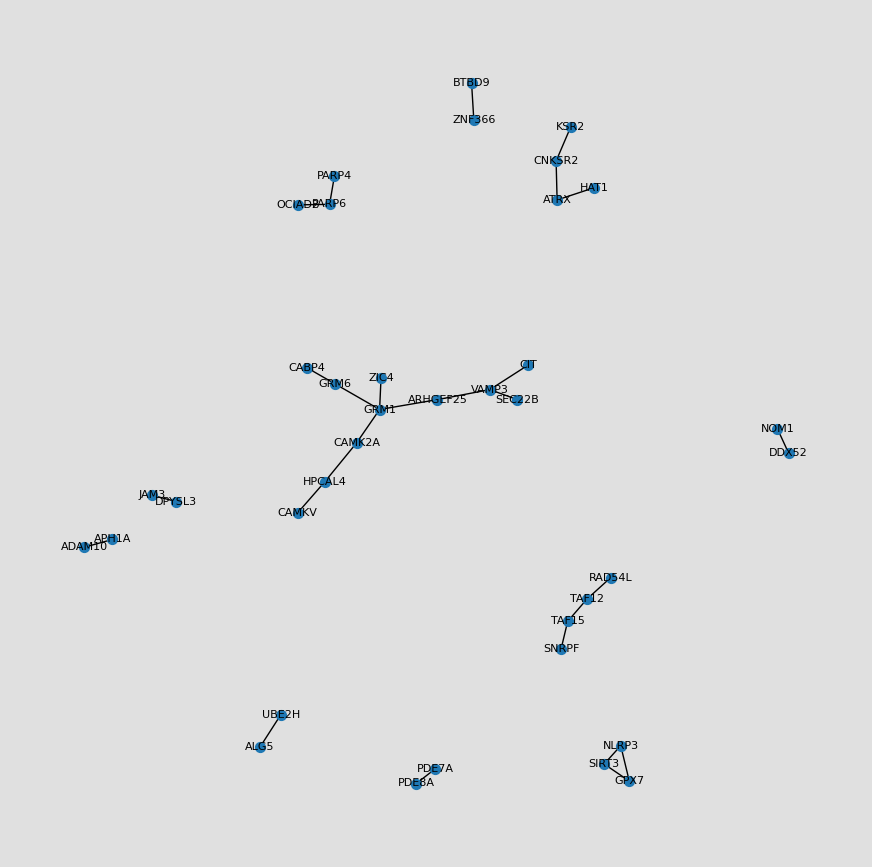

<ipython-input-12-e7b6a904c073>:90: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  graph_colormap = cm.get_cmap('plasma', 12)


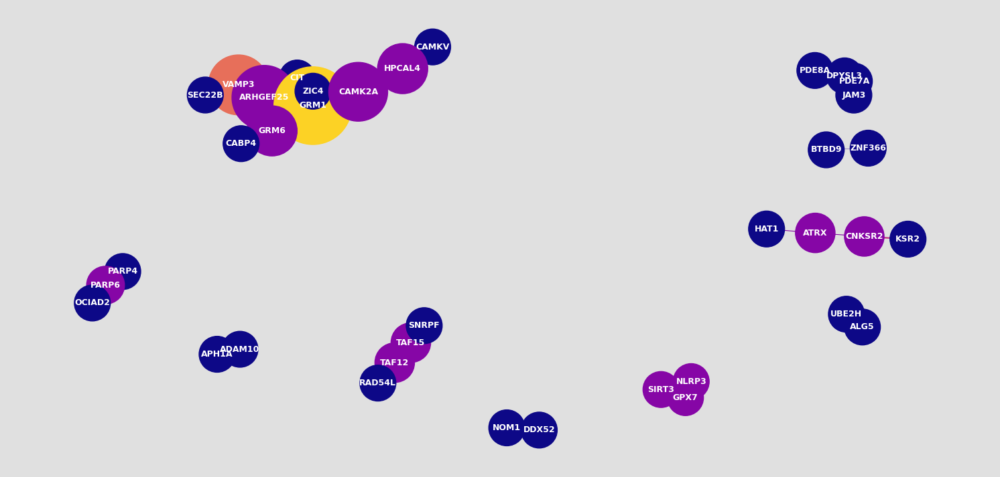

In [ ]:
#Convert the gene_list to proteins
uniprotkb_ids =[]
for g in protein_exp_list:
  protein_mapping = map_genes_to_uniprot_proteins(g)
  # print("gene:", g, "protein_mapping:", protein_mapping)
  proteins = extract_uniprotkb_ids(protein_mapping)
  # Filter for IDs that end with '_HUMAN'
  # human_ids = [id for id in proteins if id.endswith('_HUMAN')]
  uniprotkb_ids.append(proteins)
  # print(f'gene:{g} to protein: {proteins}')
# print(uniprotkb_ids)

protein_list = flatten_list(uniprotkb_ids)
print("protein_list:", protein_list)

proteins_1 = '%0d'.join(protein_list)
url = 'https://string-db.org/api/tsv/network?identifiers=' + proteins_1 + '&species=9606'
r = requests.get(url)

# lines = r.text.split('\n') # pull the text from the response object and split based on new lines
# data = [l.split('\t') for l in lines] # split each line into its components based on tabs
# print(data)
# # convert to dataframe using the first row as the column names; drop empty, final row
# df = pd.DataFrame(data[1:-1], columns = data[0])
# # dataframe with the preferred names of the two proteins and the score of the interaction
# interactions = df[['preferredName_A', 'preferredName_B', 'score']]

# G_1=nx.Graph(name='Protein Interaction Graph')
# interactions = np.array(interactions)
# for i in range(len(interactions)):
#     interaction = interactions[i]
#     a = interaction[0] # protein a node
#     b = interaction[1] # protein b node
#     w = float(interaction[2]) # score as weighted edge where high scores = low weight
#     G_1.add_weighted_edges_from([(a,b,w)]) # add weighted edge to graph

# pos = nx.spring_layout(G_1) # position the nodes using the spring layout
# plt.figure(figsize=(11,11),facecolor=[0.7,0.7,0.7,0.4])
# nx.draw_networkx(G_1)
# plt.axis('off')
# plt.show()

# Define the POST request URL and data payload
url = 'https://string-db.org/api/tsv/network'
data = {
    'identifiers': proteins_1,  # Your proteins, separated by newline (%0d)
    'species': 9606,  # For Homo sapiens
}

# Make the POST request
response = requests.post(url, data=data)

if response.status_code == 200:
    # Process the response text into lines and then into a list of lists based on tab separation
    lines = response.text.split('\n')
    data = [line.split('\t') for line in lines if line]  # Ensure line is not empty
    print(data)  # Debug: print raw data

    # Convert to DataFrame assuming the first line contains column names
    df = pd.DataFrame(data[1:], columns=data[0])

    # Extract the relevant columns
    interactions = df[['preferredName_A', 'preferredName_B', 'score']]

    # Convert interactions to a NumPy array for easier processing
    interactions_array = interactions.to_numpy()

    # Create the Graph
    G_2 = nx.Graph(name='Protein Interaction Graph')
    for interaction in interactions_array:
        a, b, w = interaction
        G_2.add_weighted_edges_from([(a, b, float(w))])  # Convert weight to float

    # Visualization
    pos = nx.spring_layout(G_2)
    plt.figure(figsize=(11,11), facecolor=[0.7,0.7,0.7,0.4])
    nx.draw_networkx(G_2, pos, with_labels=True, node_size=50, font_size=8)
    plt.axis('off')
    plt.show()
else:
    print(f"Failed to fetch data: {response.status_code}")

# function to rescale list of values to range [newmin,newmax]

def rescale(l,newmin,newmax):
    arr = list(l)
    return [(x-min(arr))/(max(arr)-min(arr))*(newmax-newmin)+newmin for x in arr]

# use the matplotlib plasma colormap
graph_colormap = cm.get_cmap('plasma', 12)
# node color varies with Degree
c = rescale([G_2.degree(v) for v in G_2],0.0,0.9)
c = [graph_colormap(i) for i in c]
# node size varies with betweeness centrality - map to range [10,100]
bc = nx.betweenness_centrality(G_2) # betweeness centrality
s =  rescale([v for v in bc.values()],1500,7000)
# edge width shows 1-weight to convert cost back to strength of interaction
ew = rescale([float(G_2[u][v]['weight']) for u,v in G_2.edges],0.1,4)
# edge color also shows weight
ec = rescale([float(G_2[u][v]['weight']) for u,v in G_2.edges],0.1,1)
ec = [graph_colormap(i) for i in ec]


pos = nx.spring_layout(G_2)
plt.figure(figsize=(19,9),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G_2, pos=pos, with_labels=True, node_color=c, node_size=s,edge_color= ec,width=ew,
                 font_color='white',font_weight='bold',font_size='9')
plt.axis('off')
plt.show()


# T_1 = nx.minimum_spanning_tree(G_2)
# pos = nx.spring_layout(T)
# plt.figure(figsize=(19,6),facecolor=[0.7,0.7,0.7,0.1])
# nx.draw_networkx(T_1, pos=pos, with_labels=True,node_color=c,node_size=s,edge_color= ec,width=ew,
#                 font_color='white',font_weight='bold',font_size='8')
# plt.axis('off')
# plt.show()

In [ ]:
# # Find common nodes
# common_nodes = set(G_1.nodes()).intersection(set(G_2.nodes()))

# # Find common edges
# # For edges, we need to make sure that we account for the fact that (A, B) is the same as (B, A) in an undirected graph
# G_1_edges = set(frozenset(e) for e in G_1.edges())
# G_2_edges = set(frozenset(e) for e in G_2.edges())
# common_edges = G_1_edges.intersection(G_2_edges)

# # Create a new graph that contains only the common nodes and edges
# common_graph = nx.Graph()
# common_graph.add_nodes_from(common_nodes)
# common_graph.add_edges_from([tuple(e) for e in common_edges])

# pos = nx.spring_layout(common_graph)

# print(common_graph)
# # Now, we'll draw the network
# plt.figure(figsize=(12, 12))  # Set the size of the figure
# nx.draw_networkx_nodes(common_graph, pos, node_size=20, node_color='blue', alpha=0.7)
# nx.draw_networkx_edges(common_graph, pos, alpha=0.5)
# nx.draw_networkx_labels(common_graph, pos, font_size=5, font_color='black')

# plt.title('Common PPI Network')
# plt.axis('off')  # Turn off the axis
# plt.show()  # Display the graph

# graph_as_dict = nx.to_dict_of_dicts(common_graph)
# print(graph_as_dict)

Common proteins in the two lists: []


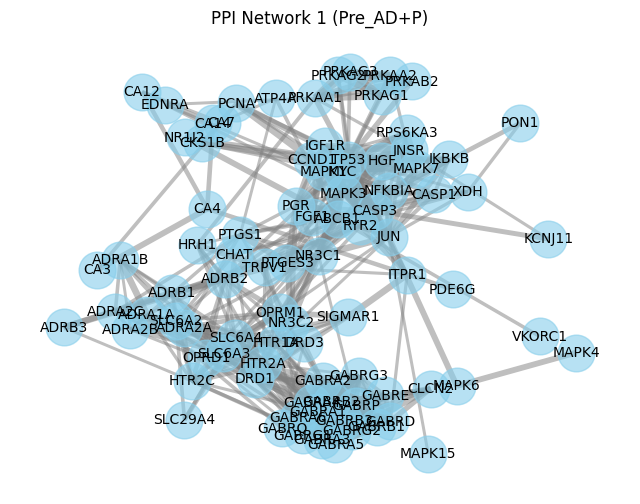

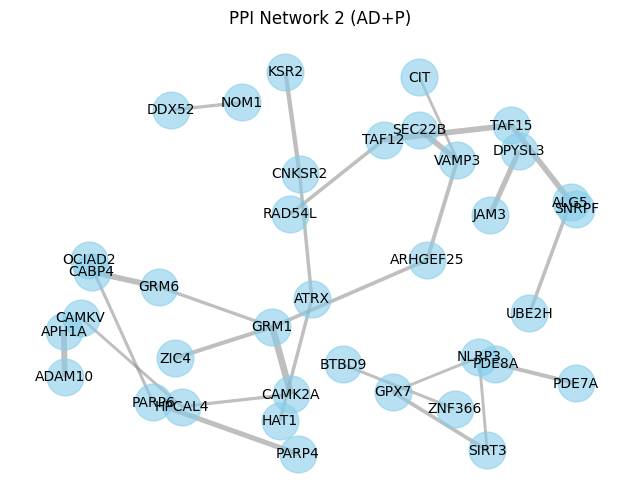

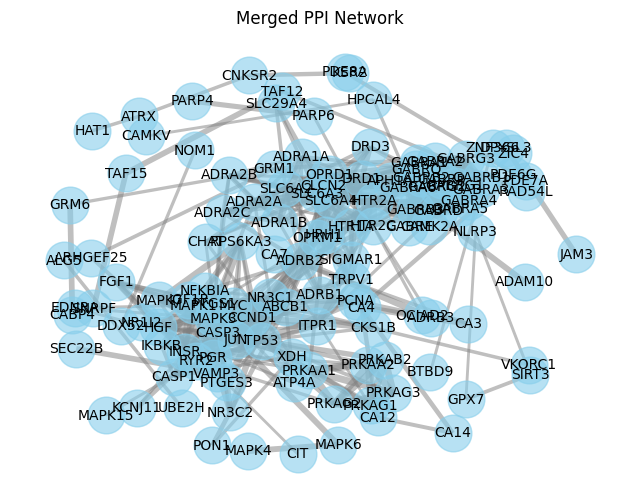

Common Nodes: set()
Common Edges: set()


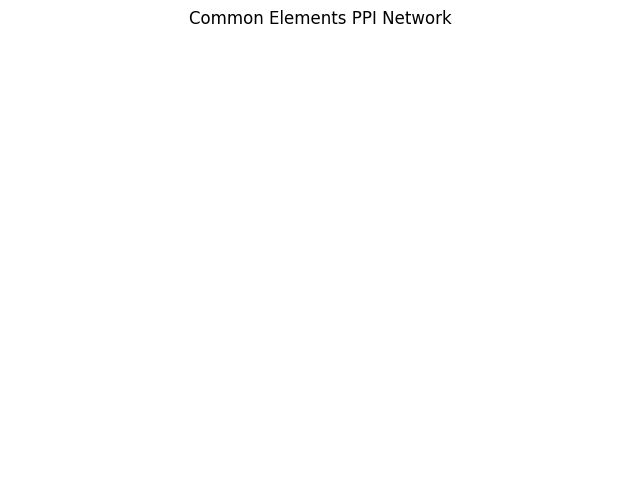

In [ ]:
import requests
import networkx as nx
import matplotlib.pyplot as plt

def find_common_elements(list1, list2):

    # Convert lists to sets to find the intersection
    common_elements = set(list1).intersection(set(list2))
    # Convert the set back to a list if you need list-specific operations later
    return list(common_elements)

common_elements = find_common_elements(target_list, protein_list)
print("Common proteins in the two lists:", common_elements)

def fetch_interactions(proteins, api_url="https://string-db.org/api/json/network", species=9606):
    """
    Fetch interactions from the STRING database for a list of proteins.
    """
    params = {
        "identifiers": "\r".join(proteins),
        "species": species,
    }
    try:
        response = requests.post(api_url, data=params, timeout=10)
        response.raise_for_status()
        return response.json()
    except requests.exceptions.RequestException as e:
        print(f"Request failed: {e}")
        return None

def create_graph(interactions):
    """
    Create a graph from STRING interactions.
    """
    G = nx.Graph()
    for interaction in interactions:
        p1 = interaction['preferredName_A']
        p2 = interaction['preferredName_B']
        score = interaction['score']
        G.add_edge(p1, p2, weight=score)
    return G

def visualize_graph(G, title="PPI Network"):

    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G, k=0.5)  # Adjust the k parameter to change the spring layout's spacing
    edges = G.edges()
    weights = [G[u][v]['weight']*5 for u,v in edges]  # Scale weights for visibility

    # Draw nodes, edges, and labels
    nx.draw_networkx_nodes(G, pos, node_size=700, node_color='skyblue', alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=edges, width=weights, alpha=0.5, edge_color='gray')
    nx.draw_networkx_labels(G, pos, font_size=10)

    plt.title(title)
    plt.axis('off')  # Turn off the axis
    plt.show()



# Fetch interactions
interactions_1 = fetch_interactions(target_list)
interactions_2 = fetch_interactions(protein_list)

if interactions_1 and interactions_2:
    # Create graphs
    G1 = create_graph(interactions_1)
    G2 = create_graph(interactions_2)

    # Merge graphs
    G_merged = nx.compose(G1, G2)

    # Visualize each graph and the combined graph
    visualize_graph(G1, "PPI Network 1 (Pre_AD+P)")
    visualize_graph(G2, "PPI Network 2 (AD+P)")
    visualize_graph(G_merged, "Merged PPI Network")
else:
    print("Failed to fetch interactions for one or both protein lists.")

def find_common_elements(G1, G2):

    common_nodes = set(G1.nodes()).intersection(set(G2.nodes()))
    common_edges = set(G1.edges()).intersection(set(G2.edges()))
    return common_nodes, common_edges

def create_common_graph(G1, G2):

    common_nodes, common_edges = find_common_elements(G1, G2)
    G_common = nx.Graph()

    # Add common nodes and edges to the common graph
    for node in common_nodes:
        G_common.add_node(node)
    for edge in common_edges:
        # Assuming 'weight' is an attribute you want to preserve. Adjust as necessary.
        weight = G1.edges[edge]['weight'] if edge in G1.edges() else G2.edges[edge]['weight']
        G_common.add_edge(edge[0], edge[1], weight=weight)

    return G_common


common_nodes, common_edges = find_common_elements(G1, G2)
print(f"Common Nodes: {common_nodes}")
print(f"Common Edges: {common_edges}")

# Create a graph with only the common elements
G_common = create_common_graph(G1, G2)

# Visualize the graph with common elements
visualize_graph(G_common, "Common Elements PPI Network")



In [ ]:
print(target_list)
print(protein_list)

['PGH1_HUMAN', 'ADRB1_HUMAN', 'ADRB2_HUMAN', 'ADRB3_HUMAN', 'ADA2A_HUMAN', '5HT1A_HUMAN', 'HRH1_HUMAN', '5HT2A_HUMAN', 'ADA1A_HUMAN', '5HT2C_HUMAN', 'SC6A4_HUMAN', 'SC6A2_HUMAN', 'DRD3_HUMAN', 'ADA1B_HUMAN', 'GBRA1_HUMAN', 'GBRA2_HUMAN', 'GBRA3_HUMAN', 'GBRA4_HUMAN', 'GBRA5_HUMAN', 'GBRA6_HUMAN', 'GBRB1_HUMAN', 'GBRB2_HUMAN', 'GBRB3_HUMAN', 'GBRD_HUMAN', 'GBRE_HUMAN', 'GBRG1_HUMAN', 'GBRG2_HUMAN', 'GBRG3_HUMAN', 'GBRP_HUMAN', 'GBRT_HUMAN', 'VKOR1_HUMAN', 'NR1I2_HUMAN', 'OPRD_HUMAN', 'OPRK_HUMAN', 'OPRM_HUMAN', 'TRPV1_HUMAN', 'ADA2B_HUMAN', 'ADA2C_HUMAN', 'ATP4A_HUMAN', 'TEBP_HUMAN', 'SGMR1_HUMAN', 'INSR_HUMAN', 'IGF1R_HUMAN', 'AK1C1_HUMAN', 'CASP1_HUMAN', 'EDNRA_HUMAN', 'NEUR1_HUMAN', 'CCND1_HUMAN', 'GRP78_HUMAN', 'IKKB_HUMAN', 'CASP3_HUMAN', 'P53_HUMAN', 'IKBA_HUMAN', 'MYC_HUMAN', 'KS6A3_HUMAN', 'AAPK1_HUMAN', 'AAPK2_HUMAN', 'AAKB2_HUMAN', 'AAKG1_HUMAN', 'AAKG2_HUMAN', 'AAKG3_HUMAN', 'PCNA_HUMAN', 'MK01_HUMAN', 'MK15_HUMAN', 'MK03_HUMAN', 'MK04_HUMAN', 'MK06_HUMAN', 'MK07_HUMAN', 'SC6

Analysis

In [ ]:
import networkx as nx
from community import community_louvain

def find_hub_proteins(G, top_n=50):
    # Calculate the degree of each node and return the top_n nodes with the highest degree
    degrees = dict(G.degree())
    sorted_degrees = sorted(degrees.items(), key=lambda item: item[1], reverse=True)
    return sorted_degrees[:top_n]

def find_clusters(G):
    # Use the Louvain method to find clusters
    partition = community_louvain.best_partition(G)
    return partition

def find_commonality(G1, G2):
    common_nodes = set(G1.nodes()).intersection(set(G2.nodes()))
    common_edges = set(G1.edges()).intersection(set(G2.edges()))
    return common_nodes, common_edges

def find_unique_interactions(G1, G2):
    unique_to_G1 = set(G1.edges()) - set(G2.edges())
    unique_to_G2 = set(G2.edges()) - set(G1.edges())
    return unique_to_G1, unique_to_G2


# Find hub proteins in both networks
hub_proteins_G1 = find_hub_proteins(G1)
hub_proteins_G2 = find_hub_proteins(G2)

# Find clusters in both networks
clusters_G1 = find_clusters(G1)
clusters_G2 = find_clusters(G2)

# Find commonalities between the networks
common_nodes, common_edges = find_commonality(G1, G2)

# Find unique interactions in both networks
unique_to_G1, unique_to_G2 = find_unique_interactions(G1, G2)

# Now you can print the results or use them for further analysis
print(f"Hub proteins in G1: {hub_proteins_G1}")
print(f"Hub proteins in G2: {hub_proteins_G2}")
print(f"Clusters in G1: {clusters_G1}")
print(f"Clusters in G2: {clusters_G2}")
print(f"Common nodes: {common_nodes}")
print(f"Common edges: {common_edges}")
print(f"Unique interactions in G1: {unique_to_G1}")
print(f"Unique interactions in G2: {unique_to_G2}")


Hub proteins in G1: [('TP53', 30), ('SLC6A4', 24), ('CASP3', 23), ('MAPK3', 22), ('NR3C1', 22), ('GABRA1', 22), ('GABRB2', 22), ('JUN', 21), ('DRD1', 21), ('GABRA6', 21), ('GABRA2', 20), ('SLC6A3', 20), ('HTR2A', 19), ('GABRG1', 19), ('GABRB3', 19), ('GABRG2', 19), ('MYC', 18), ('GABRA4', 18), ('GABRA5', 18), ('CCND1', 17), ('OPRM1', 17), ('HTR1A', 17), ('GABRP', 17), ('GABRA3', 17), ('GABRG3', 17), ('GABRQ', 17), ('GABRD', 17), ('ADRB2', 16), ('SLC6A2', 15), ('ABCB1', 15), ('GABRE', 15), ('GABRB1', 15), ('MAPK1', 14), ('HTR2C', 13), ('NFKBIA', 12), ('PGR', 12), ('ADRA2A', 11), ('IGF1R', 11), ('PTGS1', 11), ('INSR', 10), ('ADRA1A', 10), ('HGF', 10), ('MAPK7', 9), ('ADRA2B', 9), ('ADRA2C', 9), ('OPRD1', 9), ('PRKAA1', 9), ('PTGES3', 8), ('RPS6KA3', 8), ('CASP1', 8)]
Hub proteins in G2: [('GRM1', 4), ('VAMP3', 3), ('ARHGEF25', 2), ('TAF12', 2), ('TAF15', 2), ('ATRX', 2), ('GRM6', 2), ('CAMK2A', 2), ('NLRP3', 2), ('GPX7', 2), ('SIRT3', 2), ('CNKSR2', 2), ('PARP6', 2), ('HPCAL4', 2), ('CIT

In [ ]:
len(protein_list)

138

PPI for the PSD ADP dataset

['Q8IVF2', 'P07602', 'Q8N3V7', 'Q7Z460', 'Q9HA65', 'P11277', 'O14490', 'Q5SW79', 'Q9UPR0', 'Q96CV9', 'Q66K74', 'Q09666', 'Q15477', 'Q5JU85', 'Q14244', 'O15079', 'Q92974', 'Q7Z406', 'Q9UEW8', 'Q96Q05', 'Q15042', 'P24821', 'Q9UJF2', 'P57737', 'Q9BTE6', 'Q5TBA9', 'Q96PU5', 'Q8TDC3', 'P35609', 'Q8N387', 'Q6NV74', 'P00505', 'O14773', 'Q9Y6D6', 'Q12955', 'Q15149', 'Q9P1A6', 'P23677', 'O75334', 'Q8IYB4', 'O15294', 'P45974', 'Q9H254', 'Q9UHD2', 'Q9C0H9', 'O43236', 'Q9NQC7', 'Q8N9I9', 'Q16566', 'Q8N1I0', 'O00562', 'Q6PKG0', 'P11498', 'Q9H2M9', 'P05129', 'Q9P2B4', 'Q96BY7', 'Q9UPQ0', 'Q5TH69', 'Q12979', 'Q8NF91', 'Q08462', 'Q92556', 'P11274', 'Q5T0F9', 'Q13510', 'Q92574', 'O75122', 'P40763', 'Q9C0D0', 'P42224', 'Q9UPN3', 'Q27J81', 'Q02410', 'Q9Y5S2', 'P11137', 'Q92614', 'O43865', 'Q02156', 'P09417', 'Q8N1G4', 'P02794', 'Q13045', 'O14531', 'P60201', 'O60381', 'Q8WUH2', 'Q4KMP7', 'Q9H7D7', 'P27816', 'O75145', 'Q08495', 'Q9Y3S1', 'Q14008', 'Q7RTP6', 'P04350', 'A0AVT1', 'Q9BW30', 'Q9NV70', 'A6NGB9',

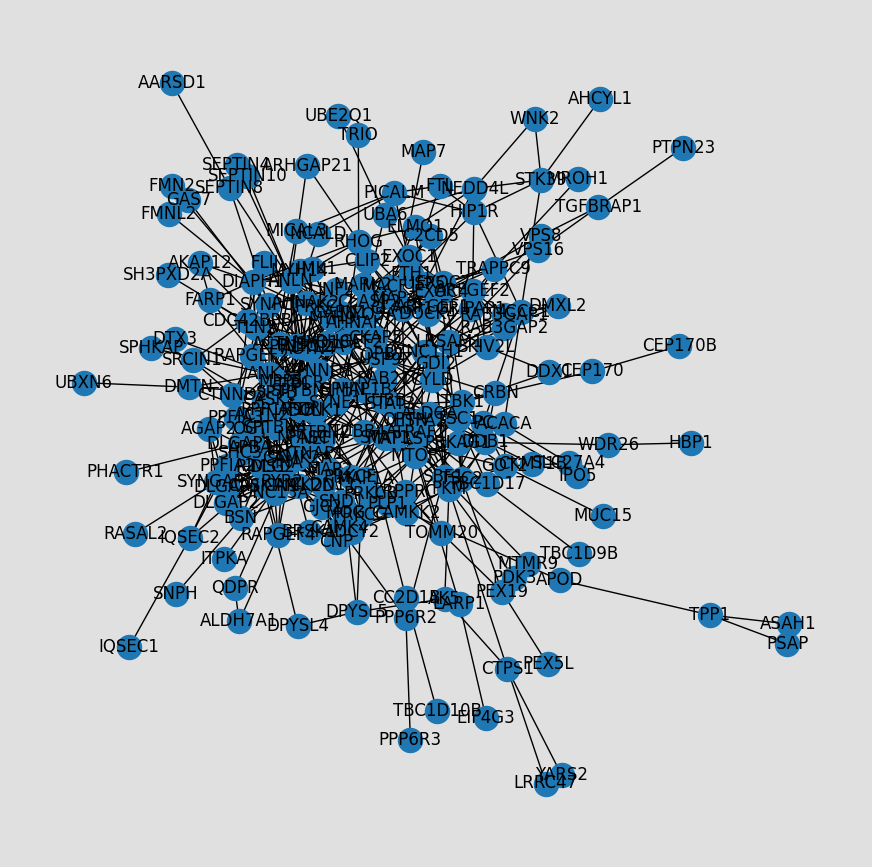

<ipython-input-18-559d327b80e4>:62: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  graph_colormap = cm.get_cmap('plasma', 12)


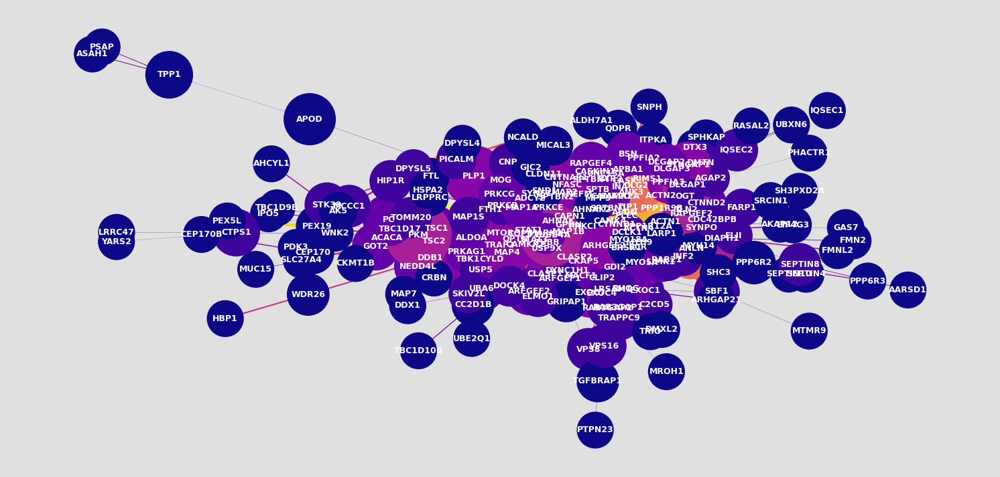

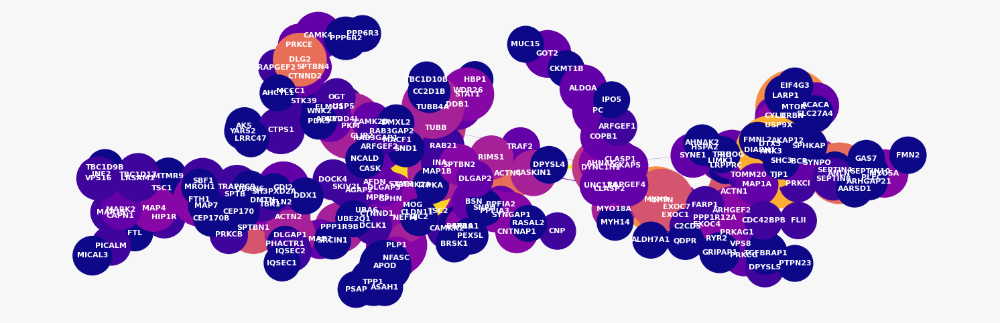

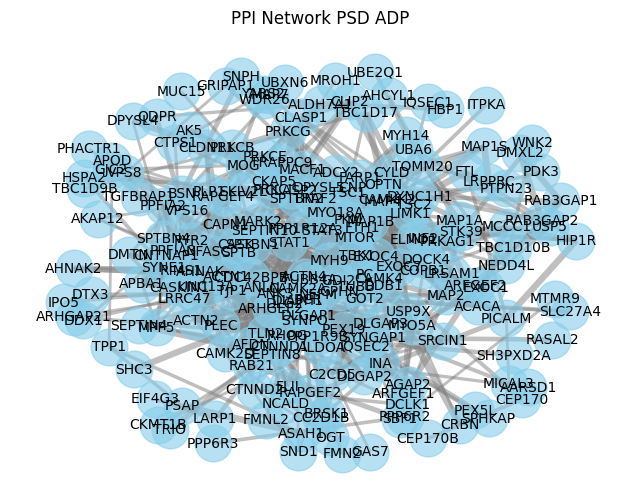

In [ ]:
import networkx as nx
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import copy

#Drug Targets from the new file provided from Professor
protein_path = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/PSD ADP Protein expression updated 240 10_25.csv'
data = pd.read_csv(protein_path)
psd_protein_data = copy.deepcopy(data)

# #Data from the AD+P DEG Expression
# df_DEG = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/data/AD+P DEGs Original data.xlsx', sheet_name= 'Sheet1')
# adp_data = copy.deepcopy(df_DEG)
# print(adp_data)


# Filtering PSD data based on statistical significance
filtered_psd_protein = psd_protein_data.loc[psd_protein_data['P.Value'] < 0.05, 'protein']

# print(filtered_psd_protein)



filtered_psd_protein_list = filtered_psd_protein.tolist()
print(filtered_psd_protein_list)

psd_proteins = '%0d'.join(filtered_psd_protein_list)
url = 'https://string-db.org/api/tsv/network?identifiers=' + psd_proteins + '&species=9606'
r = requests.get(url)

lines = r.text.split('\n') # pull the text from the response object and split based on new lines
data = [l.split('\t') for l in lines] # split each line into its components based on tabs
print(data)
# convert to dataframe using the first row as the column names; drop empty, final row
df = pd.DataFrame(data[1:-1], columns = data[0])
# dataframe with the preferred names of the two proteins and the score of the interaction
interactions = df[['preferredName_A', 'preferredName_B', 'score']]

G_4=nx.Graph(name='Protein Interaction Graph')
interactions = np.array(interactions)
for i in range(len(interactions)):
    interaction = interactions[i]
    a = interaction[0] # protein a node
    b = interaction[1] # protein b node
    w = float(interaction[2]) # score as weighted edge where high scores = low weight
    G_4.add_weighted_edges_from([(a,b,w)]) # add weighted edge to graph

pos = nx.spring_layout(G_4) # position the nodes using the spring layout
plt.figure(figsize=(11,11),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G_4)
plt.axis('off')
plt.show()

# function to rescale list of values to range [newmin,newmax]
def rescale(l,newmin,newmax):
    arr = list(l)
    return [(x-min(arr))/(max(arr)-min(arr))*(newmax-newmin)+newmin for x in arr]
# use the matplotlib plasma colormap
graph_colormap = cm.get_cmap('plasma', 12)
# node color varies with Degree
c = rescale([G_4.degree(v) for v in G_4],0.0,0.9)
c = [graph_colormap(i) for i in c]
# node size varies with betweeness centrality - map to range [10,100]
bc = nx.betweenness_centrality(G_4) # betweeness centrality
s =  rescale([v for v in bc.values()],1500,7000)
# edge width shows 1-weight to convert cost back to strength of interaction
ew = rescale([float(G_4[u][v]['weight']) for u,v in G_4.edges],0.1,4)
# edge color also shows weight
ec = rescale([float(G_4[u][v]['weight']) for u,v in G_4.edges],0.1,1)
ec = [graph_colormap(i) for i in ec]


pos = nx.spring_layout(G_4)
plt.figure(figsize=(19,9),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G_4, pos=pos, with_labels=True, node_color=c, node_size=s,edge_color= ec,width=ew,
                 font_color='white',font_weight='bold',font_size='9')
plt.axis('off')
plt.show()


T = nx.minimum_spanning_tree(G_4)
pos = nx.spring_layout(T)
plt.figure(figsize=(19,6),facecolor=[0.7,0.7,0.7,0.1])
nx.draw_networkx(T, pos=pos, with_labels=True,node_color=c,node_size=s,edge_color= ec,width=ew,
                font_color='white',font_weight='bold',font_size='8')
plt.axis('off')
plt.show()


interactions_3 = fetch_interactions(filtered_psd_protein_list)

if interactions_3:
    # Create graphs
    G3 = create_graph(interactions_3)
    visualize_graph(G3, "PPI Network PSD ADP")
else:
    print("Failed to fetch interactions protein lists.")

#The color range goes from dark purple to bright yellow.
#The yellower the node, the higher the degree. The larger the node, the greater the betweenness centrality.
#The yellower and wider the edge, the greater the interaction score.

In [ ]:
# Find hub proteins in both networks
hub_proteins_G3 = find_hub_proteins(G3)

# Find clusters in both networks
clusters_G3 = find_clusters(G3)

# Find commonalities between the networks
# common_nodes, common_edges = find_commonality(G1, G2)

# Find unique interactions in both networks
# unique_to_G1, unique_to_G2 = find_unique_interactions(G1, G2)

# Now you can print the results or use them for further analysis
print(f"Hub proteins in G3: {hub_proteins_G3}")
print(f"Clusters in G3: {clusters_G3}")


Hub proteins in G3: [('CAMK2A', 27), ('TJP1', 23), ('ANK3', 23), ('MYH9', 21), ('MTOR', 21), ('ANLN', 20), ('ACTN4', 18), ('DLG2', 18), ('SPTBN1', 17), ('ACTN1', 16), ('OPTN', 16), ('STAT3', 15), ('DYNC1H1', 14), ('TUBB', 14), ('PPP1R12A', 13), ('PPP1R9B', 13), ('DLGAP1', 13), ('SYNPO', 12), ('DIAPH1', 12), ('MAP1B', 12), ('PKM', 12), ('RIMS1', 12), ('CASK', 11), ('PLEC', 11), ('MYO18A', 11), ('NEFM', 11), ('TLN2', 11), ('ACTN2', 11), ('TUBB4A', 11), ('CASKIN1', 11), ('PLP1', 10), ('MYO5A', 10), ('TBK1', 10), ('APBA1', 10), ('STAT1', 10), ('CNTNAP1', 10), ('ARHGEF2', 10), ('NFASC', 10), ('PPFIA3', 10), ('SYNGAP1', 10), ('MOG', 9), ('EXOC7', 9), ('AHNAK', 9), ('TSC2', 9), ('CLASP2', 9), ('USP9X', 9), ('FTH1', 9), ('CTNND1', 9), ('GPHN', 9), ('RYR2', 9)]
Clusters in G3: {'CLDN11': 0, 'MOG': 0, 'PLP1': 0, 'CNP': 0, 'TJP1': 1, 'MYH9': 1, 'DYNC1H1': 2, 'EXOC4': 3, 'EXOC7': 3, 'EXOC1': 3, 'SYNPO': 1, 'TUBB': 2, 'STAT3': 4, 'CASK': 5, 'PLEC': 1, 'ANLN': 1, 'AHNAK': 1, 'SPTBN1': 0, 'MYO18A': 1

In [ ]:
!pip install -U python-louvain
import community as community_louvain
import community

Analysis of pre AD+P, AD+P and PSD ADP PPI networks

/usr/local/lib/python3.10/dist-packages/community/__init__.py
Pre AD+P Network:
Number of Nodes: 88
Number of Edges: 481
Average Degree: 10.931818181818182
Clustering Coefficient: 0.539125575166802
---
AD+P Network:
Number of Nodes: 37
Number of Edges: 27
Average Degree: 1.4594594594594594
Clustering Coefficient: 0.08108108108108109
---
PSD ADP Network:
Number of Nodes: 206
Number of Edges: 634
Average Degree: 6.155339805825243
Clustering Coefficient: 0.24999655971781085
---


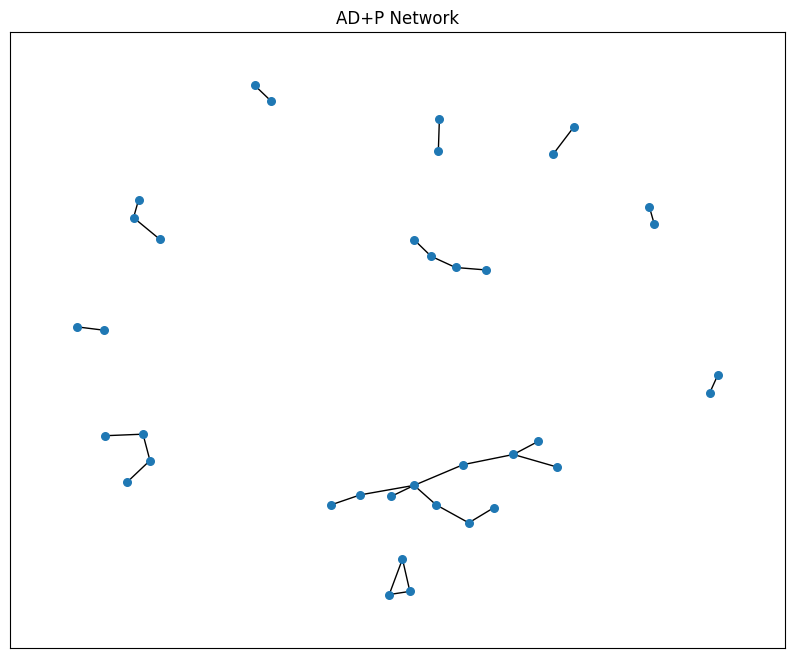

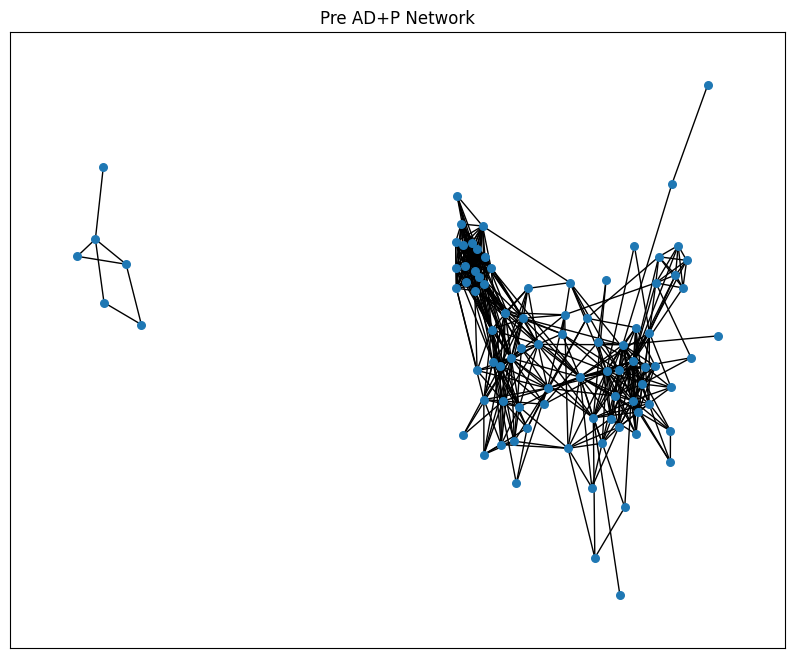

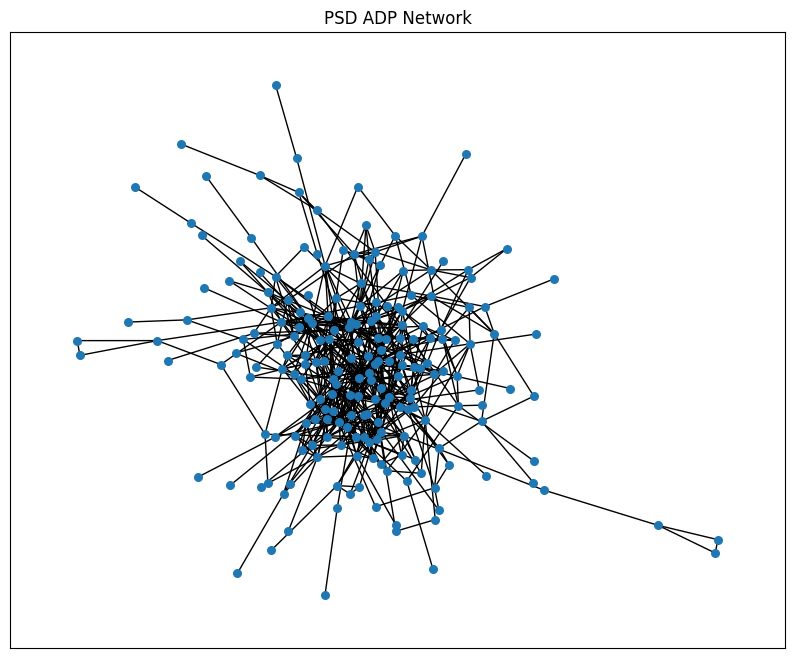

Unique in Network Pre Ad+P: 481
Unique in Network AD+P: 27
Unique in Network PSD AD: 634
Shared between all networks: 0


In [ ]:
import importlib
import community
importlib.reload(community)
print(community.__file__)

def analyze_network_topology(network):
    print("Number of Nodes:", network.number_of_nodes())
    print("Number of Edges:", network.number_of_edges())
    print("Average Degree:", sum(dict(network.degree()).values()) / network.number_of_nodes())
    print("Clustering Coefficient:", nx.average_clustering(network))
    print("---")

print("Pre AD+P Network:")
analyze_network_topology(G1)

print("AD+P Network:")
analyze_network_topology(G2)

print("PSD ADP Network:")
analyze_network_topology(G3)


import matplotlib.pyplot as plt

def visualize_network(network, title):
    plt.figure(figsize=(10, 8))
    nx.draw_networkx(network, with_labels=False, node_size=30)
    plt.title(title)
    plt.show()

visualize_network(G2, "AD+P Network")
visualize_network(G1, "Pre AD+P Network")
visualize_network(G3, "PSD ADP Network")


import community as community_louvain

def detect_and_visualize_communities(network, title):
    # Detect communities
    partition = community_louvain.best_partition(network)
    # Visualization
    plt.figure(figsize=(10, 8))
    cmap = plt.cm.get_cmap('viridis', max(partition.values()) + 1)
    nx.draw_networkx_nodes(network, pos=nx.spring_layout(network), node_size=40,
                           cmap=cmap, node_color=list(partition.values()))
    nx.draw_networkx_edges(network, pos=nx.spring_layout(network), alpha=0.5)
    plt.title(f"Communities in {title}")
    plt.show()

# detect_and_visualize_communities(G2, "AD+P Network")
# detect_and_visualize_communities(G1, "Pre AD+P Network")
# detect_and_visualize_communities(G3, "PSD ADP Network")

def compare_networks(net1, net2, net3):
    unique_in_net1 = net1.edges - net2.edges - net3.edges
    unique_in_net2 = net2.edges - net1.edges - net3.edges
    unique_in_net3 = net3.edges - net1.edges - net2.edges
    shared_between_all = net1.edges & net2.edges & net3.edges

    print(f"Unique in Network Pre Ad+P: {len(unique_in_net1)}")
    print(f"Unique in Network AD+P: {len(unique_in_net2)}")
    print(f"Unique in Network PSD AD: {len(unique_in_net3)}")
    print(f"Shared between all networks: {len(shared_between_all)}")

compare_networks(G1, G2, G3)


Implementing NETTAG

In [ ]:
#G1(pre AD+P)
#G2(AD+P)
#G_4 (PSD ADP)

graphs = {'G1': G1, 'G2': G2, 'G3': G_4}

# Loop through the dictionary and save each graph to a GraphML file
for name, graph in graphs.items():
    file_path = f"/content/drive/MyDrive/Colab Notebooks/UPitt_AD/{name}.graphml"
    nx.write_graphml(graph, file_path)
    print(f"Graph {name} saved to {file_path}")

Graph G1 saved to /content/drive/MyDrive/Colab Notebooks/UPitt_AD/G1.graphml
Graph G2 saved to /content/drive/MyDrive/Colab Notebooks/UPitt_AD/G2.graphml
Graph G3 saved to /content/drive/MyDrive/Colab Notebooks/UPitt_AD/G3.graphml


In [ ]:
"""Various utility functions."""
import numpy as np
import scipy.sparse as sp
import torch
from typing import Union
import networkx as nx
import random
from sklearn.preprocessing import normalize, StandardScaler
from collections import Counter
from scipy.stats import norm
from sklearn.decomposition import TruncatedSVD
from itertools import islice
import os
import logging

def setup_logger(args):
    # Create a directory to store log files
    if not os.path.exists(args.dirlog):
        os.makedirs(args.dirlog)

    # Set up logging
    logging.basicConfig(level=logging.INFO)
    logger = logging.getLogger()

    # Create a file handler that writes log messages to a file in the specified directory

    log_file = os.path.join(args.dirlog, 'log.txt')
    file_handler = logging.FileHandler(log_file)

    # Set the format of the log messages
    formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
    file_handler.setFormatter(formatter)

    # Add the file handler to the logger
    logger.addHandler(file_handler)

    return logger


# def load_dataset(dir_net, bin_num, logger, header = False):
#     '''

#     change the remove 7316
#     :param dir_net:
#     :param bin_num:
#     :param header:
#     :return:
#     '''

#     with open(dir_net, mode='r') as f:
#         if header:
#             next(f)
#         net_nA = []
#         net_nB = []
#         for line in f:
#             na, nb = line.strip("\n").split("\t")
#             net_nA.append(na)
#             net_nB.append(nb)

#     G = nx.Graph()
#     G.add_edges_from(list(zip(net_nA, net_nB)))
#     G.remove_edges_from(nx.selfloop_edges(G))

#     logger.info('There are {} of nodes in the loaded PPI!'.format(len(list(G.nodes()))))

#     net_node = list(max(nx.connected_components(G), key = len))
#     net_node = sorted(net_node)


#     NODE2ID = dict()
#     ID2NODE = dict()
#     for idx in range(len(net_node)):
#         ID2NODE[idx] = net_node[idx]
#         NODE2ID[net_node[idx]] = idx

#     row_idx = []
#     col_idx = []
#     val_idx = []
#     for n_a, n_b in zip(net_nA, net_nB):
#         if n_a in net_node and n_b in net_node:
#             row_idx.append(NODE2ID[n_a])
#             col_idx.append(NODE2ID[n_b])
#             val_idx.append(1.0)
#             row_idx.append(NODE2ID[n_b])
#             col_idx.append(NODE2ID[n_a])
#             val_idx.append(1.0)

#     A = sp.csr_matrix((np.array(val_idx), (np.array(row_idx), np.array(col_idx))), shape=(len(net_node), len(net_node)))
#     A = A.tolil()
#     A.setdiag(0)
#     A = A.tocsr()

#     G_lcc = nx.Graph()
#     G_lcc.add_edges_from(list(zip(row_idx, col_idx)))
#     node_degree = {n: G_lcc.degree[n] for n in G_lcc.nodes}
#     sorted_node_degree = dict(sorted(node_degree.items(), key=lambda item: item[1]))
#     node2bin = np.array_split(list(sorted_node_degree.keys()), bin_num)

#     return A, G_lcc, NODE2ID, ID2NODE, node2bin


def load_dataset(dir_net, bin_num, logger):
    '''

    change the remove 7316
    :param dir_net:
    :param bin_num:
    :param header:
    :return:
    '''

    G = nx.read_adjlist(dir_net)
    G.remove_edges_from(nx.selfloop_edges(G))

    logger.info('There are {} of nodes in the loaded PPI!'.format(len(list(G.nodes()))))
    net_node = list(max(nx.connected_components(G), key=len))
    net_node = sorted(net_node)

    NODE2ID = dict()
    ID2NODE = dict()
    for idx in range(len(net_node)):
        ID2NODE[idx] = net_node[idx]
        NODE2ID[net_node[idx]] = idx

    row_idx = []
    col_idx = []
    val_idx = []
    for e in G.edges:
        if e[0] in net_node and e[1] in net_node:
            row_idx.append(NODE2ID[e[0]])
            col_idx.append(NODE2ID[e[1]])
            val_idx.append(1.0)
            row_idx.append(NODE2ID[e[1]])
            col_idx.append(NODE2ID[e[0]])
            val_idx.append(1.0)

    A = sp.csr_matrix((np.array(val_idx), (np.array(row_idx), np.array(col_idx))), shape=(len(net_node), len(net_node)))
    A = A.tolil()
    A.setdiag(0)
    A = A.tocsr()

    G_lcc = nx.Graph()
    G_lcc.add_edges_from(list(zip(row_idx, col_idx)))
    node_degree = {n: G_lcc.degree[n] for n in G_lcc.nodes}
    sorted_node_degree = dict(sorted(node_degree.items(), key=lambda item: item[1]))
    node2bin = np.array_split(list(sorted_node_degree.keys()), bin_num)

    return A, G_lcc, NODE2ID, ID2NODE, node2bin

def load_dataset(dir_net, bin_num, header = True):

    with open(dir_net, mode='r') as f:
        if header:
            next(f)
        net_nA = []
        net_nB = []
        for line in f:
            na, nb = line.strip("\n").split("\t")
            if na != '7316' or nb != '7316':
                net_nA.append(na)
                net_nB.append(nb)

    G = nx.Graph()
    G.add_edges_from(list(zip(net_nA, net_nB)))
    G.remove_edges_from(nx.selfloop_edges(G))
    net_node = list(max(nx.connected_components(G), key = len))
    net_node = sorted(net_node)


    NODE2ID = dict()
    ID2NODE = dict()
    for idx in range(len(net_node)):
        ID2NODE[idx] = net_node[idx]
        NODE2ID[net_node[idx]] = idx

    row_idx = []
    col_idx = []
    val_idx = []
    for n_a, n_b in zip(net_nA, net_nB):
        if n_a in net_node and n_b in net_node:
            row_idx.append(NODE2ID[n_a])
            col_idx.append(NODE2ID[n_b])
            val_idx.append(1.0)
            row_idx.append(NODE2ID[n_b])
            col_idx.append(NODE2ID[n_a])
            val_idx.append(1.0)

    A = sp.csr_matrix((np.array(val_idx), (np.array(row_idx), np.array(col_idx))), shape=(len(net_node), len(net_node)))
    A = A.tolil()
    A.setdiag(0)
    A = A.tocsr()

    G_lcc = nx.Graph()
    G_lcc.add_edges_from(list(zip(row_idx, col_idx)))
    node_degree = {n: G_lcc.degree[n] for n in G_lcc.nodes}
    sorted_node_degree = dict(sorted(node_degree.items(), key=lambda item: item[1]))
    node2bin = np.array_split(list(sorted_node_degree.keys()), bin_num)

    return A, G_lcc, NODE2ID, ID2NODE, node2bin



def l2_reg_loss(model, scale=1e-5):

    loss = 0.0
    for w in model.get_weights():
        loss += w.pow(2.).sum()
    return loss * scale



def to_sparse_tensor(matrix: Union[sp.spmatrix, torch.Tensor, np.array],
                     device, logger
                     ) -> Union[torch.sparse.FloatTensor, torch.cuda.sparse.FloatTensor]:


    if sp.issparse(matrix):
        coo = matrix.tocoo()
        indices = torch.LongTensor(np.vstack([coo.row, coo.col]))
        values = torch.FloatTensor(coo.data)
        shape = torch.Size(coo.shape)
        sparse_tensor = torch.sparse.FloatTensor(indices, values, shape)
    elif torch.is_tensor(matrix):
        row, col = matrix.nonzero().t()
        indices = torch.stack([row, col])
        values = matrix[row, col]
        shape = torch.Size(matrix.shape)
        sparse_tensor  = torch.sparse.FloatTensor(indices, values, shape)
    elif isinstance(matrix, np.ndarray):
        sparse_tensor = torch.FloatTensor(matrix)
    else:
        logger.error(f"matrix must be scipy.sparse or torch.Tensor or numpy.array (got {type(matrix)} instead).")
        # raise ValueError(f"matrix must be scipy.sparse or torch.Tensor or numpy.array (got {type(matrix)} instead).")
    if device:
        sparse_tensor = sparse_tensor.to(device)
    if isinstance(matrix, np.ndarray):
        return sparse_tensor
    else:
        return sparse_tensor.coalesce()

    # return sparse_tensor if isinstance(matrix, np.ndarray) else sparse_tensor.coalesce()



def feature_generator(A, n_comp, rand_seed, logger, preprocess = None):
    assert preprocess in ["None", "svd"]
    if preprocess == "None":
        feat = A
    elif preprocess == "svd":
        svd = TruncatedSVD(n_components=n_comp, n_iter=7, random_state=rand_seed)
        feat = svd.fit_transform(A)
        logger.info('svd explained variance ratio = {}'.format(svd.explained_variance_ratio_.sum()))
        # print("svd explained variance ratio = ", svd.explained_variance_ratio_.sum())
    return feat


def normalize_adj(adj, sparse=True):

    adj = sp.coo_matrix(adj)
    rowsum = np.array(adj.sum(1))
    d_inv_sqrt = np.power(rowsum, -0.5).flatten()
    d_inv_sqrt[np.isinf(d_inv_sqrt)] = 0.
    d_mat_inv_sqrt = sp.diags(d_inv_sqrt)
    res = adj.dot(d_mat_inv_sqrt).transpose().dot(d_mat_inv_sqrt)
    if sparse:
        return res.tocoo()
    else:
        return res.todense()



def adj_polynomials(adj, k, sparse=True):

    adj_normalized = normalize_adj(adj, sparse=sparse)

    p_k = []
    if sparse:
        p_k.append(sp.eye(adj.shape[0]))
    else:
        p_k.append(np.eye(adj.shape[0]))

    p_k.append(adj_normalized)

    for p in range(2, k+1):
        p_k.append(sp.csr_matrix.power(adj_normalized, p))

    return p_k


def _volume(S, n, degG):
    '''
    volume(node) = sum(neighbors' degrees) + degree of itself
    paper link: https://arxiv.org/pdf/1112.0031.pdf
    :param S: node set S = node + node 1st-order neighbors
    :param degG: dictionary, key = node, value = node degree
    :return: volume(S) (numeric)
    '''

    S.add(n)
    vol = 0
    for m in S:
        vol += degG[m]
    return vol


def _edge(nxG, S, n):
    '''
    paper link: https://arxiv.org/pdf/1112.0031.pdf
    :param nxG:
    :param S: node set S = node + node 1st-order neighbors
    :return: edges(S)
    '''
    S.add(n)
    return 2 * len(nxG.subgraph(S).edges)


def graph_property(nxG):
    '''
    compute degree(node), volume(set), edges(set)
    input: networkx graph object
    :return: condG
    '''
    _degG = {n: len(set(nxG[n])) for n in set(nxG.nodes)} # node degree
    _volG = {n: _volume(set(nxG[n]), n, _degG) for n in set(nxG.nodes)} # volume(node's neighborhood)
    _edgeG = {n: _edge(nxG, set(nxG[n]), n) for n in set(nxG.nodes)} # edges(node's neighborhood)
    _cutG = {n: _volG[n] - _edgeG[n] for n in set(nxG.nodes)} # cut(node's neighborhood)
    _cvolG = {n: _volume(set(nxG.nodes) - set(nxG[n]), n, _degG) for n in set(nxG.nodes)} #vol(S bar)
    condG = {n: _cutG[n] / min(_volG[n], _cvolG[n]) for n in set(nxG.nodes)} # conductance(node's neighborhood)

    return condG



def cluster_number(G):
    '''
    determine the community number
    input: networkx object G
    output: community number
    '''
    cond_G = graph_property(G)
    clustercenter = [n for n in set(G.nodes) if
                      cond_G[n] < min([cond_G[m] for m in G[n]])]
    return len(clustercenter)



def cluster_infer(Z_pred, ID2NODE):
    clust_results = dict()
    for idx in range(Z_pred.shape[0]):
        clust_results[ID2NODE[idx]] = []
        clust_sets = np.where(Z_pred[idx, ] > 0)[0]
        for cidx in clust_sets:
            clust_results[ID2NODE[idx]].append(cidx)
    return clust_results



def load_snp(dir_net, header = False):

    with open(dir_net, mode='r') as f:
        if header:
            next(f)
        # snp_id = []
        gene_id = set()
        for line in f:
            _, id = line.strip("\n").split("\t")
            gene_id.add(id)

    return sorted(list(gene_id))




def null_dist_score(non_snp_genes, rand_num, node_num, curr_gene, cluster_results):
    rand_gene_score = []
    gene_clust = set(cluster_results[curr_gene])
    temp_non_snp_genes = non_snp_genes - set(curr_gene)
    for _ in range(rand_num):
        rand_set = random.sample(list(temp_non_snp_genes), node_num)
        rand_score = 0.0
        for rg in rand_set:
            rg_clust = set(cluster_results[rg])
            if len(rg_clust) > 0 and len(gene_clust) > 0:
                rand_score += len(gene_clust.intersection(rg_clust)) / len(rg_clust)
        rand_gene_score.append(rand_score)
    rand_mean = np.array(rand_gene_score).mean()
    rand_std = np.array(rand_gene_score).std()
    return rand_mean, rand_std




def BuildSumScore(cluster_results, snp_dict):
    all_genes = list(cluster_results.keys())
    all_genes_score = dict()
    for gwas_f in snp_dict:
        snp_clust = {gene: cluster_results[gene] for gene in snp_dict[gwas_f] if gene in cluster_results}
        non_snp_genes = set(all_genes) - set(snp_clust.keys())
        all_genes_score[gwas_f] = []
        for gene in all_genes:
            gene_clust = set(cluster_results[gene])
            gene_score = 0.0
            for sp in snp_clust:
                sp_clust = set(cluster_results[sp])
                if len(sp_clust) > 0 and len(gene_clust) > 0:
                    gene_score += len(gene_clust.intersection(sp_clust)) / len(sp_clust)

            rand_mean, rand_std = null_dist_score(non_snp_genes, 1000, len(snp_clust), gene, cluster_results)
            gene_zscore = (gene_score - rand_mean) / rand_std
            if 1 - norm.cdf(gene_zscore) < 0.05:
                all_genes_score[gwas_f].append(gene_score)
            else:
                all_genes_score[gwas_f].append(0)

    return all_genes, all_genes_score



def BuildIntegratedScore(all_genes, feature_score):
    normalized_feat_score = np.zeros((len(all_genes), len(feature_score)))
    count = 0
    for feat in feature_score:
        normalized_feat_score[:, count] = np.array(feature_score[feat])
        count += 1
    final_score = normalized_feat_score.sum(axis = 1)

    return all_genes, final_score



# def null_dist_score1(non_snp_genes, rand_num, node_num, curr_gene, cluster_results):
#     rand_gene_score = []
#     gene_clust = set(cluster_results[curr_gene])
#     temp_non_snp_genes = non_snp_genes - set(curr_gene)
#     for _ in range(rand_num):
#         rand_set = random.sample(list(temp_non_snp_genes), node_num)
#         rand_score = 0.0
#         for rg in rand_set:
#             rg_clust = set(cluster_results[rg])
#             if len(rg_clust) > 0 and len(gene_clust) > 0:
#                 rand_score += len(gene_clust.intersection(rg_clust)) / len(rg_clust)
#         rand_gene_score.append(rand_score)
#     rand_mean = np.array(rand_gene_score).mean()
#     rand_std = np.array(rand_gene_score).std()
#     return rand_mean, rand_std


# def null_dist_score1(non_snp_genes, rand_num, node_num, curr_gene, cluster_results):
#     rand_gene_score = []
#     gene_clust = set(cluster_results[curr_gene])
#     temp_non_snp_genes = non_snp_genes - set(curr_gene)
#     for _ in range(rand_num):
#         temp_score = []
#         for _ in range(rand_num):
#             rand_set = random.sample(list(temp_non_snp_genes), node_num)
#             rand_score = 0.0
#             for rg in rand_set:
#                 rg_clust = set(cluster_results[rg])
#                 if len(rg_clust) > 0 and len(gene_clust) > 0:
#                     rand_score += len(gene_clust.intersection(rg_clust)) / len(rg_clust)
#             temp_score.append(rand_score)
#         rand_gene_score.append(sum(temp_score) / rand_num)
#     rand_mean = np.array(rand_gene_score).mean()
#     rand_std = np.array(rand_gene_score).std()
#     return rand_mean, rand_std


# def null_dist_score1(non_snp_genes, rand_num, node_num, curr_gene, cluster_results):
#     gene_clust = set(cluster_results[curr_gene])
#     temp_non_snp_genes = non_snp_genes - set(curr_gene)
#     temp_score = []
#     for _ in range(rand_num):
#         rand_set = random.sample(list(temp_non_snp_genes), node_num)
#         rand_score = 0.0
#         for rg in rand_set:
#             rg_clust = set(cluster_results[rg])
#             if len(rg_clust) > 0 and len(gene_clust) > 0:
#                 rand_score += len(gene_clust.intersection(rg_clust)) / len(rg_clust)
#         temp_score.append(rand_score)
#
#     length_to_split = 10 * [int(rand_num // 10)]
#
#     temp_score = iter(temp_score)
#     slice_score = [list(islice(temp_score, elem))
#               for elem in length_to_split]
#
#     rand_gene_score = [sum(ele) / len(ele) for ele in slice_score]
#     rand_mean = np.array(rand_gene_score).mean()
#     rand_std = np.array(rand_gene_score).std()
#     return rand_mean, rand_std


# def null_dist_score1(non_snp_genes, rand_num, node_num, curr_gene, cluster_results, shared_seed):
#     random.seed(shared_seed)
#     rand_gene_score = []
#     gene_clust = set(cluster_results[curr_gene])
#     temp_non_snp_genes = set(non_snp_genes) - set(curr_gene)
#     temp_non_snp_genes = sorted(list(temp_non_snp_genes))
#     for _ in range(rand_num):
#         rand_set = random.sample(temp_non_snp_genes, node_num)
#         rand_score = 0.0
#         for rg in rand_set:
#             rg_clust = set(cluster_results[rg])
#             if len(rg_clust) > 0 and len(gene_clust) > 0:
#                 rand_score += len(gene_clust & rg_clust) / len(rg_clust)
#         rand_gene_score.append(rand_score)
#     return rand_gene_score


def null_dist_score1(non_snp_genes, rand_num, node_num, curr_gene, cluster_results, shared_seed):
    random.seed(shared_seed)
    rand_gene_score = []
    gene_clust = set(cluster_results[curr_gene])
    temp_non_snp_genes = set(non_snp_genes) - set([curr_gene])
    temp_non_snp_genes = sorted(list(temp_non_snp_genes))
    for _ in range(rand_num):
        rand_set = random.sample(temp_non_snp_genes, node_num)
        rand_score = 0.0
        for rg in rand_set:
            rg_clust = set(cluster_results[rg])
            if len(rg_clust) > 0 and len(gene_clust) > 0:
                rand_score += len(gene_clust & rg_clust) / len(rg_clust)
        rand_gene_score.append(rand_score)

    rand_mean = np.array(rand_gene_score).mean()
    rand_std = np.array(rand_gene_score).std()
    return rand_mean, rand_std


# def null_dist_score1(non_snp_genes, rand_num, node_num, curr_gene, cluster_results, shared_seed):
#     random.seed(shared_seed)
#     print("shared_seed = ", shared_seed)
#     rand_gene_score = []
#     gene_clust = set(cluster_results[curr_gene])
#     temp_non_snp_genes = set(non_snp_genes) - set(curr_gene)
#     temp_non_snp_genes = sorted(list(temp_non_snp_genes))
    # for _ in range(rand_num):
    #     rand_set = random.sample(temp_non_snp_genes, node_num)
    #     rand_score = 0.0
    #     for rg in rand_set:
    #         rg_clust = set(cluster_results[rg])
    #         if len(rg_clust) > 0 and len(gene_clust) > 0:
    #             rand_score += len(gene_clust.intersection(rg_clust)) / len(rg_clust)
    #     rand_gene_score.append(rand_score)
    # rand_mean = np.array(rand_gene_score).mean()
    # rand_std = np.array(rand_gene_score).std()
    # return rand_mean, rand_std


def sig_score(gene, cluster_results, snp_clust, non_snp_genes, shared_seed):
    gene_clust = set(cluster_results[gene])
    print(gene)
    gene_score = 0.0
    for sp in snp_clust:
        sp_clust = set(cluster_results[sp])
        if len(sp_clust) > 0 and len(gene_clust) > 0:
            gene_score += len(gene_clust & sp_clust) / len(sp_clust)

    # rand_gene_score = null_dist_score1(non_snp_genes, 1000, len(snp_clust), gene, cluster_results, shared_seed)
    # sig_num = sum([s > gene_score for s in rand_gene_score])
    # if sig_num / 1000 < 0.01:
    # if 1 - norm.cdf(gene_zscore) < 0.05:
    rand_mean, rand_std = null_dist_score1(non_snp_genes, 1000, len(snp_clust), gene, cluster_results, shared_seed)
    gene_zscore = (gene_score - rand_mean) / rand_std

    if 1 - norm.cdf(gene_zscore) < 0.05:
        return gene_score
    else:
        return 0

import numpy as np
import scipy.sparse as sp
import torch
import torch.nn as nn
import torch.nn.functional as F
import math


def sparse_or_dense_dropout(x, p=0.5, training=True):
    if isinstance(x, (torch.sparse.FloatTensor, torch.cuda.sparse.FloatTensor)):
        new_values = F.dropout(x.values(), p=p, training=training)
        return torch.cuda.sparse.FloatTensor(x.indices(), new_values, x.size())
    else:
        return F.dropout(x, p=p, training=training)


class PolyGraphConvolution(nn.Module):

    def __init__(self, adj_pow, in_features, out_features):
        super().__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.weight = nn.Parameter(torch.Tensor(adj_pow + 1, in_features, out_features))
        self.reset_parameters()

    def reset_parameters(self):

        # nn.init.xavier_normal_(self.weight, gain=1.0)
        nn.init.kaiming_normal_(self.weight, mode='fan_in', nonlinearity='relu')
        # nn.init.kaiming_uniform_(self.weight, mode='fan_in', nonlinearity='relu')

    def forward(self, x, poly_ls):
        node_num = x.shape[0]
        out = torch.zeros(node_num, self.out_features)
        out = out.to(self.weight.device)
        for idx in range(len(poly_ls)):
            out += poly_ls[idx] @ (x @ self.weight[idx,:,:])
        return out


class PolyGCN(nn.Module):

    def __init__(self, input_dim, hidden_dims, output_dim, adj_pow, dropout, batch_norm=False):
        super().__init__()
        self.dropout = dropout
        layer_dims = np.concatenate([hidden_dims, [output_dim]]).astype(np.int32)
        self.layers = nn.ModuleList([PolyGraphConvolution(adj_pow, input_dim, layer_dims[0])])
        for idx in range(len(layer_dims) - 1):
            self.layers.append(PolyGraphConvolution(adj_pow, layer_dims[idx], layer_dims[idx + 1]))
        if batch_norm:
            self.batch_norm = [
                nn.BatchNorm1d(dim, affine=False, track_running_stats=False) for dim in hidden_dims
            ]
        else:
            self.batch_norm = None



    def forward(self, x, poly_ls):
        for idx, poly_gcn in enumerate(self.layers):
            if self.dropout != 0:
                x = sparse_or_dense_dropout(x, p=self.dropout, training=self.training)
            x = poly_gcn(x, poly_ls)
            if idx != len(self.layers) - 1:
                x = F.relu(x)
                if self.batch_norm is not None:
                    x = self.batch_norm[idx](x)
        return x

    def get_weights(self):
        """Return the weight matrices of the model."""
        return [w for n, w in self.named_parameters() if 'bias' not in n]

    def get_biases(self):
        """Return the bias vectors of the model."""
        return [w for n, w in self.named_parameters() if 'bias' in n]

# code link: https://neuralnet-pytorch.readthedocs.io/en/latest/_modules/neuralnet_pytorch/optim/nadam.html
import torch as T
from torch import optim

class NAdam(optim.Adam):
    """
    Adaptive moment with Nesterov gradients.

    http://cs229.stanford.edu/proj2015/054_report.pdf

    Parameters
    ----------
    params
        iterable of parameters to optimize or dicts defining
        parameter groups
    lr
        learning rate (default: 1e-3)
    betas
        coefficients used for computing
        running averages of gradient and its square (default: (0.9, 0.999))
    eps
        term added to the denominator to improve
        numerical stability (default: 1e-8)
    weight_decay
        weight decay (L2 penalty) (default: 0)
    decay
        a decay scheme for `betas[0]`.
        Default: :math:`\\beta * (1 - 0.5 * 0.96^{\\frac{t}{250}})`
        where `t` is the training step.
    """

    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), eps=1e-8, weight_decay=0,
                 decay=lambda x, t: x * (1. - .5 * .96 ** (t / 250.))):
        super().__init__(params, lr, betas, eps, weight_decay)
        self.decay = decay

    def step(self, closure=None):
        loss = None
        if closure is not None:
            loss = closure()

        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad.data
                if grad.is_sparse:
                    raise RuntimeError('NAdam does not support sparse gradients, please consider SparseAdam instead')

                state = self.state[p]

                # State initialization
                if len(state) == 0:
                    state['step'] = 0
                    # Exponential moving average of gradient values
                    state['exp_avg'] = T.zeros_like(p.data)
                    # Exponential moving average of squared gradient values
                    state['exp_avg_sq'] = T.zeros_like(p.data)
                    # Beta1 accumulation
                    state['beta1_cum'] = 1.

                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                beta1, beta2 = group['betas']

                state['step'] += 1

                if group['weight_decay'] != 0:
                    grad.add_(group['weight_decay'], p.data)

                beta1_t = self.decay(beta1, state['step'])
                beta1_tp1 = self.decay(beta1, state['step'] + 1.)
                beta1_cum = state['beta1_cum'] * beta1_t

                g_hat_t = grad / (1. - beta1_cum)
                exp_avg.mul_(beta1).add_(1. - beta1, grad)
                m_hat_t = exp_avg / (1. - beta1_cum * beta1_tp1)

                exp_avg_sq.mul_(beta2).addcmul_(1. - beta2, grad, grad)
                v_hat_t = exp_avg_sq / (1. - beta2 ** state['step'])
                m_bar_t = (1. - beta1) * g_hat_t + beta1_tp1 * m_hat_t

                denom = v_hat_t.sqrt().add_(group['eps'])
                p.data.addcdiv_(-group['lr'], m_bar_t, denom)
                state['beta1_cum'] = beta1_cum

        return loss

from copy import deepcopy
import torch


class ModelSaver:

    def __init__(self, model, optimizer, dir_model, logger):
        self.model = model
        self.optimizer = optimizer
        self.dir_model = dir_model
        self.logger = logger

    def save(self):

        self.logger.info(" ===== Saving model! ===== ")

        self.state_dict = deepcopy(self.model.state_dict())
        state = {
          'state_dict': self.state_dict,
          'optimizer_state_dict': self.optimizer.state_dict()
        }
        torch.save(state, self.dir_model)

    def restore(self):
        checkpoint = torch.load(self.dir_model)
        self.model.load_state_dict(checkpoint['state_dict'])


class NoImprovementStopping(EarlyStopping):
    def __init__(self, validation_fn, mode='min', patience=10, tolerance=0.0, relative=False):
        super().__init__()
        self.validation_fn = validation_fn  # Save the passed validation function
        self.mode = mode
        self.patience = patience
        self.tolerance = tolerance
        self.relative = relative
        self.reset()

    def reset(self):
        self._best_value = None
        self._num_bad_epochs = 0
        self._time_to_save = False

    def _is_better(self, new, best):
        if self.mode == 'min':
            return new < best - self.tolerance if not self.relative else new < best * (1 - self.tolerance)
        else:
            return new > best + self.tolerance if not self.relative else new > best * (1 + self.tolerance)

    def next_step(self):
        current_value = self.validation_fn()  # Call the validation function to get current value
        if self._best_value is None or self._is_better(current_value, self._best_value):
            self._best_value = current_value
            self._num_bad_epochs = 0
            self._time_to_save = True
        else:
            self._num_bad_epochs += 1
            self._time_to_save = False

    def should_save(self):
        if self._time_to_save:
            self._time_to_save = False
            return True
        return False

    def should_stop(self):
        return self._num_bad_epochs > self.patience



import numpy as np
import torch


class BerPossionLoss():

    def __init__(self, num_nodes, num_edges):
        self.num_nodes = num_nodes
        self.num_edges = num_edges
        self.num_possible_edges = num_nodes**2 - num_nodes
        self.num_nonedges = self.num_possible_edges - self.num_edges
        edge_prob = self.num_edges / (self.num_nodes ** 2 - self.num_nodes)
        self.eps = -np.log(1 - edge_prob)
        self.true_ratio = self.num_nonedges / self.num_edges

    def __call__(self, emb, adj):
        ones_idx = adj._indices().t()
        zeros_idx = self._sample_zeros(adj, ones_idx.shape[0])
        return self.loss_batch(emb, ones_idx, zeros_idx)

    def _sample_zeros(self, adj, num_samples):
        # Sample indices of zeros randomly
        num_nodes = adj.size(0)
        num_edges = adj._values().size(0)
        sampled_zeros = set()
        while len(sampled_zeros) < num_samples:
            i, j = torch.randint(0, num_nodes, (2,))
            if (i != j) and not adj[i, j]:
                sampled_zeros.add((i, j))
        zeros_idx = torch.tensor(list(sampled_zeros)).t()
        return zeros_idx


    def loss_batch(self, emb, ones_idx, zeros_idx):

        # Loss for edges
        e1, e2 = ones_idx[:, 0], ones_idx[:, 1]
        edge_dots = torch.sum(emb[e1] * emb[e2], dim=1)
        loss_edges = -torch.mean(torch.log(-torch.expm1(-self.eps - edge_dots)))

        # Loss for non-edges
        ne1, ne2 = zeros_idx[:, 0], zeros_idx[:, 1]
        loss_nonedges = torch.mean(torch.sum(emb[ne1] * emb[ne2], dim=1))

        # sampled #s connected edges = #s non-connected edges
        return (loss_edges + loss_nonedges) / 2


    # def loss_cuda(self, emb, adj):
    #
    #     e1, e2 = adj.nonzero()
    #     edge_dots = torch.sum(emb[e1] * emb[e2], dim=1)
    #     loss_edges = -torch.sum(torch.log(-torch.expm1(-self.eps - edge_dots)))
    #
    #     # Correct for overcounting F_u * F_v for edges and nodes with themselves
    #     self_dots_sum = torch.sum(emb * emb)
    #     correction = self_dots_sum + torch.sum(edge_dots)
    #     sum_emb = torch.sum(emb, dim=0, keepdim=True).t()
    #     loss_nonedges = torch.sum(emb @ sum_emb) - correction
    #
    #     return (loss_edges / self.num_edges + loss_nonedges / self.num_nonedges) / 2


    def loss_cpu(self, emb, adj):

        e1, e2 = adj.nonzero()
        edge_dots = np.sum(emb[e1] * emb[e2], axis=1)
        loss_edges = -np.sum(np.log(-np.expm1(-self.eps - edge_dots)))

        # Correct for overcounting F_u * F_v for edges and nodes with themselves
        self_dots_sum = np.sum(emb * emb)
        correction = self_dots_sum + np.sum(edge_dots)
        sum_emb = np.transpose(np.sum(emb, axis = 0))
        loss_nonedges = np.sum(emb @ sum_emb) - correction

        pos_loss = loss_edges / self.num_edges
        neg_loss = loss_nonedges / self.num_nonedges

        # return pos_loss, neg_loss, (pos_loss + neg_loss) / 2
        return pos_loss, neg_loss, (pos_loss + self.true_ratio * neg_loss) / (1 + self.true_ratio)


In [ ]:
import torch

class BerPossionLoss1():

    def __init__(self, num_nodes, num_edges):
        self.num_nodes = num_nodes
        self.num_edges = num_edges
        self.num_possible_edges = num_nodes ** 2 - num_nodes
        self.num_nonedges = self.num_possible_edges - self.num_edges
        edge_prob = self.num_edges / self.num_possible_edges
        # Convert edge_prob to a tensor before applying torch.log
        edge_prob_tensor = torch.tensor(edge_prob, dtype=torch.float)
        self.eps = -torch.log(1 - edge_prob_tensor)
        self.true_ratio = self.num_nonedges / self.num_edges

    def __call__(self, emb, adj):
        ones_idx = adj._indices().t()
        zeros_idx = self.sample_zeros(adj, ones_idx.shape[0])
        return self.loss_batch(emb, ones_idx, zeros_idx)

    def sample_zeros(self, adj, num_samples):
        # Sample indices of zeros randomly
        num_nodes = adj.size(0)
        num_edges = adj._values().size(0)
        sampled_zeros = set()
        while len(sampled_zeros) < num_samples:
            i, j = torch.randint(0, num_nodes, (2,))
            if (i != j) and not adj[i, j]:
                sampled_zeros.add((i, j))
        zeros_idx = torch.tensor(list(sampled_zeros)).t()
        return zeros_idx

    def loss_batch(self, emb, ones_idx, zeros_idx):
        # Loss for edges
        e1, e2 = ones_idx[:, 0], ones_idx[:, 1]
        edge_dots = torch.sum(emb[e1] * emb[e2], dim=1)
        loss_edges = -torch.mean(torch.log(-torch.expm1(-self.eps - edge_dots)))

        # Loss for non-edges
        ne1, ne2 = zeros_idx[:, 0], zeros_idx[:, 1]
        loss_nonedges = torch.mean(torch.sum(emb[ne1] * emb[ne2], dim=1))

        # Sampled #s connected edges = #s non-connected edges
        return (loss_edges + loss_nonedges) / 2


In [ ]:
PPI="ppi_remove_self_loop.txt"
DEVICE = 0
K = 1200
SEED = 1

print("PPI    =", PPI)
print("DEVICE =", DEVICE)
print("K      =", K)

rand_seed=SEED
device=DEVICE
pretrained=0
# dirnet='../data/'+PPI
dirresult='/content/drive/MyDrive/Colab Notebooks/UPitt_AD/code/newOutput'
dirlog='/content/drive/MyDrive/Colab Notebooks/UPitt_AD/code/newOutput/logfile'
# dirfuncgeno='../data/functional_genomics_ADP.conf.txt'
preprocess="svd"
K=K
n_comp=3800
lr=0.01
dropout=0.5
hidden_size=[2048, 1024]
adjpow = 2
num_workers = 1
bin_num = 10
batch_norm = True
weight_decay = 1e-4
patience = 5
lr_min = 1e-6
epochs = 10
pretrained = False
lr_decay = 0.9
val_step = 10
num_procs = 8

PPI    = ppi_remove_self_loop.txt
DEVICE = 0
K      = 1200


In [ ]:
import logging
import os

if not os.path.exists(dirlog):
    os.makedirs(dirlog)
# Set up logging

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger()

# Create a file handler that writes log messages to a file in the specified directory

log_file = os.path.join(dirlog, 'log.txt')
file_handler = logging.FileHandler(log_file)

# Set the format of the log messages
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
file_handler.setFormatter(formatter)

# Add the file handler to the logger
logger.addHandler(file_handler)
print(logger)

class Args:
    def __init__(self, dirlog):
        self.dirlog = dirlog

# Assuming '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/log' is your logging directory
args = Args('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/log')
logger = setup_logger(args)

import pickle



<RootLogger root (WARNING)>


In [ ]:
import numpy as np
import scipy.sparse as sp
import torch
import torch.utils.data as data_utils
import networkx as nx
import random
import scipy

class EdgeSampler(data_utils.Dataset):

    '''
    The framework code for class EdgeSampler is borrowed from https://github.com/shchur/overlapping-community-detection/blob/master/nocd/sampler.py
    The details have been changed as presented in the manuscript
    '''

    def __init__(self, A, node2bin, bin_num, num_pos=1000):
        self.num_pos = num_pos
        self.A = A
        self.num_nodes = A.shape[0]
        self.node2bin = node2bin
        self.bin_num = bin_num
        self.sample_bin = int(self.num_pos // self.bin_num)

    def __getitem__(self, key):
        np.random.seed(key)
        sel_nodes_ls = []
        for arr in self.node2bin:
          sel_nodes_ls += list(np.random.choice(list(arr), size=self.sample_bin, replace = False))
        sel_nodes = np.array(sel_nodes_ls)
        self.A_sel = self.A[sel_nodes][:, sel_nodes]
        self.num_sel_nodes = len(sel_nodes)
        self.edges = np.transpose(sp.tril(self.A_sel, 1).nonzero())
        self.num_neg = self.edges.shape[0]

        # Select num_neg non-edges
        generated = False
        while not generated:
            np.random.seed(key)
            candidate_ne = np.random.randint(0, self.num_sel_nodes, size=(2*self.num_neg, 2), dtype=np.int64)
            cne1, cne2 = candidate_ne[:, 0], candidate_ne[:, 1]
            ones = scipy.sparse.csr_matrix(np.ones(self.A_sel.shape))
            to_keep = (ones - self.A_sel[cne1, cne2]).astype(bool).toarray().ravel() * (cne1 != cne2)
            next_nonedges = candidate_ne[to_keep][:self.num_neg]
            generated = to_keep.sum() >= self.num_neg
        next_edges = self.edges
        return torch.LongTensor(next_edges), torch.LongTensor(next_nonedges), sel_nodes

    def __len__(self):
        return 2**32

def collate_fn(batch):
    edges, nonedges, batch_nodes = batch[0]
    return (edges, nonedges, batch_nodes)

def get_edge_sampler(A, node2bin, bin_num, num_pos=1000, num_workers=2):
    data_source = EdgeSampler(A, node2bin, bin_num, num_pos)
    return data_utils.DataLoader(data_source, num_workers=num_workers, collate_fn=collate_fn)


import torch







In [ ]:
import torch
import numpy as np
import networkx as nx
import sys
import os
import pickle
import math
import sys
sys.path.append('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/code/')
# from utils import load_dataset_mod, to_sparse_tensor, feature_generator, cluster_number, cluster_infer
# from model import PolyGCN
from optimizer import NAdam
from stopping import NoImprovementStopping, ModelSaver
from loss import BerPossionLoss

# Define your device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load and preprocess the dataset
A, G_lcc, NODE2ID, ID2NODE, node2bin = load_dataset_mod('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/G1.graphml', bin_num=10)
A_tensor = to_sparse_tensor(A, device=device, logger = logger)
features = feature_generator(A, n_comp=82, rand_seed=42, logger = logger, preprocess='svd')

# Define hyperparameters
batch_size = int(A.shape[0] * 0.8)
K = cluster_number(G_lcc)
lr = 0.01
adj_pow = 2
weight_decay = 0.0001
dropout = 0.5
patience = 5
lr_min = 1e-06
epochs = 10
preprocess = 'svd'
hidden_size = [2048, 1024]
b = G = nx.read_graphml('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/G1.graphml')
adj = nx.adjacency_matrix(b)
poly_ls = adj_polynomials(adj, adj_pow, sparse=True)
# Instantiate the model
model = PolyGCN(input_dim=features.shape[1], hidden_dims=hidden_size, output_dim=32, adj_pow=len(poly_ls)-1, dropout=dropout).to(device)


# Define optimizer and loss
optimizer = NAdam(model.parameters(), lr=lr)
criterion = BerPossionLoss1(N, A.nnz)

# Early stopping and model saver
val_loss = np.inf
validation_fn = lambda: val_loss
early_stopping = NoImprovementStopping(validation_fn, patience=patience)

# Define file paths
dirresult = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/code/'
save_file_name = f"NAdam_A_poly{adj_pow}_wd{weight_decay}_dropout{dropout}_lr_{lr}_K{K}_bs{batch_size}_patience{patience}_lrmin{lr_min}_max-epochs{epochs}_preprocess{preprocess}"
temp_hs = "_hidden-size"
for size in hidden_size:
    temp_hs += ("_" + str(size))
save_file_name += temp_hs
model_out = os.path.join(dirresult, 'newOutput', save_file_name + ".pth")

# Ensure the directory exists
os.makedirs(dirresult, exist_ok=True)

# Train the model
for epoch in range(epochs):
    model.train()
    optimizer.zero_grad()
    Z = F.relu(model(to_sparse_tensor(features, device = device, logger = logger), adj_polys))
    # Generate zeros_idx

    zeros_idx = criterion.sample_zeros(A_tensor, ones_idx.shape[1])
    ones_idx = A_tensor.coalesce().indices()

    loss = criterion.loss_batch(Z, ones_idx, zeros_idx)
    loss.backward()
    optimizer.step()
    # Validate the model
    if epoch == 0 or (epoch + 1) % val_step == 0:
        with torch.no_grad():
            model.eval()
            # Compute validation loss
            # Update val_loss here
            early_stopping.next_step()
            # Save the best model if early stopping conditions are met
            if early_stopping.should_save():
                torch.save(model.state_dict(), model_out)
            if early_stopping.should_stop():
                print(f'Breaking due to early stopping at epoch {epoch}')
                break

model_out = os.path.join(dirresult, 'newOutput', save_file_name)

# After training, save the model
torch.save(model.state_dict(), model_out)
# # Load the best model
# best_model = PolyGCN(input_dim=features.shape[1], hidden_dims=hidden_size, output_dim=32, adj_pow=(adj_pow + 1), dropout=dropout).to(device)
# best_model.load_state_dict(torch.load(model_out))

# Load the model
model.load_state_dict(torch.load(model_out))
model.eval()


# Use the trained model for clustering
Z_pred = model(to_sparse_tensor(features, device=device, logger = logger), A_tensor).cpu().detach().numpy()
threshold = math.sqrt(-math.log(1 - 1 / A.shape[0]))
Z_pred = Z_pred > threshold
cluster_results = cluster_infer(Z_pred, ID2NODE)

# Save cluster results
with open(os.path.join(dirresult, save_file_name + '_cluster_results.pickle'), 'wb') as handle:
    pickle.dump(cluster_results, handle, protocol=pickle.HIGHEST_PROTOCOL)

print("Clustering completed.")


IndexError: index 3 is out of bounds for dimension 0 with size 3

In [ ]:
len(poly_ls)


3

In [ ]:
unique_numbers = set()
for numbers in clust_results.values():
    unique_numbers.update(numbers)

# Calculate the total number of unique numbers
total_unique_numbers = len(unique_numbers)

# Print the result
print(f"Total number of unique numbers: {total_unique_numbers}")

print(multiprocessing.cpu_count())

In [ ]:
# Import necessary libraries
import torch
import numpy as np
import networkx as nx
import sys
sys.path.append('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/code/')
sys.path.append('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/code/')
import model
import stopping
# from torch_geometric.data import Data
# from torch_geometric.nn import GCNConv, global_mean_pool
from sklearn.cluster import SpectralClustering
# from utils import load_dataset, to_sparse_tensor, feature_generator, cluster_number, cluster_infer
# from model import PolyGCN
# from optimizer import NAdam
# from stopping import EarlyStopping, ModelSaver

# Define your device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load and preprocess the dataset


def load_dataset_mod(dir_net, bin_num):
    G = nx.read_graphml(dir_net)
    G.remove_edges_from(nx.selfloop_edges(G))
    net_node = sorted(list(max(nx.connected_components(G), key=len)))
    NODE2ID = {node: i for i, node in enumerate(net_node)}
    ID2NODE = {i: node for i, node in enumerate(net_node)}

    # Create sparse adjacency matrix
    n = len(net_node)
    A = sp.lil_matrix((n, n))
    for u, v in G.edges():
        if u in NODE2ID and v in NODE2ID:
            A[NODE2ID[u], NODE2ID[v]] = 1
            A[NODE2ID[v], NODE2ID[u]] = 1
    A = A.tocsr()

    # Bin nodes based on degree
    degrees = np.array([d for n, d in G.degree(net_node)])
    node2bin = np.array_split(np.argsort(degrees), bin_num)

    return A, G, NODE2ID, ID2NODE, node2bin

# Adjust the function calls accordingly
A, G_lcc, NODE2ID, ID2NODE, node2bin = load_dataset_mod('/content/drive/MyDrive/Colab Notebooks/UPitt_AD/G1.graphml', bin_num=10)

# Continue with feature extraction and model training as before

A_tensor = to_sparse_tensor(A, device=device, logger=logger)
features = feature_generator(A, n_comp=82, rand_seed=42, logger=logger, preprocess='svd')

# print(features)

N = A.shape[0]  # total nodes
batch_size = int(N * 0.8)
K = cluster_number(G_lcc)

# Instantiate the model

adj_polys = adj_polynomials(A, adjpow, sparse=True)
adj_polys = [to_sparse_tensor(p, device = device, logger = logger) for p in adj_polys]
sampler = get_edge_sampler(A, node2bin, bin_num, batch_size, num_workers=num_workers)

model = PolyGCN(input_dim=features.shape[1], hidden_dims=[64], output_dim=32, adj_pow=(adjpow + 1), dropout=0.5).to(device)

# Define optimizer and loss
optimizer = NAdam(model.parameters(), lr=0.01)
criterion = BerPossionLoss(N, A.nnz)

# Early stopping and model saver

val_loss = np.inf
validation_fn = lambda: val_loss
early_stopping = stopping.NoImprovementStopping(validation_fn, patience=patience)

temp_hs = "_hidden-size"
for idx in range(len(hidden_size)):
    temp_hs += ("_" + str(hidden_size[idx]))
#save the cluster results in a file
save_file_name = f"NAdam_A_poly{adjpow}_wd{weight_decay}_dropout{dropout}_lr_{lr}_K{K}_bs{batch_size}_patience{patience}_lrmin{lr_min}_max-epochs{epochs}_preprocess{preprocess}"
save_file_name += temp_hs

#save the best model
model_out = '/content/drive/MyDrive/Colab Notebooks/UPitt_AD/code/newOutput' + save_file_name + ".pth"
model_saver = stopping.ModelSaver(model = model, optimizer = optimizer, dir_model = model_out, logger = logger)

# Ensure the directory exists
os.makedirs(dirresult, exist_ok=True)

#open the file for appending
f_out = open(os.path.join(dirresult, save_file_name + ".txt"), "a")

lr = lr

if pretrained == True:

    with open(dirresult + save_file_name + '_cluster_results.pickle', 'rb') as handle:
        clust_results = pickle.load(handle)
    handle.close()

else:
    for epoch in range(10):

        # print(epoch)
        # Training step
        model.train()
        optimizer.zero_grad()
        Z = F.relu(model(to_sparse_tensor(features, device = device, logger = logger), adj_polys))  # features is your feature matrix, adj_polys is the adjacency matrix polynomial list

        # Compute loss: Use the entire graph's adjacency matrix to compute the loss
        loss = criterion(Z, A_tensor)  # Update criterion as per your loss calculation needs

        # Backward pass and optimize
        loss.backward()
        optimizer.step()


        if epoch == 0 or (epoch + 1) % val_step == 0:

            with torch.no_grad():

                model.eval()
                # pos_full, neg_full, full_loss = criterion.loss_cpu(Z.cpu().detach().numpy(), A)
                # pos_batch, neg_batch, batch_loss = criterion_batch.loss_cpu(Z_batch.cpu().detach().numpy(), A_batch)
                # pos_val = (pos_full * criterion.num_edges - pos_batch * criterion_batch.num_edges) / (criterion.num_edges - criterion_batch.num_edges)
                # neg_val = (neg_full * criterion.num_nonedges - neg_batch * criterion_batch.num_nonedges) / (criterion.num_nonedges - criterion_batch.num_nonedges)
                # val_loss = (pos_val + neg_val) / 2

                # pos_full, neg_full, full_loss = criterion.loss_cpu(Z.cpu().detach().numpy(), A)
                # pos_batch, neg_batch, batch_loss = criterion_batch.loss_cpu(Z_batch.cpu().detach().numpy(), A_batch)
                # pos_val = (pos_full * criterion.num_edges - pos_batch * criterion_batch.num_edges) / (
                #         criterion.num_edges - criterion_batch.num_edges)
                # neg_val = (neg_full * criterion.num_nonedges - neg_batch * criterion_batch.num_nonedges) / (
                #         criterion.num_nonedges - criterion_batch.num_nonedges)
                # # val_loss = (pos_val + neg_val) / 2

                # val_ratio = (criterion.num_nonedges - criterion_batch.num_nonedges) / (
                #             criterion.num_edges - criterion_batch.num_edges)
                # val_loss = (pos_val + val_ratio * neg_val) / (1 + val_ratio)

                # print('*' * 100)
                # print("#s of existing edges (total) = ", int(criterion.num_edges // 2))
                # print("#s of existing edges  (training)= ", int(criterion_batch.num_edges // 2))
                # print("#s of non-existing edges (total) = ", int(criterion.num_nonedges // 2))
                # print("#s of non-existing edges (trainning) = ", int(criterion_batch.num_nonedges // 2))
                # print("pos_batch = {}, neg_batch = {}".format(pos_batch, neg_batch))
                # print("pos_val = {}, neg_val = {}".format(pos_val, neg_val))
                # print("pos_full = {}, neg_full = {}".format(pos_full, neg_full))

                # logger.info('*' * 10)
                # logger.info("#s of existing edges (total) = {}".format(int(criterion.num_edges // 2)))
                # logger.info("#s of existing edges  (training) = {}".format(int(criterion_batch.num_edges // 2)))
                # logger.info("#s of non-existing edges (total) = {}".format(int(criterion.num_nonedges // 2)))
                # logger.info("#s of non-existing edges (training) = {}".format(int(criterion_batch.num_nonedges // 2)))
                # logger.info(f'Epoch {epoch:4d}, loss.train = {batch_loss:.4f}, loss.val = {val_loss:.4f}, loss.full = {full_loss:.4f}')
                # logger.info("pos_batch = {}, neg_batch = {}".format(pos_batch, neg_batch))
                # logger.info("pos_val = {}, neg_val = {}".format(pos_val, neg_val))
                # logger.info("pos_full = {}, neg_full = {}".format(pos_full, neg_full))


                # Check if it's time for early stopping / to save the model
                early_stopping.next_step()
                if early_stopping.should_save():
                    logger.info('======= Write Loss to Output! ======')
                    f_out.write(
                        f'Epoch {epoch:4d}, loss.train = {batch_loss:.4f}, loss.val = {val_loss:.4f}, loss.full = {full_loss:.4f}')
                    f_out.write('\n')
                    model_saver.save()
                if early_stopping.should_stop():
                    logger.info(f'Breaking due to early stopping at epoch {epoch}')
                    break

    f_out.close()

    # model_saver.restore()

    model.eval()
    Z = F.relu(model(to_sparse_tensor(features, device = device, logger = logger), adj_polys))

    Z_cpu = Z.cpu().detach().numpy()

    _, _, full_loss = criterion.loss_cpu(Z_cpu, A)

    logger.info(f'loss.full = {full_loss:.4f}')

    thresh = math.sqrt(-math.log(1 - 1 / N))
    Z_pred = Z_cpu > thresh

    clust_results = cluster_infer(Z_pred, ID2NODE)

    with open(dirresult + save_file_name + '_cluster_results.pickle', 'wb') as handle:
        pickle.dump(clust_results, handle, protocol=pickle.HIGHEST_PROTOCOL)
    handle.close()

#     # remove .pth file
#     for out_file in os.listdir(dirresult):
#         # Check if the file has the specified extension
#         if out_file == model_out:
#             # If the file has the extension, delete it
#             os.remove(os.path.join(dirresult, out_file))
# # Load best model
# model = model_saver.load_checkpoint()

model_out = os.path.join(dirresult, 'newOutput', save_file_name)

# After training, save the model
torch.save(model.state_dict(), model_out)
# # Load the best model
# best_model = PolyGCN(input_dim=features.shape[1], hidden_dims=hidden_size, output_dim=32, adj_pow=(adj_pow + 1), dropout=dropout).to(device)
# best_model.load_state_dict(torch.load(model_out))

# Load the model
model.load_state_dict(torch.load(model_out))
model.eval()

val =  Z = F.relu(model(to_sparse_tensor(features, device = device, logger = logger), adj_polys))
# Use the trained model for clustering
# Assume the clustering and inference steps are implemented in utils.py
clusters = cluster_number(G_lcc)
cluster_results = cluster_infer(val, ID2NODE)

print(cluster_results)
# Process and analyze the clustering results as needed
# For example, mapping cluster IDs to node IDs, evaluating cluster quality, etc.

print("Clustering completed.")


{'ABCB1': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31], 'ADRA1A': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31], 'ADRA1B': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31], 'ADRA2A': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31], 'ADRA2B': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31], 'ADRA2C': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31], 'ADRB1': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31], 'ADRB2': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter

# F is the graph and 'cluster_results' contains your clustering output
F = nx.Graph()

for node, clusters in cluster_results.items():
    most_common_cluster = Counter(clusters).most_common(1)[0][0]
    if node in F:
        F.nodes[node]['cluster'] = most_common_cluster
    else:
        print(f"Node {node} not in graph")

# Determine unique clusters from the nodes' attributes
unique_clusters = set(nx.get_node_attributes(F, 'cluster').values())

# Create a color map for the unique clusters
max_cluster = max(unique_clusters)
cluster_colors = {cluster: plt.cm.jet(cluster / max_cluster) for cluster in unique_clusters}

# Generate positions for all nodes
pos = nx.spring_layout(F)

# Drawing code
plt.figure(figsize=(12, 12))

# Draw nodes with colors based on their 'cluster' attribute
node_colors = [cluster_colors[F.nodes[node]['cluster']] for node in F if 'cluster' in F.nodes[node]]

nx.draw_networkx_nodes(F, pos, node_color=node_colors, node_size=50, alpha=0.8)
# Optionally, draw edges and labels as desired
# nx.draw_networkx_edges(F, pos, width=0.1, alpha=0.5)
# nx.draw_networkx_labels(F, pos, font_size=8, alpha=0.5)

plt.title('Network Visualization with Cluster Membership')
plt.axis('off')
plt.show()


from networkx.algorithms.community import modularity

# Convert cluster results to list of lists (each sublist is a cluster)
clusters = {}
for node, cluster_id in cluster_results.items():
    clusters.setdefault(cluster_id, []).append(node)
clusters = list(clusters.values())

# Calculate modularity (requires NetworkX 2.4 or newer)
mod = modularity(G_lcc, clusters)
print(f"Modularity: {mod}")


Node ABCB1 not in graph
Node ADRA1A not in graph
Node ADRA1B not in graph
Node ADRA2A not in graph
Node ADRA2B not in graph
Node ADRA2C not in graph
Node ADRB1 not in graph
Node ADRB2 not in graph
Node ADRB3 not in graph
Node ATP4A not in graph
Node CASP1 not in graph
Node CASP3 not in graph
Node CCND1 not in graph
Node CHAT not in graph
Node CKS1B not in graph
Node CLCN2 not in graph
Node DRD1 not in graph
Node DRD3 not in graph
Node EDNRA not in graph
Node FGF1 not in graph
Node GABRA1 not in graph
Node GABRA2 not in graph
Node GABRA3 not in graph
Node GABRA4 not in graph
Node GABRA5 not in graph
Node GABRA6 not in graph
Node GABRB1 not in graph
Node GABRB2 not in graph
Node GABRB3 not in graph
Node GABRD not in graph
Node GABRE not in graph
Node GABRG1 not in graph
Node GABRG2 not in graph
Node GABRG3 not in graph
Node GABRP not in graph
Node GABRQ not in graph
Node HGF not in graph
Node HRH1 not in graph
Node HTR1A not in graph
Node HTR2A not in graph
Node HTR2C not in graph
Node I

ValueError: max() arg is an empty sequence